# Analisis Espacial

# Plan
* Leer archivo preprocesado y filtrado
* Cargagar geografía
* Cruzar Nodos 

# Recomendaciones
* Agregar en Data set original el nombre del nodo para cruzar con información geográfica.  Se realiza un proceso de cruce pero aún quedan alias sin identificar



# Importe de librerías

In [165]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn
import contextily
#import shap
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

In [591]:
##Modelos
from statsmodels.tsa.exponential_smoothing.ets import ETSModel
#from fbprophet import Prophet
from croston import croston
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from geopandas import GeoDataFrame
from pointpats import centrography

In [167]:
from datetime import timedelta
from lightgbm import LGBMClassifier
#from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix 
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve #roc_curve
from sklearn.metrics import roc_auc_score #auc

In [168]:
from IPython.core.display import display, HTML
import warnings
warnings.filterwarnings('ignore')
display(HTML("<style>.container { width:100% !important; }</style>"))
pd.set_option('display.max_columns', None)
pd.set_option("display.max_colwidth", -1)

## Carga de Archivo

In [169]:
datosFinal=pd.read_csv('parcial.csv')

#### Clasificación de las 25 columnas

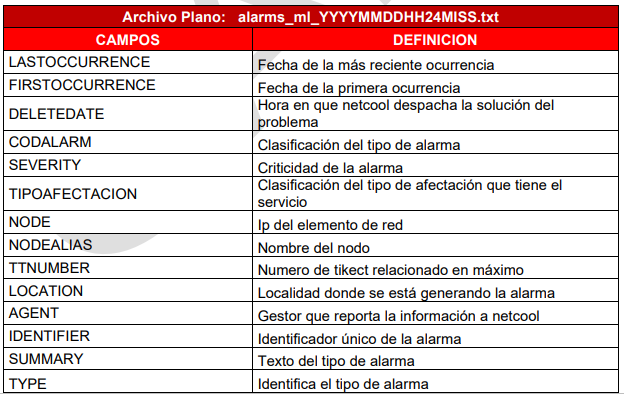
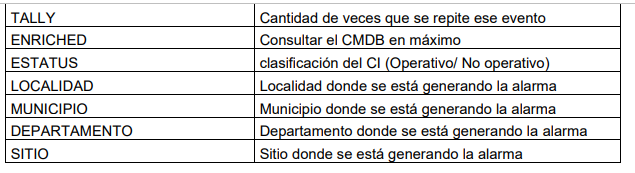

In [170]:
datosFinal.isnull().sum()/len(datosFinal)

Unnamed: 0         0.000000
IDENTIFIER         0.000000
NODE               0.000000
AGENT              0.000000
SEVERITY           0.000000
SUMMARY            0.000000
FIRSTOCCURRENCE    0.000000
LASTOCCURRENCE     0.000000
TYPE               0.000000
TALLY              0.000000
LOCATION           1.000000
DELETEDATE         0.407400
ENRICHED           0.525120
STATUS             0.543604
LOCALIDAD          1.000000
MUNICIPIO          0.546385
DEPARTAMENTO       0.546385
SITIO              0.546385
REGIONAL           0.546385
CODALARM           0.000000
TTNUMBER           0.997573
TECNOLOGIA         0.543604
LATITUD            1.000000
LONGITUD           1.000000
TIPOAFECTACION     0.495006
NODEALIAS          0.000000
CODALARM_2         0.000000
dtype: float64

### Val fechas

In [171]:
datosFinal[datosFinal['FIRSTOCCURRENCE']!=datosFinal['LASTOCCURRENCE']]
# Todas las fechas coinciden}

,Unnamed: 0,IDENTIFIER,NODE,AGENT,SEVERITY,SUMMARY,FIRSTOCCURRENCE,LASTOCCURRENCE,TYPE,TALLY,LOCATION,DELETEDATE,ENRICHED,STATUS,LOCALIDAD,MUNICIPIO,DEPARTAMENTO,SITIO,REGIONAL,CODALARM,TTNUMBER,TECNOLOGIA,LATITUD,LONGITUD,TIPOAFECTACION,NODEALIAS,CODALARM_2
2,107,5.171.16.213 | 913 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.171.16.213,BOSSC,4.0,Major Analog Alarm For Total String Voltage MAC: 0090EA06DCF6 Voltage: -5:0,2022-02-07 23:24:54,2022-02-07 23:31:34,1.0,11.0,NaN,NaN,Y,OPERATING,NaN,BUCARAMANGA,SANTANDER,COMUNEROS 1 - BUCARAMANGA,ORIENTE,913,NaN,FIJA,NaN,NaN,AS,1CM,913.0
3,108,5.171.16.213 | 975 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.171.16.213,BOSSC,4.0,Major Discrete Alarm For Major Alarm MAC: 0090EA06DCF6 Voltage: -5:0,2022-02-07 23:24:54,2022-02-07 23:31:34,1.0,11.0,NaN,NaN,Y,OPERATING,NaN,BUCARAMANGA,SANTANDER,COMUNEROS 1 - BUCARAMANGA,ORIENTE,975,NaN,FIJA,NaN,NaN,AS,1CM,975.0
7,383,5.218.59.9 | 913 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.218.59.9,BOSSC,0.0,Major Analog Alarm For Total String Voltage MAC: 0090EA026961 Voltage: -5:0,2022-02-07 23:25:30,2022-02-07 23:31:42,1.0,9.0,NaN,2022-02-07 23:36:18,Y,OPERATING,NaN,FUSAGASUGA,CUNDINAMARCA,ALTOS DE PEKIN - FUSAGASUGA,ORIENTE,913,NaN,FIJA,NaN,NaN,AS,ELT,913.0
8,389,5.177.57.201 | 913 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.177.57.201,BOSSC,0.0,Major Analog Alarm For Total String Voltage MAC: 0090EA00447E Voltage: -5:0,2022-02-07 23:23:28,2022-02-07 23:31:42,1.0,9.0,NaN,2022-02-07 23:34:18,Y,OPERATING,NaN,CUCUTA,NORTE DE SANTANDER,LA CARORA PYMES - CUCUTA,ORIENTE,913,NaN,FIJA,NaN,NaN,AS,CRA,913.0
9,390,5.218.59.9 | 975 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.218.59.9,BOSSC,0.0,Major Discrete Alarm For Major Alarm MAC: 0090EA026961 Voltage: -5:0,2022-02-07 23:25:30,2022-02-07 23:31:42,1.0,9.0,NaN,2022-02-07 23:36:18,Y,OPERATING,NaN,FUSAGASUGA,CUNDINAMARCA,ALTOS DE PEKIN - FUSAGASUGA,ORIENTE,975,NaN,FIJA,NaN,NaN,AS,ELT,975.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319281,27150,5.161.96.2 | 9332 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.161.96.2,BOSSC,4.0,Battery on Standby Critical MAC: 0090EA00A67B Voltage: 37.60,2022-02-18 00:14:57,2022-02-18 02:44:58,1.0,287.0,NaN,NaN,Y,OPERATING,NaN,CARTAGENA,BOLIVAR,CAMPESTRE 4 - CARTAGENA,COSTA,9332,NaN,FIJA,NaN,NaN,AS,CPD,9332.0
319282,27151,5.180.5.83 | 9332 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.180.5.83,BOSSC,4.0,Battery on Standby Critical MAC: 0090EA18CF1E Voltage: 35.20,2022-02-18 00:14:58,2022-02-18 02:44:58,1.0,295.0,NaN,NaN,Y,OPERATING,NaN,IBAGUE,TOLIMA,SANTA RITA - IBAGUE,OCCIDENTE,9332,NaN,FIJA,NaN,NaN,AS,SRU,9332.0
319283,27152,5.207.4.142 | 9332 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.207.4.142,BOSSC,4.0,Battery on Standby Critical MAC: 0090EA52B3DC Voltage: 37.20,2022-02-17 22:28:58,2022-02-18 02:44:58,1.0,495.0,NaN,NaN,Y,OPERATING,NaN,GIRARDOT,CUNDINAMARCA,VILLA CATALINA - ESPINAL,ORIENTE,9332,NaN,FIJA,NaN,NaN,AS,ECN,9332.0
319284,27159,5.251.42.39 | 9332 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 3,5.251.42.39,BOSSC,3.0,Battery on Standby MAC: 0090EA00BFCB Voltage: 36.40,2022-02-18 02:43:27,2022-02-18 02:44:59,1.0,3.0,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,9332,NaN,NaN,NaN,NaN,AS,BOG2C8022+,9332.0


In [172]:
min_fecha=datosFinal['LASTOCCURRENCE'].min()
print(min_fecha)
max_fecha=datosFinal['LASTOCCURRENCE'].max()
print(max_fecha)

2022-02-07 23:31:32
2022-02-18 02:45:11


In [174]:
# Val identificador
datosFinal['NODE'].nunique()

7750

In [175]:
datosFinal['NODEALIAS'].nunique()

13197

In [176]:
#Por alias o por nodo

In [177]:
maestroNodos=datosFinal[['NODE','NODEALIAS']].drop_duplicates()

In [178]:
maestroNodos.sort_values('NODE')

,NODE,NODEALIAS
594,172.21.150.53,EDR
1092,172.21.150.53,NODO EDR - SAN PEDRO 2
608,172.21.150.69,AEO
1093,172.21.150.69,NODO AEO - SAN PEDRO 1
2575,172.21.150.70,NODO NPE - SAN PEDRO 3
...,...,...
199569,5.99.90.121,DSR
160722,5.99.91.207,C075
160961,5.99.91.207,CALC075PS01-VIP
149067,5.99.91.69,CALIT5PS02


In [179]:
maestroNodos.sample(100)

,NODE,NODEALIAS
104688,5.217.33.195,BAR4SOPS01
42477,5.83.48.188,MEDS5BPS01
97610,5.91.10.159,SLR
55761,172.22.150.131,Nodo S1H - SANTA HELENA 1
150941,5.153.46.151,TRN
...,...,...
6197,172.22.150.171,6DB
75403,5.136.149.67,SINNENPS01
22519,5.197.18.178,VILVBLPS01
228338,5.114.10.62,TUR


In [180]:
### Identificador
datosFinal['IDENTIFIER'].value_counts()

5.19.55.231 | 894 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4            1727
5.48.15.168 | 9332 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4           775 
5.222.32.175 | 894 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4           717 
5.160.10.173 | 9332 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4          691 
5.237.99.1 | 913 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4             665 
                                                                                               ...  
5.131.27.70 | 1012 | Power Supply | 2 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 2 | 18599533    1   
5.218.35.57 | 3304 | Power Supply | 2 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 2 | 18599536    1   
5.218.35.57 | 3304 | Power Supply | 2 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 2 | 18599537    1   
5.218.35.57 | 2 | Power Supply | 2 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 4 | 18599539  

In [181]:
datosFinal[datosFinal['IDENTIFIER']=="5.19.55.231 | 894 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4"]

,Unnamed: 0,IDENTIFIER,NODE,AGENT,SEVERITY,SUMMARY,FIRSTOCCURRENCE,LASTOCCURRENCE,TYPE,TALLY,LOCATION,DELETEDATE,ENRICHED,STATUS,LOCALIDAD,MUNICIPIO,DEPARTAMENTO,SITIO,REGIONAL,CODALARM,TTNUMBER,TECNOLOGIA,LATITUD,LONGITUD,TIPOAFECTACION,NODEALIAS,CODALARM_2
62688,35979,5.19.55.231 | 894 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.19.55.231,BOSSC,4.0,Major Analog Alarm For TimeToCritical MAC: 0090EA013AF1 Voltage: -5:0,2022-02-09 09:22:12,2022-02-09 09:30:21,1.0,7.0,NaN,NaN,Y,OPERATING,NaN,BOGOTA D.C.,BOGOTA D.C,COLSUBSIDIO I 2D - BOGOTA D.C.,CENTRO ORIENTE,894,NaN,FIJA,NaN,NaN,AS,112D,894.0
63114,19445,5.19.55.231 | 894 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.19.55.231,BOSSC,0.0,Major Analog Alarm For TimeToCritical MAC: 0090EA013AF1 Voltage: -5:0,2022-02-09 09:33:47,2022-02-09 09:37:55,1.0,7.0,NaN,2022-02-09 09:43:25,Y,OPERATING,NaN,BOGOTA D.C.,BOGOTA D.C,COLSUBSIDIO I 2D - BOGOTA D.C.,CENTRO ORIENTE,894,NaN,FIJA,NaN,NaN,AS,112D,894.0
63337,1037,5.19.55.231 | 894 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.19.55.231,BOSSC,0.0,Major Analog Alarm For TimeToCritical MAC: 0090EA013AF1 Voltage: -5:0,2022-02-09 09:46:29,2022-02-09 09:47:03,1.0,3.0,NaN,2022-02-09 09:53:25,Y,OPERATING,NaN,BOGOTA D.C.,BOGOTA D.C,COLSUBSIDIO I 2D - BOGOTA D.C.,CENTRO ORIENTE,894,NaN,FIJA,NaN,NaN,AS,112D,894.0
63504,29357,5.19.55.231 | 894 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.19.55.231,BOSSC,0.0,Major Analog Alarm For TimeToCritical MAC: 0090EA013AF1 Voltage: -5:0,2022-02-09 09:54:03,2022-02-09 09:55:03,1.0,3.0,NaN,2022-02-09 10:01:26,Y,OPERATING,NaN,BOGOTA D.C.,BOGOTA D.C,COLSUBSIDIO I 2D - BOGOTA D.C.,CENTRO ORIENTE,894,NaN,FIJA,NaN,NaN,AS,112D,894.0
63652,48150,5.19.55.231 | 894 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.19.55.231,BOSSC,0.0,Major Analog Alarm For TimeToCritical MAC: 0090EA013AF1 Voltage: -5:0,2022-02-09 10:00:09,2022-02-09 10:00:09,1.0,1.0,NaN,NaN,Y,OPERATING,NaN,BOGOTA D.C.,BOGOTA D.C,COLSUBSIDIO I 2D - BOGOTA D.C.,CENTRO ORIENTE,894,NaN,FIJA,NaN,NaN,AS,112D,894.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318675,10168,5.19.55.231 | 894 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.19.55.231,BOSSC,0.0,Major Analog Alarm For TimeToCritical MAC: 0090EA013AF1 Voltage: -5:0,2022-02-18 02:05:06,2022-02-18 02:07:07,1.0,3.0,NaN,2022-02-18 02:11:22,Y,OPERATING,NaN,BOGOTA D.C.,BOGOTA D.C,COLSUBSIDIO I 2D - BOGOTA D.C.,CENTRO ORIENTE,894,NaN,FIJA,NaN,NaN,AS,112D,894.0
318763,20175,5.19.55.231 | 894 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.19.55.231,BOSSC,4.0,Major Analog Alarm For TimeToCritical MAC: 0090EA013AF1 Voltage: -5:0,2022-02-18 02:10:36,2022-02-18 02:11:37,1.0,3.0,NaN,NaN,Y,OPERATING,NaN,BOGOTA D.C.,BOGOTA D.C,COLSUBSIDIO I 2D - BOGOTA D.C.,CENTRO ORIENTE,894,NaN,FIJA,NaN,NaN,AS,112D,894.0
319007,27045,5.19.55.231 | 894 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.19.55.231,BOSSC,0.0,Major Analog Alarm For TimeToCritical MAC: 0090EA013AF1 Voltage: -5:0,2022-02-18 02:22:37,2022-02-18 02:29:36,1.0,3.0,NaN,NaN,Y,OPERATING,NaN,BOGOTA D.C.,BOGOTA D.C,COLSUBSIDIO I 2D - BOGOTA D.C.,CENTRO ORIENTE,894,NaN,FIJA,NaN,NaN,AS,112D,894.0
319146,8784,5.19.55.231 | 894 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4,5.19.55.231,BOSSC,0.0,Major Analog Alarm For TimeToCritical MAC: 0090EA013AF1 Voltage: -5:0,2022-02-18 02:35:06,2022-02-18 02:36:07,1.0,3.0,NaN,2022-02-18 02:39:25,Y,OPERATING,NaN,BOGOTA D.C.,BOGOTA D.C,COLSUBSIDIO I 2D - BOGOTA D.C.,CENTRO ORIENTE,894,NaN,FIJA,NaN,NaN,AS,112D,894.0


### Analisis y formación Series de Tiempo

In [182]:
datosFinal[datosFinal['NODEALIAS']=='EDR']['IDENTIFIER'].value_counts()

172.21.150.53 | 2934 | Optical Nodes | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 2 | 5    104
5.17.19.225 | 969 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 4        1  
5.17.19.225 | 9332 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 3       1  
Name: IDENTIFIER, dtype: int64

In [183]:
datosFinal[datosFinal['NODEALIAS']=='EDR'].drop(columns=['SITIO','LOCALIDAD','MUNICIPIO','DEPARTAMENTO','REGIONAL','TECNOLOGIA','LATITUD','LONGITUD','LOCATION','CODALARM']).sort_values(['IDENTIFIER','LASTOCCURRENCE'])

,Unnamed: 0,IDENTIFIER,NODE,AGENT,SEVERITY,SUMMARY,FIRSTOCCURRENCE,LASTOCCURRENCE,TYPE,TALLY,DELETEDATE,ENRICHED,STATUS,TTNUMBER,TIPOAFECTACION,NODEALIAS,CODALARM_2
594,27965,172.21.150.53 | 2934 | Optical Nodes | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 2 | 5,172.21.150.53,BOSSC,5.0,Site Faulted MAC: 38C85C29A348 Voltage: -5:0,2022-02-07 23:44:07,2022-02-07 23:44:07,1.0,1.0,NaN,Y,OPERATING,NaN,AS,EDR,2934.0
4617,10562,172.21.150.53 | 2934 | Optical Nodes | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 2 | 5,172.21.150.53,BOSSC,0.0,Site Faulted MAC: 38C85C29A348 Voltage: -5:0,2022-02-08 01:06:28,2022-02-08 01:06:28,1.0,1.0,2022-02-08 01:14:27,Y,OPERATING,NaN,AS,EDR,2934.0
11097,10789,172.21.150.53 | 2934 | Optical Nodes | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 2 | 5,172.21.150.53,BOSSC,0.0,Site Faulted MAC: 38C85C29A348 Voltage: -5:0,2022-02-08 03:06:23,2022-02-08 03:06:23,1.0,1.0,2022-02-08 03:14:37,Y,OPERATING,NaN,AS,EDR,2934.0
20804,25784,172.21.150.53 | 2934 | Optical Nodes | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 2 | 5,172.21.150.53,BOSSC,0.0,Site Faulted MAC: 38C85C29A348 Voltage: -5:0,2022-02-08 06:07:42,2022-02-08 06:07:42,1.0,1.0,2022-02-08 06:14:52,Y,OPERATING,NaN,AS,EDR,2934.0
26024,21008,172.21.150.53 | 2934 | Optical Nodes | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 2 | 5,172.21.150.53,BOSSC,0.0,Site Faulted MAC: 38C85C29A348 Voltage: -5:0,2022-02-08 07:51:04,2022-02-08 07:51:04,1.0,1.0,2022-02-08 08:01:05,Y,OPERATING,NaN,AS,EDR,2934.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
310943,9643,172.21.150.53 | 2934 | Optical Nodes | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 2 | 5,172.21.150.53,BOSSC,0.0,Site Faulted MAC: 38C85C29A348 Voltage: -5:0,2022-02-17 19:51:12,2022-02-17 19:51:12,1.0,1.0,2022-02-17 20:00:48,Y,OPERATING,NaN,AS,EDR,2934.0
313388,32609,172.21.150.53 | 2934 | Optical Nodes | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 2 | 5,172.21.150.53,BOSSC,5.0,Site Faulted MAC: 38C85C29A348 Voltage: -5:0,2022-02-17 21:46:00,2022-02-17 21:46:00,1.0,1.0,NaN,Y,OPERATING,NaN,AS,EDR,2934.0
316159,33284,172.21.150.53 | 2934 | Optical Nodes | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 2 | 5,172.21.150.53,BOSSC,5.0,Site Faulted MAC: 38C85C29A348 Voltage: -5:0,2022-02-17 23:45:35,2022-02-17 23:45:35,1.0,1.0,NaN,Y,OPERATING,NaN,AS,EDR,2934.0
77869,24074,5.17.19.225 | 9332 | Power Supply | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 5 | 3,5.17.19.225,BOSSC,0.0,Battery on Standby MAC: 0090EA026DAF Voltage: 36.80,2022-02-09 21:38:46,2022-02-09 21:43:56,1.0,11.0,NaN,Y,OPERATING,NaN,AS,EDR,9332.0


In [184]:
datosFinal[datosFinal['NODEALIAS']=='EDR'][0:1].values

array([[27965,
        '172.21.150.53 | 2934 | Optical Nodes | 1 | BOSSC | MTTrapd Probe on GSRCMDBTRI31 | 2 | 5',
        '172.21.150.53', 'BOSSC', 5.0,
        'Site Faulted     MAC: 38C85C29A348   Voltage:  -5:0',
        '2022-02-07 23:44:07', '2022-02-07 23:44:07', 1.0, 1.0, nan, nan,
        'Y', 'OPERATING', nan, 'BOGOTA D.C.', 'BOGOTA D.C',
        'SAN PEDRO 2 - BOGOTA D.C.', 'CENTRO ORIENTE', 2934, nan, 'FIJA',
        nan, nan, 'AS', 'EDR', 2934.0]], dtype=object)

In [185]:
# Serie de tiempo  NODEALIAS y CODEALARM por día  (máxima severidad)

In [186]:
datosFinal['fecha']=pd.to_datetime(datosFinal['LASTOCCURRENCE']).dt.date

In [187]:
### quitar primer y último
datosFinal=datosFinal[datosFinal['fecha']!=datosFinal['fecha'].min()]
datosFinal=datosFinal[datosFinal['fecha']!=datosFinal['fecha'].max()]

In [188]:
datosFinal['CODALARM_2']=datosFinal['CODALARM_2'].astype(int)

In [189]:
resumenSeries=datosFinal.groupby(['NODEALIAS','CODALARM_2','fecha'])[['SEVERITY']].max().reset_index()
resumenSeries

,NODEALIAS,CODALARM_2,fecha,SEVERITY
0,- CAMPO AZUL,3229,2022-02-12,0.0
1,- CAMPO AZUL,3229,2022-02-17,0.0
2,001AC3FF5272,2934,2022-02-16,5.0
3,001AC3FF5272,2934,2022-02-17,5.0
4,012,1012,2022-02-16,5.0
...,...,...,...,...
62789,ZVZ,913,2022-02-11,4.0
62790,ZVZ,969,2022-02-11,4.0
62791,ZVZ,975,2022-02-11,4.0
62792,ZVZ,1012,2022-02-16,0.0


In [190]:
max_fecha=resumenSeries['fecha'].max()
max_fecha

datetime.date(2022, 2, 17)

In [191]:
## Validacion

In [192]:
resumenSeries['NODEALIAS'].value_counts()

AQL             60
RICAQLPS01      59
CHIUCI3DPS01    58
BOG2FEPS01      57
ZFI             57
                ..
RG5             1 
GRF             1 
GR21            1 
RGE             1 
BOG5B7011-12    1 
Name: NODEALIAS, Length: 13155, dtype: int64

## Frecuencias generales

### Series Nodo_CodAlarm

In [193]:
resumen_dias_alarma=resumenSeries[['NODEALIAS','CODALARM_2']].value_counts().to_frame()
resumen_dias_alarma

0
NODEALIAS              CODALARM_2    
BRS                    2934        10
B55                    2934        10
NODO BEX - BELLO 49    2934        10
NODO B0E - BELLO 10    2934        10
NODO AUC - ARANJUEZ 12 2934        10
...                                ..
CHIMORPS01             9334        1 
                       893         1 
                       833         1 
                       827         1 
ZVZ                    9332        1 

[33129 rows x 1 columns]

In [194]:
resumen_dias_alarma.describe()

,0
count,33129.000000
mean,1.895439
std,2.056655
min,1.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,10.000000


In [195]:
resumen_dias_alarma.value_counts().sort_index(ascending=False)

10    1174 
9     309  
8     276  
7     273  
6     238  
5     332  
4     589  
3     1566 
2     5640 
1     22732
dtype: int64

In [196]:
resumen_dias_alarma_df=resumen_dias_alarma.value_counts().sort_index(ascending=False).to_frame()
resumen_dias_alarma_df.columns=['num_nodos_alarmCodes']

In [197]:
resumen_dias_alarma_df['part']=resumen_dias_alarma_df['num_nodos_alarmCodes']/resumen_dias_alarma_df['num_nodos_alarmCodes'].sum()
resumen_dias_alarma_df.columns=['num_nodos_alarmCodes','part']
resumen_dias_alarma_df.index.name='diasAlarm'
resumen_dias_alarma_df

,num_nodos_alarmCodes,part
0,,
10,1174,0.035437
9,309,0.009327
8,276,0.008331
7,273,0.008241
6,238,0.007184
5,332,0.010021
4,589,0.017779
3,1566,0.047270
2,5640,0.170244


array([[<AxesSubplot:title={'center':'0'}>]], dtype=object)

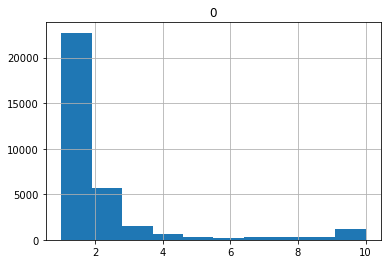

In [198]:
resumen_dias_alarma.hist()

In [199]:
resumen_dias_alarma_df['num_nodos_alarmCodes'].sum()

33129

### Nodo

In [200]:
resumenNodos=datosFinal.groupby(['NODEALIAS','fecha'])[['SEVERITY']].max().reset_index()
resumenNodos

,NODEALIAS,fecha,SEVERITY
0,- CAMPO AZUL,2022-02-12,0.0
1,- CAMPO AZUL,2022-02-17,0.0
2,001AC3FF5272,2022-02-16,5.0
3,001AC3FF5272,2022-02-17,5.0
4,012,2022-02-16,5.0
...,...,...,...
37807,ZUP,2022-02-10,4.0
37808,ZVS,2022-02-15,0.0
37809,ZVT,2022-02-08,4.0
37810,ZVZ,2022-02-11,4.0


In [201]:
resumen_dias_nodo=resumenNodos[['NODEALIAS']].value_counts().to_frame()
resumen_dias_nodo

,0
NODEALIAS,
GS7000 HMS:172.28.152.19:001E6B57B4A2,10
Nodo V2R - CANAVERALES 2,10
Nodo T4L - TRONCAL 4,10
BOGCCOPS01,10
Nodo T6T - TRANSITO 6,10
...,...
MLA,1
MKV,1
MKR,1


In [202]:
resumen_dias_nodo.describe()

,0
count,13155.000000
mean,2.874344
std,2.858017
min,1.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,10.000000


In [203]:
resumen_dias_nodo_df=resumen_dias_nodo.value_counts().sort_index(ascending=False).to_frame()
resumen_dias_nodo_df

,0
0,
10,1128
9,301
8,244
7,241
6,225
5,302
4,510
3,1135
2,2810


In [204]:
resumen_dias_nodo_df['part']=resumen_dias_nodo_df[0]/resumen_dias_nodo_df[0].sum()
resumen_dias_nodo_df.columns=['num_nodos','part']
resumen_dias_nodo_df

,num_nodos,part
0,,
10,1128,0.085747
9,301,0.022881
8,244,0.018548
7,241,0.018320
6,225,0.017104
5,302,0.022957
4,510,0.038769
3,1135,0.086279
2,2810,0.213607


In [205]:
print("numero Nodos: ",len(resumen_dias_nodo))

numero Nodos:  13155


array([[<AxesSubplot:title={'center':'0'}>]], dtype=object)

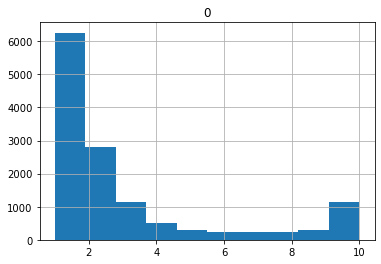

In [206]:
resumen_dias_nodo.hist()

# Preparacion Series

In [207]:
resumenSeries['SEVERITY']=resumenSeries['SEVERITY']+1

In [208]:
resumenSeries['key']=resumenSeries['NODEALIAS']+'---'+resumenSeries['CODALARM_2'].astype(str)

In [209]:
resumenSeries

,NODEALIAS,CODALARM_2,fecha,SEVERITY,key
0,- CAMPO AZUL,3229,2022-02-12,1.0,- CAMPO AZUL---3229
1,- CAMPO AZUL,3229,2022-02-17,1.0,- CAMPO AZUL---3229
2,001AC3FF5272,2934,2022-02-16,6.0,001AC3FF5272---2934
3,001AC3FF5272,2934,2022-02-17,6.0,001AC3FF5272---2934
4,012,1012,2022-02-16,6.0,012---1012
...,...,...,...,...,...
62789,ZVZ,913,2022-02-11,5.0,ZVZ---913
62790,ZVZ,969,2022-02-11,5.0,ZVZ---969
62791,ZVZ,975,2022-02-11,5.0,ZVZ---975
62792,ZVZ,1012,2022-02-16,1.0,ZVZ---1012


In [210]:
resumenSeries_pv=pd.pivot_table(resumenSeries, index=['fecha'], columns=['key'], values=['SEVERITY'])
#resumenSeries_pv['IVE--3304']
resumenSeries_pv.columns = resumenSeries_pv.columns.droplevel()

In [211]:
resumenSeries_pv['IVE---3304']

fecha
2022-02-08    6.0
2022-02-09    6.0
2022-02-10    6.0
2022-02-11    6.0
2022-02-12    6.0
2022-02-13    6.0
2022-02-14    6.0
2022-02-15    6.0
2022-02-16    6.0
2022-02-17    6.0
Name: IVE---3304, dtype: float64

In [212]:
dias_totales=len(resumenSeries_pv)
dias_totales

10

In [213]:
resumenSeries_pv.fillna(0, inplace=True)

In [214]:
resumenSeries_un=resumenSeries_pv.reset_index().melt(id_vars=['fecha'], var_name='key', value_name='SEVERITY')
resumenSeries_un.set_index('fecha',inplace=True)
resumenSeries_un

,key,SEVERITY
fecha,,
2022-02-08,- CAMPO AZUL---3229,0.0
2022-02-09,- CAMPO AZUL---3229,0.0
2022-02-10,- CAMPO AZUL---3229,0.0
2022-02-11,- CAMPO AZUL---3229,0.0
2022-02-12,- CAMPO AZUL---3229,1.0
...,...,...
2022-02-13,ZVZ---975,0.0
2022-02-14,ZVZ---975,0.0
2022-02-15,ZVZ---975,0.0


#  Recurrencia de Eventos

In [215]:
resumenSeries_un=resumenSeries_un.sort_values(['key','fecha'])

In [216]:
resumenSeries_un

,key,SEVERITY
fecha,,
2022-02-08,- CAMPO AZUL---3229,0.0
2022-02-09,- CAMPO AZUL---3229,0.0
2022-02-10,- CAMPO AZUL---3229,0.0
2022-02-11,- CAMPO AZUL---3229,0.0
2022-02-12,- CAMPO AZUL---3229,1.0
...,...,...
2022-02-13,ZVZ---975,0.0
2022-02-14,ZVZ---975,0.0
2022-02-15,ZVZ---975,0.0


In [217]:
resumenSeries_un.reset_index()

,fecha,key,SEVERITY
0,2022-02-08,- CAMPO AZUL---3229,0.0
1,2022-02-09,- CAMPO AZUL---3229,0.0
2,2022-02-10,- CAMPO AZUL---3229,0.0
3,2022-02-11,- CAMPO AZUL---3229,0.0
4,2022-02-12,- CAMPO AZUL---3229,1.0
...,...,...,...
331285,2022-02-13,ZVZ---975,0.0
331286,2022-02-14,ZVZ---975,0.0
331287,2022-02-15,ZVZ---975,0.0
331288,2022-02-16,ZVZ---975,0.0


In [218]:
resumenSeries_un_nonZero=resumenSeries_un.reset_index()
resumenSeries_un_nonZero=resumenSeries_un_nonZero[resumenSeries_un_nonZero['SEVERITY']!=0].reset_index()

In [219]:
resumenSeries_un_nonZero['sig_event']=resumenSeries_un_nonZero.groupby('key')['index'].shift(periods=-1)

In [220]:
resumenSeries_un_nonZero['dias_inter_event']=resumenSeries_un_nonZero['sig_event']-resumenSeries_un_nonZero['index']

In [221]:
resumenSeries_un_nonZero['dias_inter_event'].describe()

count    29665.000000
mean     1.777785    
std      1.563032    
min      1.000000    
25%      1.000000    
50%      1.000000    
75%      2.000000    
max      9.000000    
Name: dias_inter_event, dtype: float64

<AxesSubplot:>

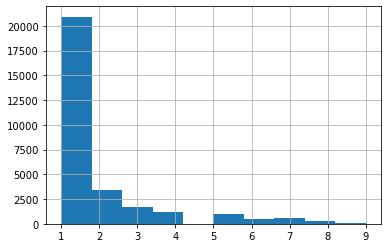

In [222]:
resumenSeries_un_nonZero['dias_inter_event'].hist()

In [223]:
resumenSeries_un_nonZero_df=resumenSeries_un_nonZero['dias_inter_event'].value_counts().to_frame()
resumenSeries_un_nonZero_df

,dias_inter_event
1.0,20925
2.0,3394
3.0,1723
4.0,1203
5.0,942
7.0,559
6.0,507
8.0,329
9.0,83


In [224]:
resumenSeries_un_nonZero_df['part']=resumenSeries_un_nonZero['dias_inter_event'].value_counts()/len(resumenSeries_un_nonZero)
resumenSeries_un_nonZero_df

,dias_inter_event,part
1.0,20925,0.333232
2.0,3394,0.054050
3.0,1723,0.027439
4.0,1203,0.019158
5.0,942,0.015001
7.0,559,0.008902
6.0,507,0.008074
8.0,329,0.005239
9.0,83,0.001322


In [225]:
resumenSeries_un_nonZero

,index,fecha,key,SEVERITY,sig_event,dias_inter_event
0,4,2022-02-12,- CAMPO AZUL---3229,1.0,9.0,5.0
1,9,2022-02-17,- CAMPO AZUL---3229,1.0,NaN,NaN
2,18,2022-02-16,001AC3FF5272---2934,6.0,19.0,1.0
3,19,2022-02-17,001AC3FF5272---2934,6.0,NaN,NaN
4,28,2022-02-16,012---1012,6.0,NaN,NaN
...,...,...,...,...,...,...
62789,331243,2022-02-11,ZVZ---904,5.0,NaN,NaN
62790,331253,2022-02-11,ZVZ---913,5.0,NaN,NaN
62791,331263,2022-02-11,ZVZ---9332,5.0,NaN,NaN
62792,331273,2022-02-11,ZVZ---969,5.0,NaN,NaN


In [226]:
resumenSeries_un_nonZero[['NODO','code']] = resumenSeries_un_nonZero['key'].str.split('---',expand=True)

In [227]:
resumenSeries_un_nonZero

,index,fecha,key,SEVERITY,sig_event,dias_inter_event,NODO,code
0,4,2022-02-12,- CAMPO AZUL---3229,1.0,9.0,5.0,- CAMPO AZUL,3229
1,9,2022-02-17,- CAMPO AZUL---3229,1.0,NaN,NaN,- CAMPO AZUL,3229
2,18,2022-02-16,001AC3FF5272---2934,6.0,19.0,1.0,001AC3FF5272,2934
3,19,2022-02-17,001AC3FF5272---2934,6.0,NaN,NaN,001AC3FF5272,2934
4,28,2022-02-16,012---1012,6.0,NaN,NaN,012,1012
...,...,...,...,...,...,...,...,...
62789,331243,2022-02-11,ZVZ---904,5.0,NaN,NaN,ZVZ,904
62790,331253,2022-02-11,ZVZ---913,5.0,NaN,NaN,ZVZ,913
62791,331263,2022-02-11,ZVZ---9332,5.0,NaN,NaN,ZVZ,9332
62792,331273,2022-02-11,ZVZ---969,5.0,NaN,NaN,ZVZ,969


# Validacion Espacial

## Exploración
* Ordernar por area

In [228]:
import geopandas
import matplotlib.pyplot as plt  # Graphics
from matplotlib import colors

In [229]:
gdf1 = geopandas.read_file("espacial/OCTUBRE/COBERTURA_UNIF_OCTUBRE.shp")

In [230]:
gdf1

NODO TIPO           mpio_cnmbr    dpto_cnmbr       DIVISION  \
0      LSU   HFC  ZIPAQUIRÁ            CUNDINAMARCA  REGION CENTRO   
1      EDZ   HFC  ZIPAQUIRÁ            CUNDINAMARCA  REGION CENTRO   
2      MZQ   HFC  ZIPAQUIRÁ            CUNDINAMARCA  REGION CENTRO   
3      ULB   HFC  ZIPAQUIRÁ            CUNDINAMARCA  REGION CENTRO   
4      ZSP   HFC  ZIPAQUIRÁ            CUNDINAMARCA  REGION CENTRO   
...    ...   ...        ...                     ...            ...   
18269  None  DTH  FUSAGASUGÁ           CUNDINAMARCA  None            
18270  None  DTH  SAN JUAN DE RIOSECO  CUNDINAMARCA  None            
18271  None  DTH  HONDA                TOLIMA        None            
18272  None  DTH  SABANETA             ANTIOQUIA     None            
18273  None  DTH  LA ESTRELLA          ANTIOQUIA     None            

               AREA          ZONA   DISTRITO  \
0      BOGOTA NORTE  SABANA NORTE  ZIPAQUIRA   
1      BOGOTA NORTE  SABANA NORTE  ZIPAQUIRA   
2      BOGOTA NORTE  SABANA NORTE  ZIPAQUIRA   
3      BOGOTA NORTE  SABANA NORTE  ZIPAQUIRA   
4      BOGOTA NORTE  SABANA NORTE  ZIPAQUIRA   
...             ...           ...        ...   
18269  None          None          None        
18270  None          None          None        
18271  None          None          None        
18272  None          None          None        
18273  None          None          None        

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [231]:
gdf1['NODO'].nunique()

16918

In [232]:
len(gdf1)

18274

In [233]:
#gdf2['NODO'].nunique()

In [234]:
#len(gdf2)

<AxesSubplot:>

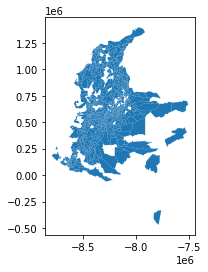

In [235]:
gdf1.plot()

In [236]:
#gdf2.plot()

In [237]:
gdf1[gdf1['NODO']=='LSU']

,NODO,TIPO,mpio_cnmbr,dpto_cnmbr,DIVISION,AREA,ZONA,DISTRITO,geometry
0,LSU,HFC,ZIPAQUIRÁ,CUNDINAMARCA,REGION CENTRO,BOGOTA NORTE,SABANA NORTE,ZIPAQUIRA,"POLYGON ((-8236564.189 560360.757, -8236558.512 560366.903, -8236589.459 560536.204, -8236487.156 560578.557, -8236345.001 560427.024, -8236551.499 560363.104, -8236556.508 560355.169, -8236531.016 560207.772, -8236594.691 560198.162, -8236644.117 560191.680, -8236658.588 560267.334, -8236664.266 560266.552, -8236677.735 560340.307, -8236564.189 560360.757))"


In [238]:
gdf1['NODO'].value_counts()

TOBG27    7
DTBG06    7
POBG51    7
DTBG05    7
POBG93    6
         ..
4A7013    1
4A0012    1
4A0013    1
4A6012    1
CNCL38    1
Name: NODO, Length: 16918, dtype: int64

In [239]:
gdf1[gdf1['NODO']=='TOBG27']

,NODO,TIPO,mpio_cnmbr,dpto_cnmbr,DIVISION,AREA,ZONA,DISTRITO,geometry
14485,TOBG27,FTTH,"BOGOTÁ, D.C.","BOGOTÁ, D.C.",None,None,None,None,"POLYGON ((-8240645.830 525061.584, -8240644.271 525093.417, -8240624.902 525092.300, -8240626.460 525056.446, -8240645.830 525061.584))"
14486,TOBG27,FTTH,"BOGOTÁ, D.C.","BOGOTÁ, D.C.",None,None,None,None,"POLYGON ((-8240522.933 525063.147, -8240510.354 525086.045, -8240474.732 525084.035, -8240505.233 525042.930, -8240522.933 525063.147))"
14487,TOBG27,FTTH,"BOGOTÁ, D.C.","BOGOTÁ, D.C.",None,None,None,None,"POLYGON ((-8240543.861 525059.461, -8240543.527 525087.832, -8240510.354 525086.045, -8240522.933 525063.147, -8240537.182 525061.025, -8240543.861 525059.461))"
14488,TOBG27,FTTH,"BOGOTÁ, D.C.","BOGOTÁ, D.C.",None,None,None,None,"POLYGON ((-8240565.123 525054.212, -8240564.344 525088.949, -8240543.527 525087.832, -8240543.861 525059.461, -8240565.123 525054.212))"
14489,TOBG27,FTTH,"BOGOTÁ, D.C.","BOGOTÁ, D.C.",None,None,None,None,"POLYGON ((-8240606.868 525051.307, -8240604.642 525091.183, -8240585.272 525090.178, -8240587.165 525048.850, -8240589.168 525048.292, -8240606.868 525051.307))"
14490,TOBG27,FTTH,"BOGOTÁ, D.C.","BOGOTÁ, D.C.",None,None,None,None,"POLYGON ((-8240626.460 525056.446, -8240624.902 525092.300, -8240604.642 525091.183, -8240606.868 525051.307, -8240607.870 525051.419, -8240626.460 525056.446))"
14491,TOBG27,FTTH,"BOGOTÁ, D.C.","BOGOTÁ, D.C.",None,None,None,None,"POLYGON ((-8240664.643 525094.534, -8240666.201 525067.615, -8240676.777 525069.849, -8240689.356 525071.190, -8240688.465 525095.763, -8240664.643 525094.534))"


<AxesSubplot:>

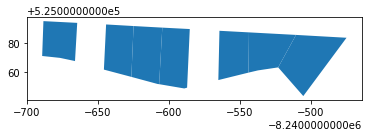

In [240]:
gdf1[gdf1['NODO']=='TOBG27'].plot()

In [241]:
gdf12 = gdf1.dissolve(by='NODO').reset_index()

<AxesSubplot:>

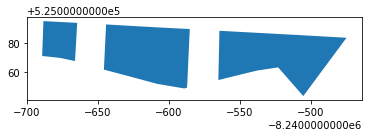

In [242]:
gdf12[gdf12['NODO']=='TOBG27'].plot()

In [243]:
gdf12[gdf12['NODO']=='TOBG27']

,NODO,geometry,TIPO,mpio_cnmbr,dpto_cnmbr,DIVISION,AREA,ZONA,DISTRITO
15468,TOBG27,"MULTIPOLYGON (((-8240474.732 525084.035, -8240505.233 525042.930, -8240522.933 525063.147, -8240537.182 525061.025, -8240543.861 525059.461, -8240565.123 525054.212, -8240564.344 525088.949, -8240543.527 525087.832, -8240510.354 525086.045, -8240474.732 525084.035)), ((-8240587.165 525048.850, -8240589.168 525048.292, -8240606.868 525051.307, -8240607.870 525051.419, -8240626.460 525056.446, -8240645.830 525061.584, -8240644.271 525093.417, -8240624.902 525092.300, -8240604.642 525091.183, -8240585.272 525090.178, -8240587.165 525048.850)), ((-8240689.356 525071.190, -8240688.465 525095.763, -8240664.643 525094.534, -8240666.201 525067.615, -8240676.777 525069.849, -8240689.356 525071.190)))",FTTH,"BOGOTÁ, D.C.","BOGOTÁ, D.C.",None,None,None,None


-8240689.355806214 525042.9302334791 -8240474.731841618 525095.7629008082
-8795376.453206109 -471243.533192914 -7504024.960798843 1398041.1861394434


<AxesSubplot:>

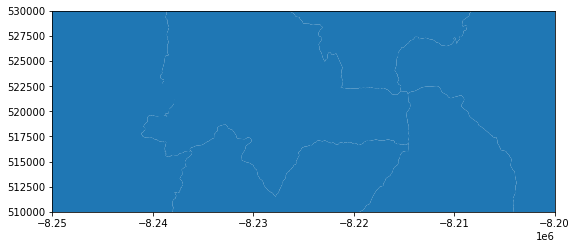

In [351]:
f, ax = plt.subplots(1, figsize=(9, 9))
minx, miny, maxx, maxy = gdf1[gdf1['NODO']=='TOBG27'].total_bounds
minx_t, miny_t, maxx_t, maxy_t = gdf1.total_bounds
print(minx, miny, maxx, maxy)
print(minx_t, miny_t, maxx_t, maxy_t)
#ax.set_xlim(-8795376, -7504024)
ax.set_xlim(-8250000, -8200000)
#ax.set_ylim(-471243, 1398041)
ax.set_ylim(510000, 530000)
gdf1.plot(ax=ax, linewidth=1)

-8240689.355806214 525042.9302334791 -8240474.731841618 525095.7629008082
-8795376.453206109 -471243.533192914 -7504024.960798843 1398041.1861394434


<AxesSubplot:>

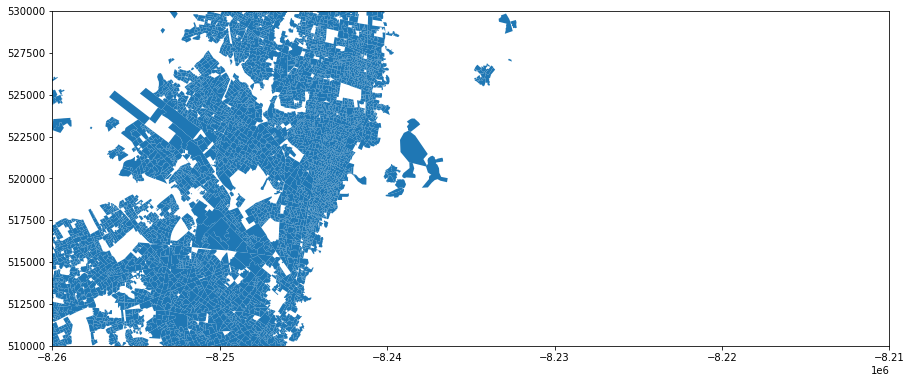

In [357]:
f, ax = plt.subplots(1, figsize=(15, 9))
minx, miny, maxx, maxy = gdf1[gdf1['NODO']=='TOBG27'].total_bounds
minx_t, miny_t, maxx_t, maxy_t = gdf1.total_bounds
print(minx, miny, maxx, maxy)
print(minx_t, miny_t, maxx_t, maxy_t)
#ax.set_xlim(-8795376, -7504024)
#ax.set_xlim(-8250000, -8200000)
ax.set_xlim(-8260000, -8210000)
#ax.set_ylim(-471243, 1398041)
ax.set_ylim(510000, 530000)
gdf12.plot(ax=ax, linewidth=1)

In [358]:
gdf12['NODO'].value_counts()

01J      1
NC4      1
NB3      1
NBA      1
NBB      1
        ..
C1S      1
C1T      1
C1U      1
C1U2D    1
ZVZ      1
Name: NODO, Length: 16918, dtype: int64

<AxesSubplot:>

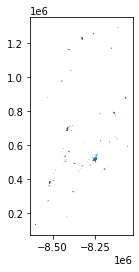

In [359]:
gdf12.plot()

In [360]:
type(gdf12)

geopandas.geodataframe.GeoDataFrame

## CRUCE DE NODOS

In [246]:
NodosAlarmas=maestroNodos[['NODEALIAS']].drop_duplicates()
NodosAlarmas

,NODEALIAS
0,SRL
1,LCALC1PS01
2,1CM
4,TUNF3NPS01
5,LCALC2PS01
...,...
319085,RQU
319087,MEDTBOPS02
319110,MI3
319218,BOGRQUPS01


In [247]:
NodosGeografia=gdf12[['NODO']].drop_duplicates()

In [248]:
NodosGeografia

,NODO
0,01J
1,01S
2,02J
3,02S
4,03J
...,...
16913,ZVD
16914,ZVG
16915,ZVS
16916,ZVT


In [249]:
# Validar nodos en alarmas que no están en geografía

In [250]:
validacion=NodosAlarmas.merge(NodosGeografia, left_on='NODEALIAS', right_on='NODO', how='left')

In [251]:
len(validacion)

13197

In [252]:
validacion.isnull().sum()

NODEALIAS    0   
NODO         7334
dtype: int64

In [253]:
validacion[validacion['NODO'].isnull()]

,NODEALIAS,NODO
1,LCALC1PS01,NaN
3,TUNF3NPS01,NaN
4,LCALC2PS01,NaN
5,MEDVCSPS01,NaN
9,MEDNTLPS01,NaN
...,...,...
13188,BOGLMN1PS01,NaN
13191,CUC1VOPS01,NaN
13193,MEDTBOPS02,NaN
13195,BOGRQUPS01,NaN


### Transformación
1. Quitar a la derecha del -
2. validar reemplazar + por coma
3. separar por comas
4. validar como compilar

In [254]:
validacion[(validacion['NODEALIAS'].str.contains("\-VIP"))&(validacion['NODO'].isnull())]
# -VIP
# - con espacios
# sig + por coma
# Palabra Nodo
# al quitar ps validar que el remanente tenga más 3 caracteres

,NODEALIAS,NODO
69,CALDJ3PS01-VIP,NaN
183,CARLT7PS01-VIP,NaN
244,CAR2BDPS01-VIP,NaN
256,MEDCF3PS01-VIP,NaN
260,PIERU2PS01-VIP,NaN
...,...,...
13012,LCARLEPS01-VIP,NaN
13046,MEDBYCPS01-VIP,NaN
13083,JAMPEHPS01-VIP,NaN
13085,JAMPVHPS02-VIP,NaN


In [255]:
### -VIP

In [256]:
validacion['trans1']=np.where((validacion['NODO'].isnull())&(validacion['NODEALIAS'].str.contains("\-VIP")), validacion['NODEALIAS'].str.split("\-VIP").str[0],validacion['NODEALIAS'])

In [257]:
validacion[(validacion['NODEALIAS'].str.contains("\-VIP"))&(validacion['NODO'].isnull())]

,NODEALIAS,NODO,trans1
69,CALDJ3PS01-VIP,NaN,CALDJ3PS01
183,CARLT7PS01-VIP,NaN,CARLT7PS01
244,CAR2BDPS01-VIP,NaN,CAR2BDPS01
256,MEDCF3PS01-VIP,NaN,MEDCF3PS01
260,PIERU2PS01-VIP,NaN,PIERU2PS01
...,...,...,...
13012,LCARLEPS01-VIP,NaN,LCARLEPS01
13046,MEDBYCPS01-VIP,NaN,MEDBYCPS01
13083,JAMPEHPS01-VIP,NaN,JAMPEHPS01
13085,JAMPVHPS02-VIP,NaN,JAMPVHPS02


In [258]:
# - espacio

In [259]:
validacion[(validacion['NODEALIAS'].str.contains("\- "))&(validacion['NODO'].isnull())].sample(50)

,NODEALIAS,NODO,trans1
6618,NODO JD2 - JORDAN 2,NaN,NODO JD2 - JORDAN 2
9560,NODO LPV1. - LA PRIMAVERA 1,NaN,NODO LPV1. - LA PRIMAVERA 1
12639,NODO 2FE. - SANTA FE 2,NaN,NODO 2FE. - SANTA FE 2
4970,NODO SS31. - SAN PEDRO SUBA III1,NaN,NODO SS31. - SAN PEDRO SUBA III1
799,NODO A3T - ATALAYA 3,NaN,NODO A3T - ATALAYA 3
2868,NODO SGZ2. - GONZALO ARANGO 2,NaN,NODO SGZ2. - GONZALO ARANGO 2
961,Nodo EXT - Exito,NaN,Nodo EXT - Exito
10141,NODO TLB1. - TUNAL ANTIGUO 1,NaN,NODO TLB1. - TUNAL ANTIGUO 1
5271,Nodo CCS - ACACIAS,NaN,Nodo CCS - ACACIAS
6898,NODO C2G1. - PYMES CTGENA BOSQUES 21,NaN,NODO C2G1. - PYMES CTGENA BOSQUES 21


In [260]:
validacion['trans2']=np.where((validacion['NODO'].isnull())&(validacion['trans1'].str.contains("\- ")), validacion['NODEALIAS'].str.split("\- ").str[0],validacion['trans1'])

In [265]:
validacion[(validacion['trans2'].str.contains("\-"))&(validacion['NODO'].isnull())]

,NODEALIAS,NODO,trans1,trans2
42,BOG2C2011-14_P2,NaN,BOG2C2011-14_P2,BOG2C2011-14_P2
91,BOG8C4013-14,NaN,BOG8C4013-14,BOG8C4013-14
115,BOG5A9012-14,NaN,BOG5A9012-14,BOG5A9012-14
274,EIB-B,NaN,EIB-B,EIB-B
356,ESPEIB-BPS02,NaN,ESPEIB-BPS02,ESPEIB-BPS02
...,...,...,...,...
12576,BOG32A013-14,NaN,BOG32A013-14,BOG32A013-14
12857,BOG5C8011-12,NaN,BOG5C8011-12,BOG5C8011-12
13036,BOG8C4023-24,NaN,BOG8C4023-24,BOG8C4023-24
13053,BOG5B3011-21,NaN,BOG5B3011-21,BOG5B3011-21


In [ ]:
# + por coma

In [263]:
validacion[(validacion['trans2'].str.contains("\+"))&(validacion['NODO'].isnull())].sample(50)

,NODEALIAS,NODO,trans1,trans2
2717,BOG3BF012+13-VIP,NaN,BOG3BF012+13,BOG3BF012+13
4989,BOG3A4023+24-VIP,NaN,BOG3A4023+24,BOG3A4023+24
7544,MON1VIPS01+,NaN,MON1VIPS01+,MON1VIPS01+
219,ENV4ESPS01+,NaN,ENV4ESPS01+,ENV4ESPS01+
4555,BARGD2PS01+,NaN,BARGD2PS01+,BARGD2PS01+
2401,SMA3LVPS01+,NaN,SMA3LVPS01+,SMA3LVPS01+
11642,NEIEACPS01+,NaN,NEIEACPS01+,NEIEACPS01+
8228,"CALC031PS01+(2,3,4)D",NaN,"CALC031PS01+(2,3,4)D","CALC031PS01+(2,3,4)D"
12282,FLORYLPS01+C1V+C2V,NaN,FLORYLPS01+C1V+C2V,FLORYLPS01+C1V+C2V
12569,PALC373PS01+C37,NaN,PALC373PS01+C37,PALC373PS01+C37


In [266]:
validacion['trans3'] = validacion['trans2'].str.replace('+',',')

In [268]:
validacion[(validacion['trans2'].str.contains("\+"))&(validacion['NODO'].isnull())]

,NODEALIAS,NODO,trans1,trans2,trans3
88,GIREM1PS01+,NaN,GIREM1PS01+,GIREM1PS01+,"GIREM1PS01,"
146,BOG460023+24,NaN,BOG460023+24,BOG460023+24,"BOG460023,24"
182,CUC4LSPS01+,NaN,CUC4LSPS01+,CUC4LSPS01+,"CUC4LSPS01,"
219,ENV4ESPS01+,NaN,ENV4ESPS01+,ENV4ESPS01+,"ENV4ESPS01,"
238,MON6VIPS01+,NaN,MON6VIPS01+,MON6VIPS01+,"MON6VIPS01,"
...,...,...,...,...,...
12495,BOG3A8012-13+,NaN,BOG3A8012-13+,BOG3A8012-13+,"BOG3A8012-13,"
12569,PALC373PS01+C37,NaN,PALC373PS01+C37,PALC373PS01+C37,"PALC373PS01,C37"
12669,GIR4GAPS01+,NaN,GIR4GAPS01+,GIR4GAPS01+,"GIR4GAPS01,"
13118,POPC1JPS01+,NaN,POPC1JPS01+,POPC1JPS01+,"POPC1JPS01,"


In [269]:
## Quitar palabra nodo,  previo pasar a mayuscula

In [270]:
validacion['trans4'] = validacion['trans3'].str.upper()

In [272]:
validacion[(validacion['trans3'].str.contains("NODO"))&(validacion['NODO'].isnull())]

,NODEALIAS,NODO,trans1,trans2,trans3,trans4
64,NODO ATN - ANTONIO NARINO,NaN,NODO ATN - ANTONIO NARINO,NODO ATN,NODO ATN,NODO ATN
236,NODO GB1 - GUABAL 1,NaN,NODO GB1 - GUABAL 1,NODO GB1,NODO GB1,NODO GB1
268,NODO VDR - VALDERROBLES 1,NaN,NODO VDR - VALDERROBLES 1,NODO VDR,NODO VDR,NODO VDR
331,NODO J3G - JOSE H GARCES 3,NaN,NODO J3G - JOSE H GARCES 3,NODO J3G,NODO J3G,NODO J3G
358,NODO RDV1. - RIVERA DEL VALLE 1,NaN,NODO RDV1. - RIVERA DEL VALLE 1,NODO RDV1.,NODO RDV1.,NODO RDV1.
...,...,...,...,...,...,...
13020,NODO 0DB. - CIUDAD CORDOBA 10,NaN,NODO 0DB. - CIUDAD CORDOBA 10,NODO 0DB.,NODO 0DB.,NODO 0DB.
13048,NODO MZE. - CARIBE MANZANA 19,NaN,NODO MZE. - CARIBE MANZANA 19,NODO MZE.,NODO MZE.,NODO MZE.
13167,"NODO PRI,PRI2D,PRI3D,PRI4D.",NaN,"NODO PRI,PRI2D,PRI3D,PRI4D.","NODO PRI,PRI2D,PRI3D,PRI4D.","NODO PRI,PRI2D,PRI3D,PRI4D.","NODO PRI,PRI2D,PRI3D,PRI4D."
13168,NODO MS11. - MOLINOS LA CARACAS,NaN,NODO MS11. - MOLINOS LA CARACAS,NODO MS11.,NODO MS11.,NODO MS11.


In [273]:
validacion['trans5'] = validacion['trans4'].str.replace('NODO ','')

In [276]:
validacion[(validacion['trans5'].str.contains("NODO"))&(validacion['NODO'].isnull())]

,NODEALIAS,NODO,trans1,trans2,trans3,trans4,trans5


In [277]:
# punto por coma

In [279]:
validacion['trans6'] = validacion['trans5'].str.replace('.',',')

In [282]:
validacion[(validacion['trans6'].str.contains(","))&(validacion['NODO'].isnull())]

,NODEALIAS,NODO,trans1,trans2,trans3,trans4,trans5,trans6
88,GIREM1PS01+,NaN,GIREM1PS01+,GIREM1PS01+,"GIREM1PS01,","GIREM1PS01,","GIREM1PS01,","GIREM1PS01,"
146,BOG460023+24,NaN,BOG460023+24,BOG460023+24,"BOG460023,24","BOG460023,24","BOG460023,24","BOG460023,24"
182,CUC4LSPS01+,NaN,CUC4LSPS01+,CUC4LSPS01+,"CUC4LSPS01,","CUC4LSPS01,","CUC4LSPS01,","CUC4LSPS01,"
219,ENV4ESPS01+,NaN,ENV4ESPS01+,ENV4ESPS01+,"ENV4ESPS01,","ENV4ESPS01,","ENV4ESPS01,","ENV4ESPS01,"
238,MON6VIPS01+,NaN,MON6VIPS01+,MON6VIPS01+,"MON6VIPS01,","MON6VIPS01,","MON6VIPS01,","MON6VIPS01,"
...,...,...,...,...,...,...,...,...
13118,POPC1JPS01+,NaN,POPC1JPS01+,POPC1JPS01+,"POPC1JPS01,","POPC1JPS01,","POPC1JPS01,","POPC1JPS01,"
13167,"NODO PRI,PRI2D,PRI3D,PRI4D.",NaN,"NODO PRI,PRI2D,PRI3D,PRI4D.","NODO PRI,PRI2D,PRI3D,PRI4D.","NODO PRI,PRI2D,PRI3D,PRI4D.","NODO PRI,PRI2D,PRI3D,PRI4D.","PRI,PRI2D,PRI3D,PRI4D.","PRI,PRI2D,PRI3D,PRI4D,"
13168,NODO MS11. - MOLINOS LA CARACAS,NaN,NODO MS11. - MOLINOS LA CARACAS,NODO MS11.,NODO MS11.,NODO MS11.,MS11.,"MS11,"
13185,NODO QUA. - PARQUES DE CATALUA,NaN,NODO QUA. - PARQUES DE CATALUA,NODO QUA.,NODO QUA.,NODO QUA.,QUA.,"QUA,"


In [ ]:
## Quitar caracteres ocultos

In [307]:
validacion['trans7']=validacion['trans6'].str.replace('[^a-zA-Z0-9,]', '')

In [308]:
## Quitar ultima coma

In [309]:
validacion['trans8']=np.where((validacion['NODO'].isnull())&(validacion['trans7'].str[-1]==','), validacion['trans7'].str[:-1],validacion['trans7'])
#validacion['trans8']=validacion['trans7'].str[-1]

In [310]:
validacion[(validacion['trans7'].str.contains(","))&(validacion['NODO'].isnull())]

,NODEALIAS,NODO,trans1,trans2,trans3,trans4,trans5,trans6,trans7,trans8,trans9
88,GIREM1PS01+,NaN,GIREM1PS01+,GIREM1PS01+,"GIREM1PS01,","GIREM1PS01,","GIREM1PS01,","GIREM1PS01,","GIREM1PS01,",GIREM1PS01,[GIREMPS]
146,BOG460023+24,NaN,BOG460023+24,BOG460023+24,"BOG460023,24","BOG460023,24","BOG460023,24","BOG460023,24","BOG460023,24","BOG460023,24",[BOG]
182,CUC4LSPS01+,NaN,CUC4LSPS01+,CUC4LSPS01+,"CUC4LSPS01,","CUC4LSPS01,","CUC4LSPS01,","CUC4LSPS01,","CUC4LSPS01,",CUC4LSPS01,[CUCLSPS]
219,ENV4ESPS01+,NaN,ENV4ESPS01+,ENV4ESPS01+,"ENV4ESPS01,","ENV4ESPS01,","ENV4ESPS01,","ENV4ESPS01,","ENV4ESPS01,",ENV4ESPS01,[ENVESPS]
238,MON6VIPS01+,NaN,MON6VIPS01+,MON6VIPS01+,"MON6VIPS01,","MON6VIPS01,","MON6VIPS01,","MON6VIPS01,","MON6VIPS01,",MON6VIPS01,[MONVIPS]
...,...,...,...,...,...,...,...,...,...,...,...
13118,POPC1JPS01+,NaN,POPC1JPS01+,POPC1JPS01+,"POPC1JPS01,","POPC1JPS01,","POPC1JPS01,","POPC1JPS01,","POPC1JPS01,",POPC1JPS01,[POPCJPS]
13167,"NODO PRI,PRI2D,PRI3D,PRI4D.",NaN,"NODO PRI,PRI2D,PRI3D,PRI4D.","NODO PRI,PRI2D,PRI3D,PRI4D.","NODO PRI,PRI2D,PRI3D,PRI4D.","NODO PRI,PRI2D,PRI3D,PRI4D.","PRI,PRI2D,PRI3D,PRI4D.","PRI,PRI2D,PRI3D,PRI4D,","PRI,PRI2D,PRI3D,PRI4D,","PRI,PRI2D,PRI3D,PRI4D","[PRI, PRID, PRID, PRID]"
13168,NODO MS11. - MOLINOS LA CARACAS,NaN,NODO MS11. - MOLINOS LA CARACAS,NODO MS11.,NODO MS11.,NODO MS11.,MS11.,"MS11,","MS11,",MS11,[MS]
13185,NODO QUA. - PARQUES DE CATALUA,NaN,NODO QUA. - PARQUES DE CATALUA,NODO QUA.,NODO QUA.,NODO QUA.,QUA.,"QUA,","QUA,",QUA,[QUA]


In [ ]:
# Separar por comas

In [311]:
validacion['trans9'] = validacion['trans8'].str.split(",")

In [312]:
validacion[(validacion['trans8'].str.contains(","))&(validacion['NODO'].isnull())]

,NODEALIAS,NODO,trans1,trans2,trans3,trans4,trans5,trans6,trans7,trans8,trans9
146,BOG460023+24,NaN,BOG460023+24,BOG460023+24,"BOG460023,24","BOG460023,24","BOG460023,24","BOG460023,24","BOG460023,24","BOG460023,24","[BOG460023, 24]"
397,Nodo P2N.PANDIGUANDO 2,NaN,Nodo P2N.PANDIGUANDO 2,Nodo P2N.PANDIGUANDO 2,Nodo P2N.PANDIGUANDO 2,NODO P2N.PANDIGUANDO 2,P2N.PANDIGUANDO 2,"P2N,PANDIGUANDO 2","P2N,PANDIGUANDO2","P2N,PANDIGUANDO2","[P2N, PANDIGUANDO2]"
551,GS7000 HMS:172.24.151.21:001E6B5799D6,NaN,GS7000 HMS:172.24.151.21:001E6B5799D6,GS7000 HMS:172.24.151.21:001E6B5799D6,GS7000 HMS:172.24.151.21:001E6B5799D6,GS7000 HMS:172.24.151.21:001E6B5799D6,GS7000 HMS:172.24.151.21:001E6B5799D6,"GS7000 HMS:172,24,151,21:001E6B5799D6","GS7000HMS172,24,151,21001E6B5799D6","GS7000HMS172,24,151,21001E6B5799D6","[GS7000HMS172, 24, 151, 21001E6B5799D6]"
638,GS7000 HMS:172.28.152.19:001E6B57B4A2,NaN,GS7000 HMS:172.28.152.19:001E6B57B4A2,GS7000 HMS:172.28.152.19:001E6B57B4A2,GS7000 HMS:172.28.152.19:001E6B57B4A2,GS7000 HMS:172.28.152.19:001E6B57B4A2,GS7000 HMS:172.28.152.19:001E6B57B4A2,"GS7000 HMS:172,28,152,19:001E6B57B4A2","GS7000HMS172,28,152,19001E6B57B4A2","GS7000HMS172,28,152,19001E6B57B4A2","[GS7000HMS172, 28, 152, 19001E6B57B4A2]"
895,GS7000 HMS:172.27.155.45:0023BE600BBA,NaN,GS7000 HMS:172.27.155.45:0023BE600BBA,GS7000 HMS:172.27.155.45:0023BE600BBA,GS7000 HMS:172.27.155.45:0023BE600BBA,GS7000 HMS:172.27.155.45:0023BE600BBA,GS7000 HMS:172.27.155.45:0023BE600BBA,"GS7000 HMS:172,27,155,45:0023BE600BBA","GS7000HMS172,27,155,450023BE600BBA","GS7000HMS172,27,155,450023BE600BBA","[GS7000HMS172, 27, 155, 450023BE600BBA]"
...,...,...,...,...,...,...,...,...,...,...,...
12569,PALC373PS01+C37,NaN,PALC373PS01+C37,PALC373PS01+C37,"PALC373PS01,C37","PALC373PS01,C37","PALC373PS01,C37","PALC373PS01,C37","PALC373PS01,C37","PALC373PS01,C37","[PALC373PS01, C37]"
12773,"NODO CH61,CH612D,CH613D,CH614D.",NaN,"NODO CH61,CH612D,CH613D,CH614D.","NODO CH61,CH612D,CH613D,CH614D.","NODO CH61,CH612D,CH613D,CH614D.","NODO CH61,CH612D,CH613D,CH614D.","CH61,CH612D,CH613D,CH614D.","CH61,CH612D,CH613D,CH614D,","CH61,CH612D,CH613D,CH614D,","CH61,CH612D,CH613D,CH614D","[CH61, CH612D, CH613D, CH614D]"
12977,"NODO VD1,VD12D,VD13D,VD14D.",NaN,"NODO VD1,VD12D,VD13D,VD14D.","NODO VD1,VD12D,VD13D,VD14D.","NODO VD1,VD12D,VD13D,VD14D.","NODO VD1,VD12D,VD13D,VD14D.","VD1,VD12D,VD13D,VD14D.","VD1,VD12D,VD13D,VD14D,","VD1,VD12D,VD13D,VD14D,","VD1,VD12D,VD13D,VD14D","[VD1, VD12D, VD13D, VD14D]"
13167,"NODO PRI,PRI2D,PRI3D,PRI4D.",NaN,"NODO PRI,PRI2D,PRI3D,PRI4D.","NODO PRI,PRI2D,PRI3D,PRI4D.","NODO PRI,PRI2D,PRI3D,PRI4D.","NODO PRI,PRI2D,PRI3D,PRI4D.","PRI,PRI2D,PRI3D,PRI4D.","PRI,PRI2D,PRI3D,PRI4D,","PRI,PRI2D,PRI3D,PRI4D,","PRI,PRI2D,PRI3D,PRI4D","[PRI, PRI2D, PRI3D, PRI4D]"


In [313]:
validacion

,NODEALIAS,NODO,trans1,trans2,trans3,trans4,trans5,trans6,trans7,trans8,trans9
0,SRL,SRL,SRL,SRL,SRL,SRL,SRL,SRL,SRL,SRL,[SRL]
1,LCALC1PS01,NaN,LCALC1PS01,LCALC1PS01,LCALC1PS01,LCALC1PS01,LCALC1PS01,LCALC1PS01,LCALC1PS01,LCALC1PS01,[LCALC1PS01]
2,1CM,1CM,1CM,1CM,1CM,1CM,1CM,1CM,1CM,1CM,[1CM]
3,TUNF3NPS01,NaN,TUNF3NPS01,TUNF3NPS01,TUNF3NPS01,TUNF3NPS01,TUNF3NPS01,TUNF3NPS01,TUNF3NPS01,TUNF3NPS01,[TUNF3NPS01]
4,LCALC2PS01,NaN,LCALC2PS01,LCALC2PS01,LCALC2PS01,LCALC2PS01,LCALC2PS01,LCALC2PS01,LCALC2PS01,LCALC2PS01,[LCALC2PS01]
...,...,...,...,...,...,...,...,...,...,...,...
13192,RQU,RQU,RQU,RQU,RQU,RQU,RQU,RQU,RQU,RQU,[RQU]
13193,MEDTBOPS02,NaN,MEDTBOPS02,MEDTBOPS02,MEDTBOPS02,MEDTBOPS02,MEDTBOPS02,MEDTBOPS02,MEDTBOPS02,MEDTBOPS02,[MEDTBOPS02]
13194,MI3,MI3,MI3,MI3,MI3,MI3,MI3,MI3,MI3,MI3,[MI3]
13195,BOGRQUPS01,NaN,BOGRQUPS01,BOGRQUPS01,BOGRQUPS01,BOGRQUPS01,BOGRQUPS01,BOGRQUPS01,BOGRQUPS01,BOGRQUPS01,[BOGRQUPS01]


In [314]:
# trabajar con listas

In [338]:
validacion['trans10']=np.where((validacion['NODO'].isnull())&(len(validacion['trans9'])==0), validacion['NODEALIAS'],validacion['trans9'])

In [340]:
validacion[["trans10","NODEALIAS"]]

,trans10,NODEALIAS
0,[SRL],SRL
1,[LCALC1PS01],LCALC1PS01
2,[1CM],1CM
3,[TUNF3NPS01],TUNF3NPS01
4,[LCALC2PS01],LCALC2PS01
...,...,...
13192,[RQU],RQU
13193,[MEDTBOPS02],MEDTBOPS02
13194,[MI3],MI3
13195,[BOGRQUPS01],BOGRQUPS01


In [342]:
nodos_transf=pd.DataFrame(columns=["NODO_trans","NODEALIAS"])
for key,row in validacion[["trans10","NODEALIAS"]].iterrows():
    #print(row)
    aux_df=pd.DataFrame(row["trans10"],columns=['NODO_trans'])
    aux_df['NODEALIAS']=row["NODEALIAS"]
    #print(aux_df)
    nodos_transf=nodos_transf.append(aux_df)

In [343]:
nodos_transf

,NODO_trans,NODEALIAS
0,SRL,SRL
0,LCALC1PS01,LCALC1PS01
0,1CM,1CM
0,TUNF3NPS01,TUNF3NPS01
0,LCALC2PS01,LCALC2PS01
...,...,...
0,MEDTBOPS02,MEDTBOPS02
0,MI3,MI3
0,BOGRQUPS01,BOGRQUPS01
0,BOG5C6023,BOG5C6023+24


In [ ]:
##  Si blanco original

In [346]:
nodos_transf[nodos_transf['NODO_trans']=='']

,NODO_trans,NODEALIAS
0,,- CAMPO AZUL


In [347]:
nodos_transf['NODO_trans']=np.where(nodos_transf['NODO_trans']=='',nodos_transf['NODEALIAS'],nodos_transf['NODO_trans'])

In [ ]:
### Cadena PS0X

In [385]:
nodos_transf[(nodos_transf['NODEALIAS'].str.contains("PS0"))]

,NODO_trans,NODEALIAS
0,LCALC1PS01,LCALC1PS01
0,TUNF3NPS01,TUNF3NPS01
0,LCALC2PS01,LCALC2PS01
0,MEDVCSPS01,MEDVCSPS01
0,MEDNTLPS01,MEDNTLPS01
...,...,...
0,BARRVRPS01,BARRVRPS01
0,BOGLMN1PS01,BOGLMN1PS01
0,CUC1VOPS01,CUC1VOPS01
0,MEDTBOPS02,MEDTBOPS02


In [388]:
nodos_transf['NODO_trans_2']=np.where(nodos_transf['NODO_trans'].str.contains("PS0"), nodos_transf['NODO_trans'].str[3:].str[:-4],nodos_transf['NODO_trans'])

In [389]:
nodos_transf

,NODO_trans,NODEALIAS,NODO_trans_2
0,SRL,SRL,SRL
0,LCALC1PS01,LCALC1PS01,LC1
0,1CM,1CM,1CM
0,TUNF3NPS01,TUNF3NPS01,F3N
0,LCALC2PS01,LCALC2PS01,LC2
...,...,...,...
0,MEDTBOPS02,MEDTBOPS02,TBO
0,MI3,MI3,MI3
0,BOGRQUPS01,BOGRQUPS01,RQU
0,BOG5C6023,BOG5C6023+24,BOG5C6023


In [391]:
gdf12[gdf12['NODO']=='5C6024']

,NODO,geometry,TIPO,mpio_cnmbr,dpto_cnmbr,DIVISION,AREA,ZONA,DISTRITO
2893,5C6024,"POLYGON ((-8241689.895 528334.260, -8241766.261 528353.696, -8241732.753 528466.850, -8241710.044 528460.707, -8241621.211 528436.579, -8241638.243 528381.398, -8241587.815 528367.883, -8241602.510 528319.404, -8241610.191 528321.750, -8241612.194 528322.308, -8241687.446 528342.079, -8241689.895 528334.260))",HFC,"BOGOTÁ, D.C.","BOGOTÁ, D.C.",REGION CENTRO,BOGOTA NORTE,SAN CRISTOBAL,BARRANCAS


### Cruzar con bases

In [392]:
nodos_transf_geo=nodos_transf.merge(gdf12, left_on='NODO_trans_2', right_on='NODO', how='left')

In [393]:
nodos_transf_geo.sample(50)

NODO_trans                                     NODEALIAS  \
9705   MEDFSBPS01     MEDFSBPS01                                     
668    PASMJYPS01     PASMJYPS01                                     
1399   BST            NODO BST. - BOSTON                             
8309   PNN            PNN                                            
10329  C0434D         C0434D                                         
439    9DB            Nodo 9DB - CIUDAD CORDOBA 9                    
11173  NC11           NC11                                           
340    BOGLIGPS01     BOGLIGPS01                                     
398    P2N            Nodo P2N.PANDIGUANDO 2                         
871    BOGOQ2PS01     BOGOQ2PS01                                     
7378   BOGLTZ14DPS01  BOGLTZ14DPS01                                  
8077   RAJ            RAJ                                            
7297   MNU            MNU                                            
5239   FUNHLCPS01     FUNHLCPS01                                     
7604   IG4            IG4                                            
11429  TUNSDGPS01     TUNSDGPS01                                     
6650   BOGTB4PS01     BOGTB4PS01                                     
1792   D1L            D1L                                            
12112  BOGETOPS01     BOGETOPS01                                     
5686   MOSMVS4DPS01   MOSMVS4DPS01                                   
10165  S5C            S5C                                            
6351   DUIN1MPS01     DUIN1MPS01                                     
10066  MANLTLPS01     MANLTLPS01                                     
11362  BOG2SMPS01     BOG2SMPS01                                     
5751   MOSMGV1PS02    MOSMGV1PS02                                    
7447   SINJAAPS01     SINJAAPS01                                     
7655   GS700016A779   GS7000 16A779                                  
418    AEO            NODO AEO - SAN PEDRO 1                         
2816   BOGQR42PS01    BOGQR42PS01                                    
7185   CUC1PE3DPS01   CUC1PE3DPS01                                   
2452   SMA3LVPS01     SMA3LVPS01+                                    
3629   B6O            B6O                                            
8425   PD4            PD4                                            
2808   BLT            BLT                                            
696    CAR4NGPS01     CAR4NGPS01-VIP                                 
11342  2C4            2C4                                            
10737  33             PrismaII 1550NM Super QAM:172.30.33.198:1:22   
12720  PZZ            PZZ                                            
13020  CH613D         NODO CH61,CH612D,CH613D,CH614D.                
10216  CGY1           CGY1                                           
12414  OOO            OOO                                            
8093   DN21           NODO DN21. - DANUBIO II1                       
7480   V2S            V2S                                            
226    ARI            ARI                                            
11506  LFL2           LFL2                                           
6006   CALT7TPS01     CALT7TPS01                                     
1687   300            300                                            
13248  EZA            NODO EZA. - ESPERANZA RIOHACHA                 
5598   RTE4D          RTE4D                                          
11234  BUCARPPS01     BUCARPPS01                                     

       NODO_trans_2    NODO  \
9705   FSB           FSB      
668    MJY           MJY      
1399   BST           BST      
8309   PNN           PNN      
10329  C0434D        C0434D   
439    9DB           9DB      
11173  NC11          NC11     
340    LIG           LIG      
398    P2N           P2N      
871    OQ2           OQ2      
7378   LTZ14D        LTZ14D   
8077   RAJ           RAJ      
7297   MNU           MNU      
5239 

In [394]:
len(nodos_transf_geo)

13452

In [395]:
type(nodos_transf_geo)

pandas.core.frame.DataFrame

In [396]:
nodos_transf_geo = GeoDataFrame(nodos_transf_geo, crs=gdf12.crs.to_string(), geometry='geometry')

In [397]:
type(nodos_transf_geo)

geopandas.geodataframe.GeoDataFrame

In [398]:
nodos_transf_geo_dis=nodos_transf_geo.dissolve(by='NODEALIAS')

In [399]:
nodos_transf_geo_dis.reset_index()['NODEALIAS'].value_counts()

- CAMPO AZUL    1
NEI3TMPS02      1
NEI1ZRPS01      1
NEI2MEPS01      1
NEI2NMPS01      1
               ..
CALF4DPS01      1
CALF5IPS01      1
CALF5MPS01      1
CALF6MPS01      1
ZVZ             1
Name: NODEALIAS, Length: 13197, dtype: int64

In [ ]:
## Seleccionar solo datos con información

In [400]:
nodos_transf_geo_dis[nodos_transf_geo_dis['geometry']==None]

,geometry,NODO_trans,NODO_trans_2,NODO,TIPO,mpio_cnmbr,dpto_cnmbr,DIVISION,AREA,ZONA,DISTRITO
NODEALIAS,,,,,,,,,,,
- CAMPO AZUL,None,- CAMPO AZUL,- CAMPO AZUL,None,None,None,None,None,None,None,None
001AC3FF5272,None,001AC3FF5272,001AC3FF5272,None,None,None,None,None,None,None,None
012,None,012,012,None,None,None,None,None,None,None,None
015,None,015,015,None,None,None,None,None,None,None,None
02A,None,02A,02A,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...
Vhub_Santarosa2_2DA,None,VHUBSANTAROSA22DA,VHUBSANTAROSA22DA,None,None,None,None,None,None,None,None
Vhub_Sopo_SPA,None,VHUBSOPOSPA,VHUBSOPOSPA,None,None,None,None,None,None,None,None
Vhub_Ubat�_BVU,None,VHUBUBATBVU,VHUBUBATBVU,None,None,None,None,None,None,None,None


In [ ]:
#nodos_transf_geo_dis_fin=nodos_transf_geo_dis[nodos_transf_geo_dis['geometry']==None]

#### Cruzar tabla eventos original

In [402]:
resumenSeries_un_nonZero

,index,fecha,key,SEVERITY,sig_event,dias_inter_event,NODO,code
0,4,2022-02-12,- CAMPO AZUL---3229,1.0,9.0,5.0,- CAMPO AZUL,3229
1,9,2022-02-17,- CAMPO AZUL---3229,1.0,NaN,NaN,- CAMPO AZUL,3229
2,18,2022-02-16,001AC3FF5272---2934,6.0,19.0,1.0,001AC3FF5272,2934
3,19,2022-02-17,001AC3FF5272---2934,6.0,NaN,NaN,001AC3FF5272,2934
4,28,2022-02-16,012---1012,6.0,NaN,NaN,012,1012
...,...,...,...,...,...,...,...,...
62789,331243,2022-02-11,ZVZ---904,5.0,NaN,NaN,ZVZ,904
62790,331253,2022-02-11,ZVZ---913,5.0,NaN,NaN,ZVZ,913
62791,331263,2022-02-11,ZVZ---9332,5.0,NaN,NaN,ZVZ,9332
62792,331273,2022-02-11,ZVZ---969,5.0,NaN,NaN,ZVZ,969


## Dibujos mapas
* Eventos por poligono
* point patterns, puntos y desviación

In [415]:
#res_nz_geo=geopandas.GeoDataFrame(resumenSeries_un_nonZero.merge(nodos_transf_geo_dis, left_on='NODO',right_on='NODEALIAS', how='left'),crs=nodos_transf_geo_dis.crs)

In [420]:
resumenSeries_un_nonZero

,index,fecha,key,SEVERITY,sig_event,dias_inter_event,NODO,code
0,4,2022-02-12,- CAMPO AZUL---3229,1.0,9.0,5.0,- CAMPO AZUL,3229
1,9,2022-02-17,- CAMPO AZUL---3229,1.0,NaN,NaN,- CAMPO AZUL,3229
2,18,2022-02-16,001AC3FF5272---2934,6.0,19.0,1.0,001AC3FF5272,2934
3,19,2022-02-17,001AC3FF5272---2934,6.0,NaN,NaN,001AC3FF5272,2934
4,28,2022-02-16,012---1012,6.0,NaN,NaN,012,1012
...,...,...,...,...,...,...,...,...
62789,331243,2022-02-11,ZVZ---904,5.0,NaN,NaN,ZVZ,904
62790,331253,2022-02-11,ZVZ---913,5.0,NaN,NaN,ZVZ,913
62791,331263,2022-02-11,ZVZ---9332,5.0,NaN,NaN,ZVZ,9332
62792,331273,2022-02-11,ZVZ---969,5.0,NaN,NaN,ZVZ,969


In [450]:
resumenNodo=resumenSeries_un_nonZero['NODO'].value_counts().to_frame('#casos')
resumenNodo

,#casos
AQL,60
RICAQLPS01,59
CHIUCI3DPS01,58
BOG2FEPS01,57
ZFI,57
...,...
RG5,1
GRF,1
GR21,1
RGE,1


In [451]:
res_inter=resumenSeries_un_nonZero.groupby('NODO')[['dias_inter_event']].median()
#res_inter[res_inter.index=='AQL']

In [452]:
resumenNodo=resumenNodo.join(resumenSeries_un_nonZero[resumenSeries_un_nonZero['dias_inter_event']>1].groupby('NODO')[['dias_inter_event']].median())
resumenNodo

,#casos,dias_inter_event
AQL,60,2.0
RICAQLPS01,59,2.0
CHIUCI3DPS01,58,3.0
BOG2FEPS01,57,2.0
ZFI,57,2.0
...,...,...
RG5,1,NaN
GRF,1,NaN
GR21,1,NaN
RGE,1,NaN


In [550]:
resumenNodo

,#casos,dias_inter_event
AQL,60,2.0
RICAQLPS01,59,2.0
CHIUCI3DPS01,58,3.0
BOG2FEPS01,57,2.0
ZFI,57,2.0
...,...,...
RG5,1,NaN
GRF,1,NaN
GR21,1,NaN
RGE,1,NaN


In [477]:
resumenNodo.dtypes

#casos              int64  
dias_inter_event    float64
dtype: object

In [454]:
res_nodo_geo=geopandas.GeoDataFrame(resumenNodo.merge(nodos_transf_geo_dis, left_index=True,right_on='NODEALIAS', how='left'),crs=nodos_transf_geo_dis.crs)

In [468]:
res_nodo_geo[res_nodo_geo['dpto_cnmbr']=='BOGOTÁ, D.C.']["AREA"].unique()

array(['BOGOTA ORIENTE', 'BOGOTA SUR', None, 'BOGOTA OCCIDENTE',
       'BOGOTA NORTE'], dtype=object)

### Bogotá

In [465]:
res_nodo_geo['dpto_cnmbr']=='BOGOTÁ, D.C.'

NODEALIAS
AQL             False
RICAQLPS01      False
CHIUCI3DPS01    False
BOG2FEPS01      True 
ZFI             False
                ...  
RG5             False
GRF             True 
GR21            False
RGE             False
BOG5B7011-12    False
Name: dpto_cnmbr, Length: 13155, dtype: bool

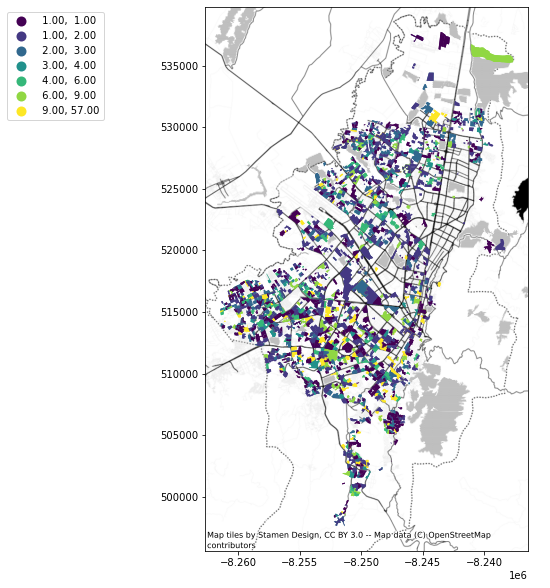

In [543]:
ax=res_nodo_geo[res_nodo_geo['dpto_cnmbr']=='BOGOTÁ, D.C.'].plot(column="#casos", scheme="quantiles", k=10, legend=True, figsize=(20,10),legend_kwds={'bbox_to_anchor': (-0.3,1)})
contextily.add_basemap(ax, crs=res_nodo_geo.crs.to_string(), source=contextily.providers.Stamen.TonerBackground)

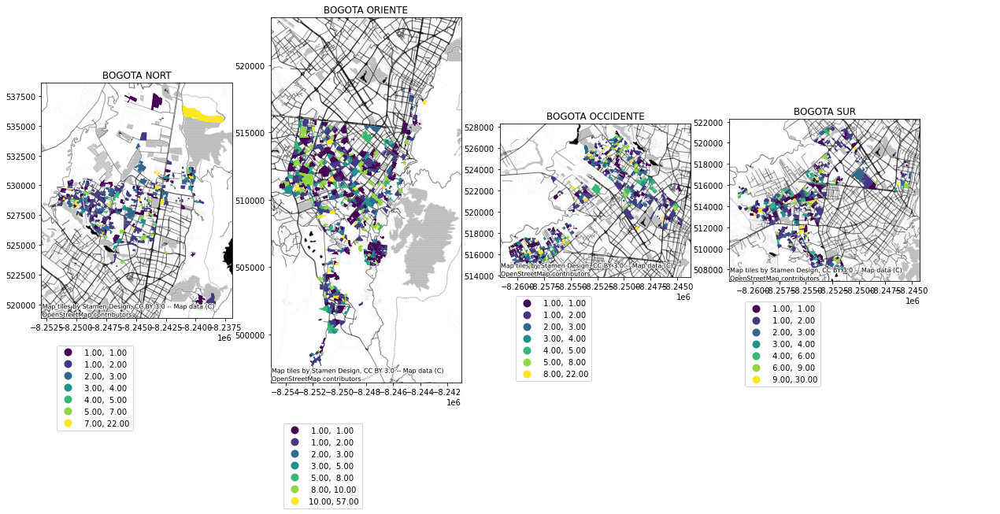

In [539]:
#, ,figsize=(20,20
f,ax = plt.subplots(1,4, figsize=(20,20))
#res_nodo_geo[res_nodo_geo['dpto_cnmbr']=='BOGOTÁ, D.C.'].plot(column="#casos", scheme="quantiles", k=10, legend=True, figsize=(20,10),legend_kwds={'bbox_to_anchor': (-0.5,1)}, ax=ax[0])
res_nodo_geo[(res_nodo_geo['dpto_cnmbr']=='BOGOTÁ, D.C.')&(res_nodo_geo['AREA']=='BOGOTA NORTE')].plot(column="#casos", scheme="quantiles", k=10, legend=True, figsize=(20,10),legend_kwds={'bbox_to_anchor': (0.5,-0.1,0,0)}, ax=ax[0])
ax[0].set_title("BOGOTA NORT")
res_nodo_geo[(res_nodo_geo['dpto_cnmbr']=='BOGOTÁ, D.C.')&(res_nodo_geo['AREA']=='BOGOTA ORIENTE')].plot(column="#casos", scheme="quantiles", k=10, legend=True, figsize=(20,10),legend_kwds={'bbox_to_anchor': (0.5,-0.1,0,0)}, ax=ax[1])
ax[1].set_title("BOGOTA ORIENTE")
res_nodo_geo[(res_nodo_geo['dpto_cnmbr']=='BOGOTÁ, D.C.')&(res_nodo_geo['AREA']=='BOGOTA OCCIDENTE')].plot(column="#casos", scheme="quantiles", k=10, legend=True, figsize=(20,10),legend_kwds={'bbox_to_anchor': (0.5,-0.1,0,0)}, ax=ax[2])
ax[2].set_title("BOGOTA OCCIDENTE")
res_nodo_geo[(res_nodo_geo['dpto_cnmbr']=='BOGOTÁ, D.C.')&(res_nodo_geo['AREA']=='BOGOTA SUR')].plot(column="#casos", scheme="quantiles", k=10, legend=True, figsize=(20,10),legend_kwds={'bbox_to_anchor': (0.5,-0.1,0,0)}, ax=ax[3])
ax[3].set_title("BOGOTA SUR")
contextily.add_basemap(ax[0], crs=res_nodo_geo.crs.to_string(), source=contextily.providers.Stamen.TonerBackground)
contextily.add_basemap(ax[1], crs=res_nodo_geo.crs.to_string(), source=contextily.providers.Stamen.TonerBackground)
contextily.add_basemap(ax[2], crs=res_nodo_geo.crs.to_string(), source=contextily.providers.Stamen.TonerBackground)
contextily.add_basemap(ax[3], crs=res_nodo_geo.crs.to_string(), source=contextily.providers.Stamen.TonerBackground)
#f.tight_layout()

## Medellín

In [546]:
res_nodo_geo['AREA'].unique()

array(['CUNMENAL', None, 'BOGOTA ORIENTE', 'BOGOTA NORTE', 'SANBOY',
       'EJE CAFETERO', 'COSTA SUR', 'CALI', 'COSTA NORTE', 'BOGOTA SUR',
       'BOGOTA OCCIDENTE', 'ANTCHO', 'MEDELLIN', 'TOLHUCA', 'VACANA'],
      dtype=object)

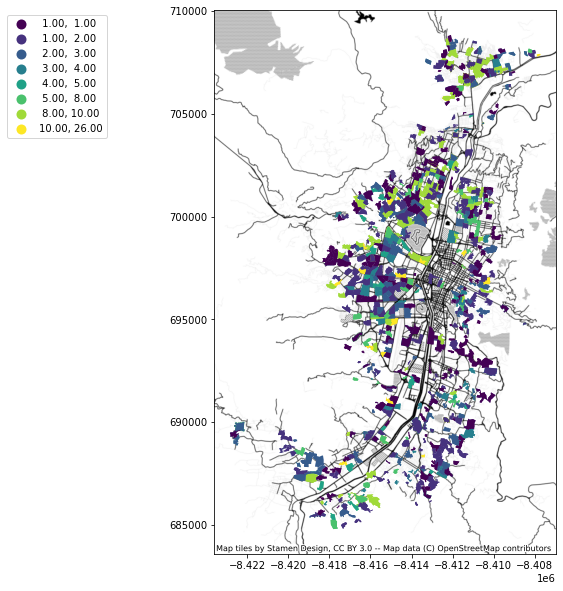

In [547]:
ax=res_nodo_geo[res_nodo_geo['AREA']=='MEDELLIN'].plot(column="#casos", scheme="quantiles", k=10, legend=True, figsize=(20,10),legend_kwds={'bbox_to_anchor': (-0.3,1)})
contextily.add_basemap(ax, crs=res_nodo_geo.crs.to_string(), source=contextily.providers.Stamen.TonerBackground)

In [548]:
## Se puede hacer suavisado

## Intervalos

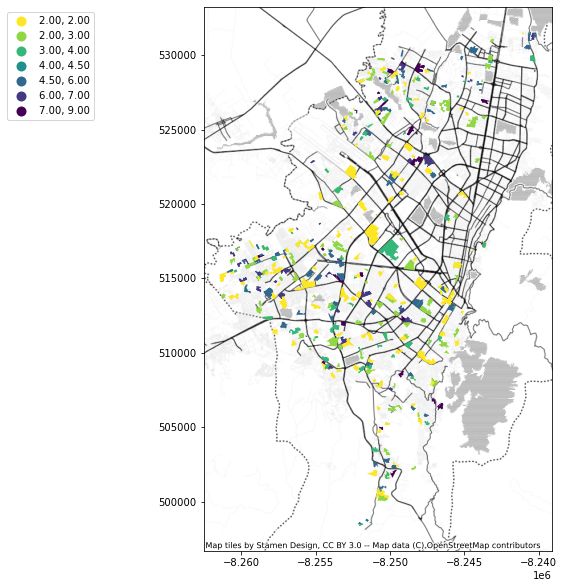

In [556]:
ax=res_nodo_geo[res_nodo_geo['dpto_cnmbr']=='BOGOTÁ, D.C.'].plot(column="dias_inter_event", scheme="quantiles", k=10, legend=True, figsize=(20,10),legend_kwds={'bbox_to_anchor': (-0.3,1)}, cmap='viridis_r')
contextily.add_basemap(ax, crs=res_nodo_geo.crs.to_string(), source=contextily.providers.Stamen.TonerBackground)

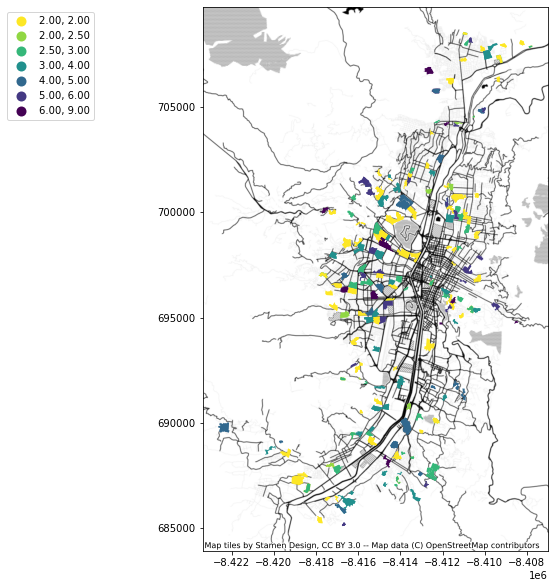

In [554]:
ax=res_nodo_geo[res_nodo_geo['AREA']=='MEDELLIN'].plot(column="dias_inter_event", scheme="quantiles", k=10, legend=True, figsize=(20,10),legend_kwds={'bbox_to_anchor': (-0.3,1)}, cmap='viridis_r')
contextily.add_basemap(ax, crs=res_nodo_geo.crs.to_string(), source=contextily.providers.Stamen.TonerBackground)

In [ ]:
# se puede realizar por timpo de alarma

# point patterns

In [569]:
nodos_transf_geo_dis

,geometry,NODO_trans,NODO_trans_2,NODO,TIPO,mpio_cnmbr,dpto_cnmbr,DIVISION,AREA,ZONA,DISTRITO
NODEALIAS,,,,,,,,,,,
- CAMPO AZUL,None,- CAMPO AZUL,- CAMPO AZUL,None,None,None,None,None,None,None,None
001AC3FF5272,None,001AC3FF5272,001AC3FF5272,None,None,None,None,None,None,None,None
012,None,012,012,None,None,None,None,None,None,None,None
015,None,015,015,None,None,None,None,None,None,None,None
01S,"POLYGON ((-8249799.186 527436.073, -8249838.148 527378.324, -8249883.678 527400.999, -8249883.901 527424.903, -8249931.879 527460.423, -8249946.462 527469.471, -8249934.773 527491.700, -8249928.651 527501.864, -8249922.417 527513.816, -8249913.511 527529.678, -8249909.504 527536.045, -8249900.710 527551.906, -8249894.031 527563.300, -8249888.242 527573.911, -8249882.342 527584.411, -8249878.668 527591.560, -8249882.342 527593.682, -8249878.668 527601.054, -8249874.216 527598.709, -8249857.852 527628.421, -8249840.152 527660.144, -8249853.288 527667.740, -8249844.048 527682.931, -8249834.586 527677.904, -8249833.695 527671.537, -8249839.707 527659.809, -8249829.688 527654.112, -8249823.454 527656.123, -8249798.073 527592.677, -8249789.279 527542.970, -8249773.917 527501.306, -8249763.119 527449.142, -8249773.917 527445.791, -8249784.270 527430.599, -8249799.186 527436.073))",01S,01S,01S,HFC,"BOGOTÁ, D.C.","BOGOTÁ, D.C.",REGION CENTRO,BOGOTA NORTE,SUBA,GAITANA
...,...,...,...,...,...,...,...,...,...,...,...
ZUL,"POLYGON ((-8409971.013 567507.595, -8409995.726 567510.165, -8410042.146 567410.922, -8410073.093 567403.434, -8410111.610 567394.158, -8410109.494 567474.290, -8410107.713 567541.682, -8410106.711 567550.175, -8410158.252 567535.088, -8410156.360 567556.322, -8410154.245 567568.951, -8410142.334 567567.833, -8410138.549 567592.197, -8410100.589 567591.191, -8410100.812 567572.192, -8410054.057 567574.986, -8410017.211 567568.392, -8409981.811 567567.051, -8409979.362 567575.657, -8410018.324 567589.850, -8410022.999 567576.104, -8410039.029 567583.145, -8410034.131 567597.338, -8410046.042 567601.920, -8410075.542 567605.497, -8410138.104 567633.549, -8410143.336 567640.478, -8410143.892 567647.184, -8410139.105 567653.330, -8410111.944 567713.011, -8410132.983 567729.663, -8410131.313 567739.274, -8410125.413 567748.215, -8410078.436 567825.777, -8410053.946 567799.402, -8410041.367 567775.932, -8410031.571 567758.385, -8409889.193 567686.188, -8409878.506 567712.787, -8409905.335 567773.920, -8409930.827 567788.002, -8409907.116 567814.936, -8409899.657 567792.696, -8409848.784 567812.366, -8409848.673 567811.807, -8409846.224 567805.325, -8409844.443 567796.496, -8409840.213 567784.426, -8409839.322 567779.732, -8409836.873 567775.485, -8409833.533 567771.685, -8409829.971 567767.885, -8409829.081 567766.879, -8409823.181 567761.068, -8409817.170 567754.921, -8409811.492 567750.562, -8409809.711 567748.998, -8409778.542 567747.992, -8409754.163 567718.375, -8409752.493 567701.276, -8409752.381 567700.046, -8409747.372 567689.541, -8409745.480 567685.406, -8409742.474 567678.812, -8409741.027 567675.459, -8409736.352 567666.295, -8409734.793 567663.277, -8409729.895 567640.478, -8409705.516 567601.809, -8409691.267 567582.027, -8409704.959 567545.258, -8409645.960 567541.458, -8409503.805 567566.157, -8409459.389 567587.503, -8409448.591 567559.899, -8409467.404 567557.104, -8409463.062 567539.558, -8409568.370 567515.753, -8409554.678 567454.285, -8409663.215 567435.956, -8409715.423 567441.991, -8409714.756 567447.579, -8409769.636 567452.720, -8409770.638 567407.904, -8409787.447 567420.757, -8409816.056 567432.045, -8409817.615 567428.692, -8409836.205 567395.387, -8409841.215 567380.858, -8409893.757 567389.464, -8409884.406 567423.774, -8409883.961 567430.815, -8409902.106 567484.684, -8409971.013 567507.595))",ZUL,ZUL,ZUL,HFC,MANIZALES,CALDAS,REGION NOROCCIDENTE,EJE CAFETERO,CALDAS,MANIZALES CALDAS6
ZUP,"POLYGON ((-8325343.264 478257.628, -8325305.750 478366.358, -8325395.139 478393.485, -8325414.509 478400.183, -832

In [571]:
res_nodo_geo_point=geopandas.GeoDataFrame(resumenSeries_un_nonZero.merge(nodos_transf_geo_dis, left_on='NODO',right_index=True, how='left'), crs=nodos_transf_geo_dis.crs)

In [572]:
res_nodo_geo_point['centroid']=res_nodo_geo_point['geometry'].centroid

In [573]:
res_nodo_geo_point=res_nodo_geo_point.set_geometry('centroid')

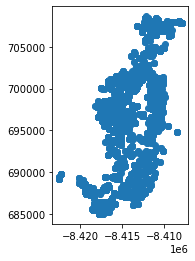

In [575]:
ax=res_nodo_geo_point[res_nodo_geo_point['AREA']=='MEDELLIN'].plot()

In [576]:
res_nodo_geo_point['longitude']=res_nodo_geo_point['centroid'].x
res_nodo_geo_point['latitude']=res_nodo_geo_point['centroid'].y

In [578]:
res_nodo_geo_point

,index,fecha,key,SEVERITY,sig_event,dias_inter_event,NODO_x,code,geometry,NODO_trans,NODO_trans_2,NODO_y,TIPO,mpio_cnmbr,dpto_cnmbr,DIVISION,AREA,ZONA,DISTRITO,centroid,longitude,latitude
0,4,2022-02-12,- CAMPO AZUL---3229,1.0,9.0,5.0,- CAMPO AZUL,3229,None,- CAMPO AZUL,- CAMPO AZUL,None,None,None,None,None,None,None,None,None,NaN,NaN
1,9,2022-02-17,- CAMPO AZUL---3229,1.0,NaN,NaN,- CAMPO AZUL,3229,None,- CAMPO AZUL,- CAMPO AZUL,None,None,None,None,None,None,None,None,None,NaN,NaN
2,18,2022-02-16,001AC3FF5272---2934,6.0,19.0,1.0,001AC3FF5272,2934,None,001AC3FF5272,001AC3FF5272,None,None,None,None,None,None,None,None,None,NaN,NaN
3,19,2022-02-17,001AC3FF5272---2934,6.0,NaN,NaN,001AC3FF5272,2934,None,001AC3FF5272,001AC3FF5272,None,None,None,None,None,None,None,None,None,NaN,NaN
4,28,2022-02-16,012---1012,6.0,NaN,NaN,012,1012,None,012,012,None,None,None,None,None,None,None,None,None,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62789,331243,2022-02-11,ZVZ---904,5.0,NaN,NaN,ZVZ,904,"POLYGON ((-8237060.340 559139.681, -8236962.045 559244.836, -8236853.064 559140.687, -8236835.809 559123.813, -8236879.669 559081.461, -8236659.256 558869.029, -8236630.536 558841.540, -8236708.682 558762.199, -8236783.600 558690.011, -8236758.108 558664.197, -8236846.830 558569.995, -8236923.417 558607.207, -8237153.515 558836.958, -8236954.253 559035.309, -8237060.340 559139.681))",ZVZ,ZVZ,ZVZ,HFC,ZIPAQUIRÁ,CUNDINAMARCA,REGION CENTRO,BOGOTA NORTE,SABANA NORTE,ZIPAQUIRA,POINT (-8236898.725 558874.127),-8.236899e+06,558874.127182
62790,331253,2022-02-11,ZVZ---913,5.0,NaN,NaN,ZVZ,913,"POLYGON ((-8237060.340 559139.681, -8236962.045 559244.836, -8236853.064 559140.687, -8236835.809 559123.813, -8236879.669 559081.461, -8236659.256 558869.029, -8236630.536 558841.540, -8236708.682 558762.199, -8236783.600 558690.011, -8236758.108 558664.197, -8236846.830 558569.995, -8236923.417 558607.207, -8237153.515 558836.958, -8236954.253 559035.309, -8237060.340 559139.681))",ZVZ,ZVZ,ZVZ,HFC,ZIPAQUIRÁ,CUNDINAMARCA,REGION CENTRO,BOGOTA NORTE,SABANA NORTE,ZIPAQUIRA,POINT (-8236898.725 558874.127),-8.236899e+06,558874.127182
62791,331263,2022-02-11,ZVZ---9332,5.0,NaN,NaN,ZVZ,9332,"POLYGON ((-8237060.340 559139.681, -8236962.045 559244.836, -8236853.064 559140.687, -8236835.809 559123.813, -8236879.669 559081.461, -8236659.256 558869.029, -8236630.536 558841.540, -8236708.682 558762.199, -8236783.600 558690.011, -8236758.108 558664.197, -8236846.830 558569.995, -8236923.417 558607.207, -8237153.515 558836.958, -8236954.253 559035.309, -8237060.340 559139.681))",ZVZ,ZVZ,ZVZ,HFC,ZIPAQUIRÁ,CUNDINAMARCA,REGION CENTRO,BOGOTA NORTE,SABANA NORTE,ZIPAQUIRA,POINT (-8236898.725 558874.127),-8.236899e+06,558874.127182
62792,331273,2022-02-11,ZVZ---969,5.0,NaN,NaN,ZVZ,969,"POLYGON ((-8237060.340 559139.681, -8236962.045 559244.836, -8236853.064 559140.687, -8236835.809 559123.813, -8236879.669 559081.461, -8236659.256 558869.029, -8236630.536 558841.540, -8236708.682 558762.199, -8236783.600 558690.011, -8236758.108 558664.197, -8236846.830 558569.995, -8236923.417 558607.207, -8237153.515 558836.958, -8236954.253 559035.309, -8237060.340 559139.681))",ZVZ,ZVZ,ZVZ,HFC,ZIPAQUIRÁ,CUNDINAMARCA,REGION CENTRO,BOGOTA NORTE,SABANA NORTE,ZIPAQUIRA,POINT (-8236898.725 558874.127),-8.236899e+06,558874.127182


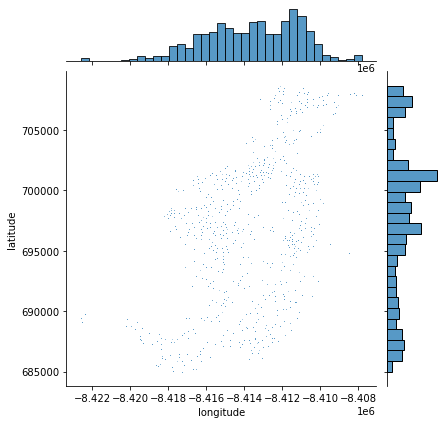

In [579]:
seaborn.jointplot(x='longitude', y='latitude', data=res_nodo_geo_point[res_nodo_geo_point['AREA']=='MEDELLIN'], s=0.5);

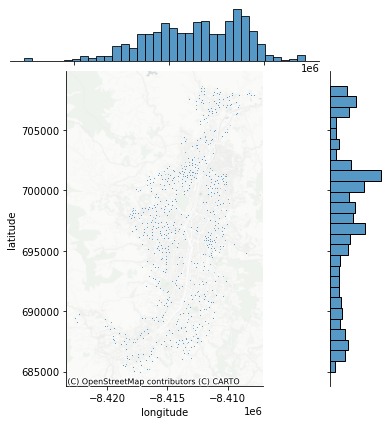

In [584]:
# Generate scatter plot
joint_axes = seaborn.jointplot(
    x='longitude', y='latitude', data=res_nodo_geo_point[res_nodo_geo_point['AREA']=='MEDELLIN'], s=0.5
)
contextily.add_basemap(
    joint_axes.ax_joint,
    crs=res_nodo_geo_point[res_nodo_geo_point['AREA']=='MEDELLIN'].crs.to_string(),
    source=contextily.providers.CartoDB.PositronNoLabels
);

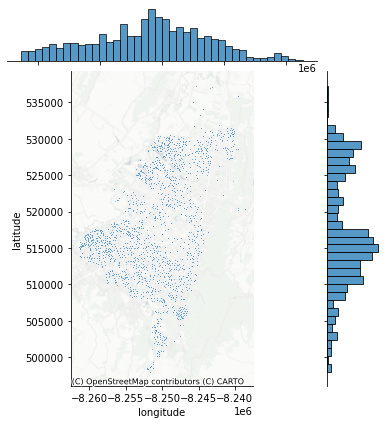

In [583]:
# Generate scatter plot
joint_axes = seaborn.jointplot(
    x='longitude', y='latitude', data=res_nodo_geo_point[res_nodo_geo_point['dpto_cnmbr']=='BOGOTÁ, D.C.'], s=0.5
)
contextily.add_basemap(
    joint_axes.ax_joint,
    crs=res_nodo_geo_point[res_nodo_geo_point['dpto_cnmbr']=='BOGOTÁ, D.C.'].crs.to_string(),
    source=contextily.providers.CartoDB.PositronNoLabels
);

In [594]:
mean_center = centrography.mean_center(res_nodo_geo_point[res_nodo_geo_point['dpto_cnmbr']=='BOGOTÁ, D.C.'][['longitude', 'latitude']])
med_center = centrography.euclidean_median(res_nodo_geo_point[res_nodo_geo_point['dpto_cnmbr']=='BOGOTÁ, D.C.'][['longitude', 'latitude']])

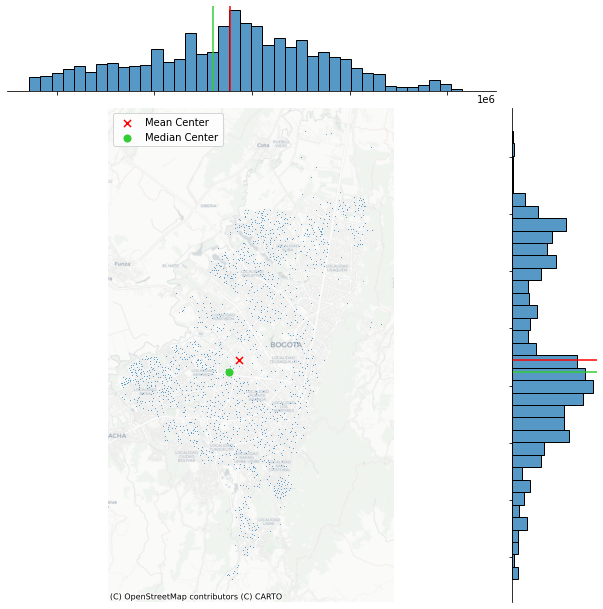

In [595]:
# Generate scatter plot
joint_axes = seaborn.jointplot(
    x='longitude', y='latitude', data=res_nodo_geo_point[res_nodo_geo_point['dpto_cnmbr']=='BOGOTÁ, D.C.'], s=0.75, height=9
)
# Add mean point and marginal lines
joint_axes.ax_joint.scatter(
    *mean_center, color='red', marker='x', s=50, label='Mean Center'
)
joint_axes.ax_marg_x.axvline(mean_center[0], color='red')
joint_axes.ax_marg_y.axhline(mean_center[1], color='red')
# Add median point and marginal lines
joint_axes.ax_joint.scatter(
    *med_center, color='limegreen', marker='o', s=50, label='Median Center'
)
joint_axes.ax_marg_x.axvline(med_center[0], color='limegreen')
joint_axes.ax_marg_y.axhline(med_center[1], color='limegreen')
# Legend
joint_axes.ax_joint.legend()
# Add basemap
contextily.add_basemap(
    joint_axes.ax_joint, 
    source=contextily.providers.CartoDB.Positron
)
# Clean axes
joint_axes.ax_joint.set_axis_off()
# Display
plt.show()

In [597]:
mean_center = centrography.mean_center(res_nodo_geo_point[res_nodo_geo_point['AREA']=='MEDELLIN'][['longitude', 'latitude']])
med_center = centrography.euclidean_median(res_nodo_geo_point[res_nodo_geo_point['AREA']=='MEDELLIN'][['longitude', 'latitude']])

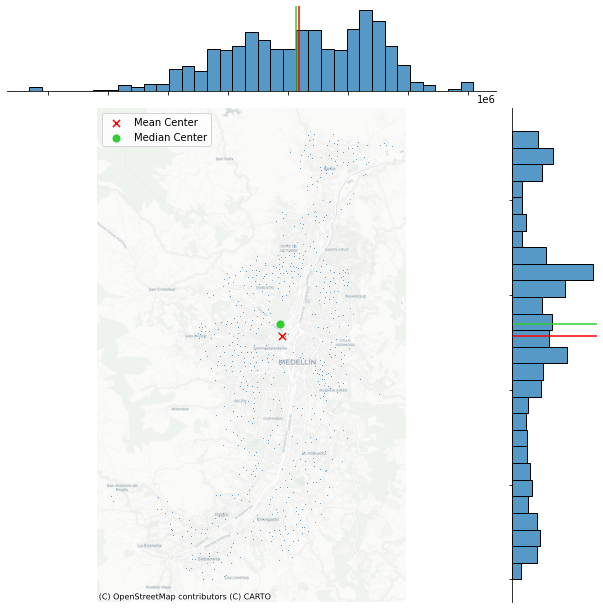

In [598]:
# Generate scatter plot
joint_axes = seaborn.jointplot(
    x='longitude', y='latitude', data=res_nodo_geo_point[res_nodo_geo_point['AREA']=='MEDELLIN'], s=0.75, height=9
)
# Add mean point and marginal lines
joint_axes.ax_joint.scatter(
    *mean_center, color='red', marker='x', s=50, label='Mean Center'
)
joint_axes.ax_marg_x.axvline(mean_center[0], color='red')
joint_axes.ax_marg_y.axhline(mean_center[1], color='red')
# Add median point and marginal lines
joint_axes.ax_joint.scatter(
    *med_center, color='limegreen', marker='o', s=50, label='Median Center'
)
joint_axes.ax_marg_x.axvline(med_center[0], color='limegreen')
joint_axes.ax_marg_y.axhline(med_center[1], color='limegreen')
# Legend
joint_axes.ax_joint.legend()
# Add basemap
contextily.add_basemap(
    joint_axes.ax_joint, 
    source=contextily.providers.CartoDB.Positron
)
# Clean axes
joint_axes.ax_joint.set_axis_off()
# Display
plt.show()

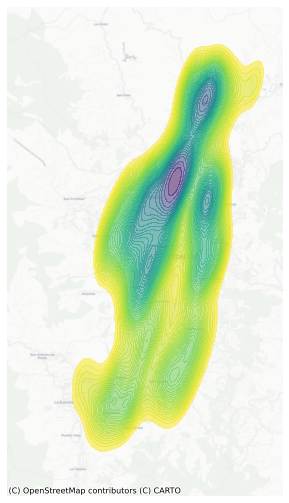

In [599]:
## Desviación
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Generate and add KDE with a shading of 50 gradients 
# coloured contours, 75% of transparency,
# and the reverse viridis colormap
seaborn.kdeplot(
    res_nodo_geo_point[res_nodo_geo_point['AREA']=='MEDELLIN']['longitude'], 
    res_nodo_geo_point[res_nodo_geo_point['AREA']=='MEDELLIN']['latitude'],
    n_levels=50, 
    shade=True,
    alpha=0.55, 
    cmap='viridis_r'
)
# Add basemap
contextily.add_basemap(
    ax, 
    source=contextily.providers.CartoDB.Positron
)
# Remove axes
ax.set_axis_off()

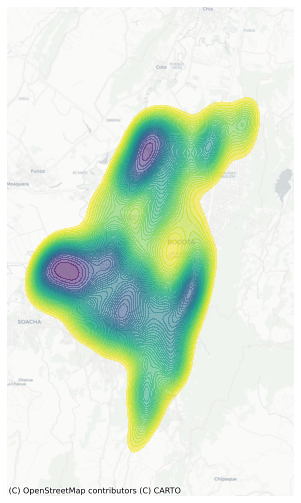

In [600]:
## Desviación
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Generate and add KDE with a shading of 50 gradients 
# coloured contours, 75% of transparency,
# and the reverse viridis colormap
seaborn.kdeplot(
    res_nodo_geo_point[res_nodo_geo_point['dpto_cnmbr']=='BOGOTÁ, D.C.']['longitude'], 
    res_nodo_geo_point[res_nodo_geo_point['dpto_cnmbr']=='BOGOTÁ, D.C.']['latitude'],
    n_levels=50, 
    shade=True,
    alpha=0.55, 
    cmap='viridis_r'
)
# Add basemap
contextily.add_basemap(
    ax, 
    source=contextily.providers.CartoDB.Positron
)
# Remove axes
ax.set_axis_off()

In [ ]:
### Regresión  (cambia algo)?

### Fin proceso

###  Cruzar con info Alarmas

In [247]:
resumen_dias_nodo.reset_index()

,NODEALIAS,0
0,GS7000 HMS:172.28.152.19:001E6B57B4A2,10
1,Nodo V2R - CANAVERALES 2,10
2,Nodo T4L - TRONCAL 4,10
3,BOGCCOPS01,10
4,Nodo T6T - TRANSITO 6,10
...,...,...
13150,MLA,1
13151,MKV,1
13152,MKR,1
13153,BOGZ4RPS01,1


In [248]:
resumen_dias_nodo=resumen_dias_nodo.reset_index()

In [249]:
resumen_dias_nodo.columns=['NODO','dias_A']

In [250]:
resumen_dias_nodo.set_index('NODO')

,dias_A
NODO,
GS7000 HMS:172.28.152.19:001E6B57B4A2,10
Nodo V2R - CANAVERALES 2,10
Nodo T4L - TRONCAL 4,10
BOGCCOPS01,10
Nodo T6T - TRANSITO 6,10
...,...
MLA,1
MKV,1
MKR,1


<AxesSubplot:>

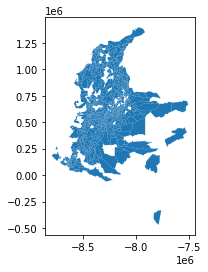

In [251]:
gdf1.plot()

<AxesSubplot:>

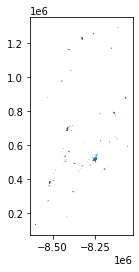

In [252]:
gdf12.plot()

In [253]:
#analisisNodos = geopandas.GeoDataFrame(gdf1.join(resumen_dias_nodo[[0]]), crs=lads.crs)\
#              .to_crs(epsg=3857)\
#              [['objectid', 'lad16nm', 'Pct_Leave', 'geometry']]\
#              .dropna()

In [254]:
gdf1.set_index('NODO',inplace=True)

<AxesSubplot:>

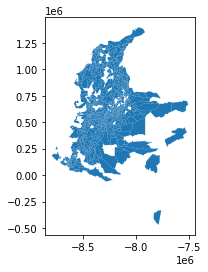

In [255]:
gdf1.plot()

In [256]:
analisisNodos = geopandas.GeoDataFrame(gdf1.join(resumen_dias_nodo.set_index('NODO')[['dias_A']]), crs=gdf1.crs)

<AxesSubplot:>

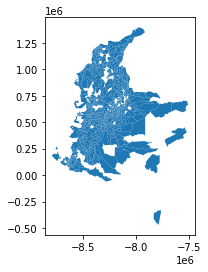

In [257]:
analisisNodos.plot()

In [258]:
analisisNodos.notnull().sum()

TIPO          18274
mpio_cnmbr    18274
dpto_cnmbr    18274
DIVISION      12777
AREA          12777
ZONA          12777
DISTRITO      12777
geometry      18271
dias_A        5874 
dtype: int64

In [259]:
analisisNodos['dias_A']=np.where(analisisNodos['dias_A'].isnull(),0,analisisNodos['dias_A'])

In [260]:
analisisNodos.describe()

,dias_A
count,18274.000000
mean,0.959286
std,2.166694
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,10.000000


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\mapclassify\classifiers.py:238: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\mapclassify\classifiers.py:241: UserWarning: Warning: setting k to 3
  Warn("Warning: setting k to %d" % k_q, UserWarning)


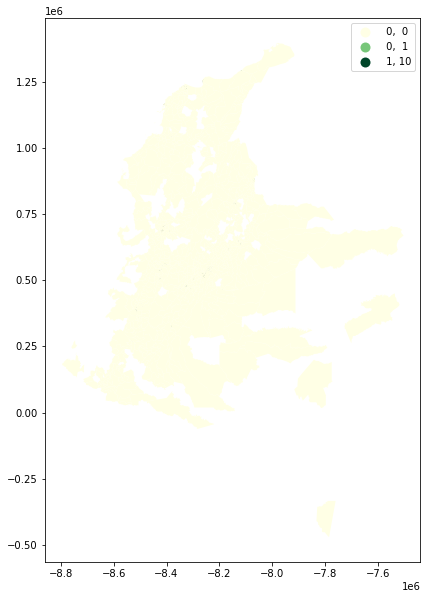

In [261]:
ax = analisisNodos.plot(
    column='dias_A',          # Data to plot
    scheme='Quantiles',          # Classification scheme
    cmap='YlGn',                 # Color palette
    legend=True,                 # Add legend
    legend_kwds={'fmt':'{:.0f}'}, # Remove decimals in legend
    figsize=(10, 10)
)
#ax.set_axis_off();

C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\mapclassify\classifiers.py:238: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\mapclassify\classifiers.py:241: UserWarning: Warning: setting k to 3
  Warn("Warning: setting k to %d" % k_q, UserWarning)


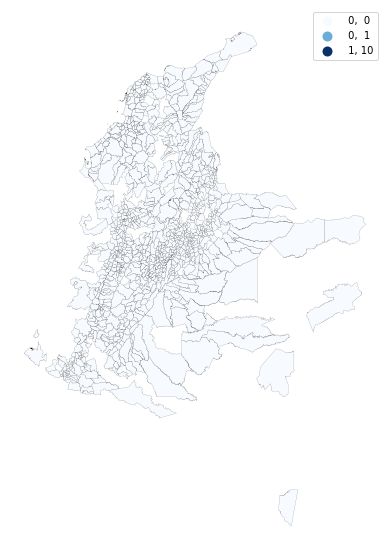

In [262]:
ax = analisisNodos.plot(
    column='dias_A',          # Data to plot
    scheme='Quantiles',          # Classification scheme
    cmap='Blues',                # Color palette
    edgecolor='k',               # Borderline color
    linewidth=0.1,               # Borderline width
    legend=True,                 # Add legend
    legend_kwds={'fmt':'{:.0f}'} # Remove decimals in legend (for legibility)
    ,figsize=(10, 10)
)
ax.set_axis_off();

<AxesSubplot:>

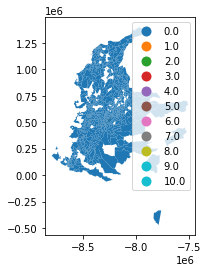

In [263]:
analisisNodos.plot('dias_A',categorical=True, legend=True)

<AxesSubplot:>

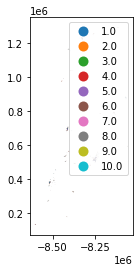

In [264]:
analisisNodos[analisisNodos['dias_A']>=1].plot('dias_A',categorical=True, legend=True)

In [265]:
# copy GeoDataFrame
points = analisisNodos.copy()
# change geometry 
points['geometry'] = points['geometry'].centroid

In [266]:
points.head()

,TIPO,mpio_cnmbr,dpto_cnmbr,DIVISION,AREA,ZONA,DISTRITO,geometry,dias_A
NODO,,,,,,,,,
01J,HFC,MONTERÍA,CÓRDOBA,REGION COSTA,COSTA SUR,CORDOBA SUCRE,CORDOBA SUCRE DISTRITO 3,POINT (-8447598.402 977950.182),0.0
01S,HFC,"BOGOTÁ, D.C.","BOGOTÁ, D.C.",REGION CENTRO,BOGOTA NORTE,SUBA,GAITANA,POINT (-8249846.872 527509.284),5.0
02J,HFC,MONTERÍA,CÓRDOBA,REGION COSTA,COSTA SUR,CORDOBA SUCRE,CORDOBA SUCRE DISTRITO 4,POINT (-8447432.338 977950.808),2.0
02S,HFC,"BOGOTÁ, D.C.","BOGOTÁ, D.C.",REGION CENTRO,BOGOTA NORTE,SUBA,GAITANA,POINT (-8249693.336 527364.140),0.0
03J,HFC,MONTERÍA,CÓRDOBA,REGION COSTA,COSTA SUR,CORDOBA SUCRE,CORDOBA SUCRE DISTRITO 4,POINT (-8447348.268 977772.527),0.0


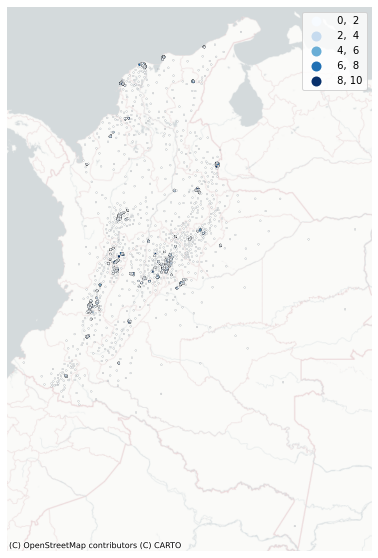

In [267]:
ax = points.plot(
    column='dias_A',          # Data to plot
    scheme='equal_interval',          # Classification scheme
    cmap='Blues',                # Color palette
    edgecolor='k',               # Borderline color
    linewidth=0.1,               # Borderline width
    markersize=3,
    legend=True,                 # Add legend
    legend_kwds={'fmt':'{:.0f}'} # Remove decimals in legend (for legibility)
    ,figsize=(10, 10)
)
ax.set_axis_off();

contextily.add_basemap(ax, 
                       crs=points.crs, 
                       #source=contextily.providers.Stamen.TerrainBackground
                       source=contextily.providers.CartoDB.PositronNoLabels
                      )

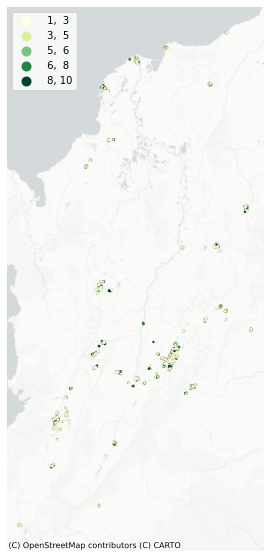

In [268]:
ax = points[points['dias_A']>0].plot(
    column='dias_A',          # Data to plot
    scheme='equal_interval',          # Classification scheme
    cmap='YlGn',                # Color palette
    edgecolor='k',
    markersize=5, # Borderline color
    linewidth=0.03,               # Borderline width
    legend=True,                 # Add legend
    legend_kwds={'fmt':'{:.0f}'} # Remove decimals in legend (for legibility)
    ,figsize=(10, 10)
)
ax.set_axis_off();

contextily.add_basemap(ax, 
                       crs=points.crs, 
                       #source=contextily.providers.Stamen.TerrainBackground
                       source=contextily.providers.CartoDB.PositronNoLabels
                      )

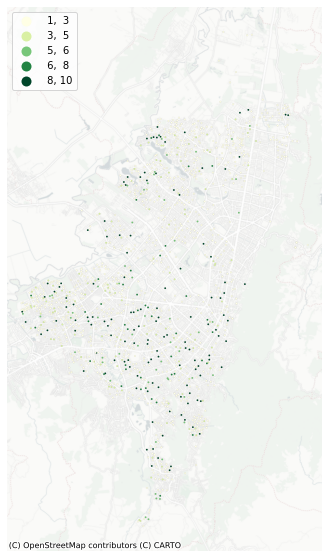

In [269]:
#DIVISION
ax = points[(points['dias_A']>0)&(points['dpto_cnmbr']=='BOGOTÁ, D.C.')].plot(
    column='dias_A',          # Data to plot
    scheme='equal_interval',          # Classification scheme
    cmap='YlGn',                # Color palette
    edgecolor='k',               # Borderline color
    linewidth=0.03,               # Borderline width
    markersize=3,
    legend=True,                 # Add legend
    legend_kwds={'fmt':'{:.0f}'} # Remove decimals in legend (for legibility)
    ,figsize=(10, 10)
)
ax.set_axis_off();

contextily.add_basemap(ax, 
                       crs=points.crs, 
                       #source=contextily.providers.Stamen.TerrainBackground
                       source=contextily.providers.CartoDB.PositronNoLabels
                      )

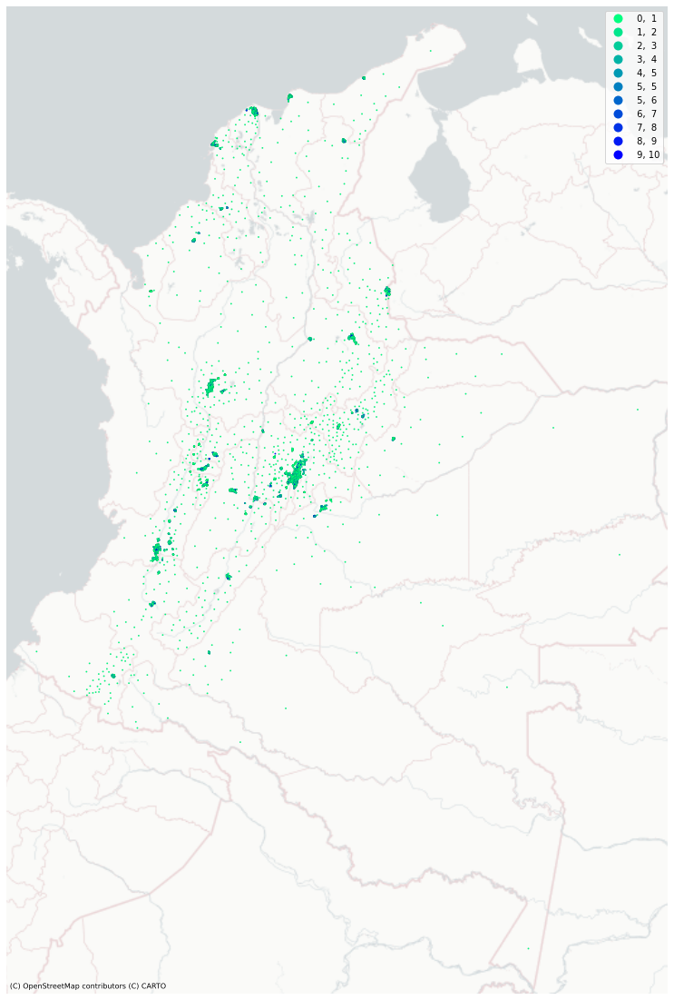

In [270]:
#DIVISION
ax = points.plot(
    column='dias_A',          # Data to plot
    scheme='equal_interval',          # Classification scheme
    k=11,
    cmap='winter_r',                # Color palette
    edgecolor='k',               # Borderline color
    linewidth=0.03,
    markersize=3,# Borderline width
    legend=True,                 # Add legend
    legend_kwds={'fmt':'{:.0f}'} # Remove decimals in legend (for legibility)
    ,figsize=(20, 20)
)
ax.set_axis_off();

contextily.add_basemap(ax, 
                       crs=points.crs, 
                       #source=contextily.providers.Stamen.TerrainBackground
                       source=contextily.providers.CartoDB.PositronNoLabels
                       #source=contextily.providers.Stamen.TonerLabels
                      )

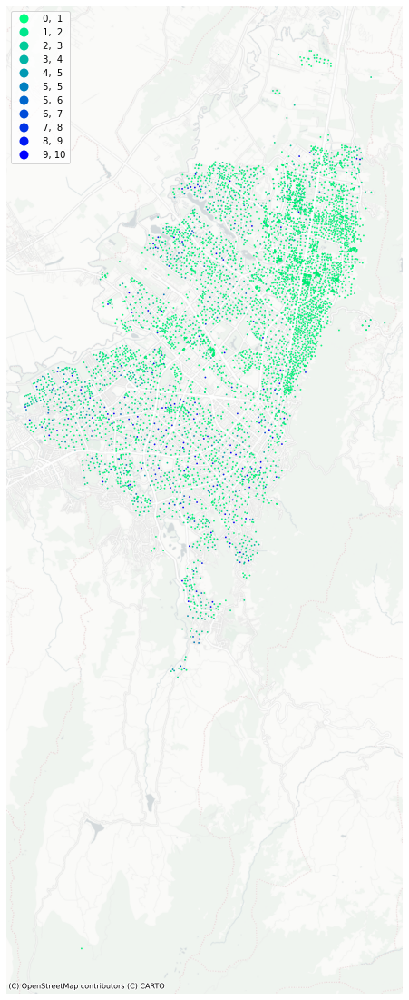

In [271]:
#DIVISION
ax = points[points['dpto_cnmbr']=='BOGOTÁ, D.C.'].plot(
    column='dias_A',          # Data to plot
    scheme='equal_interval',          # Classification scheme
    k=11,
    cmap='winter_r',                # Color palette
    edgecolor='k',               # Borderline color
    linewidth=0.03,
    markersize=3,# Borderline width
    legend=True,                 # Add legend
    legend_kwds={'fmt':'{:.0f}'} # Remove decimals in legend (for legibility)
    ,figsize=(20, 20)
)
ax.set_axis_off();

contextily.add_basemap(ax, 
                       crs=points.crs, 
                       #source=contextily.providers.Stamen.TerrainBackground
                       source=contextily.providers.CartoDB.PositronNoLabels
                       #source=contextily.providers.Stamen.TonerLabels
                      )

### Distribución de tiempo de ocurrencia

In [272]:
analisisNodos_ocurrencia = geopandas.GeoDataFrame(gdf1.join(resumenSeries_un_nonZero.set_index('NODO')[['dias_inter_event']]), crs=gdf1.crs)

In [273]:
analisisNodos_ocurrencia['dias_inter_event']=np.where(analisisNodos_ocurrencia['dias_inter_event'].isnull(),0,analisisNodos_ocurrencia['dias_inter_event'])

In [274]:
# copy GeoDataFrame
points_ocurrencia = analisisNodos_ocurrencia.copy()
# change geometry 
points_ocurrencia['geometry'] = points_ocurrencia['geometry'].centroid

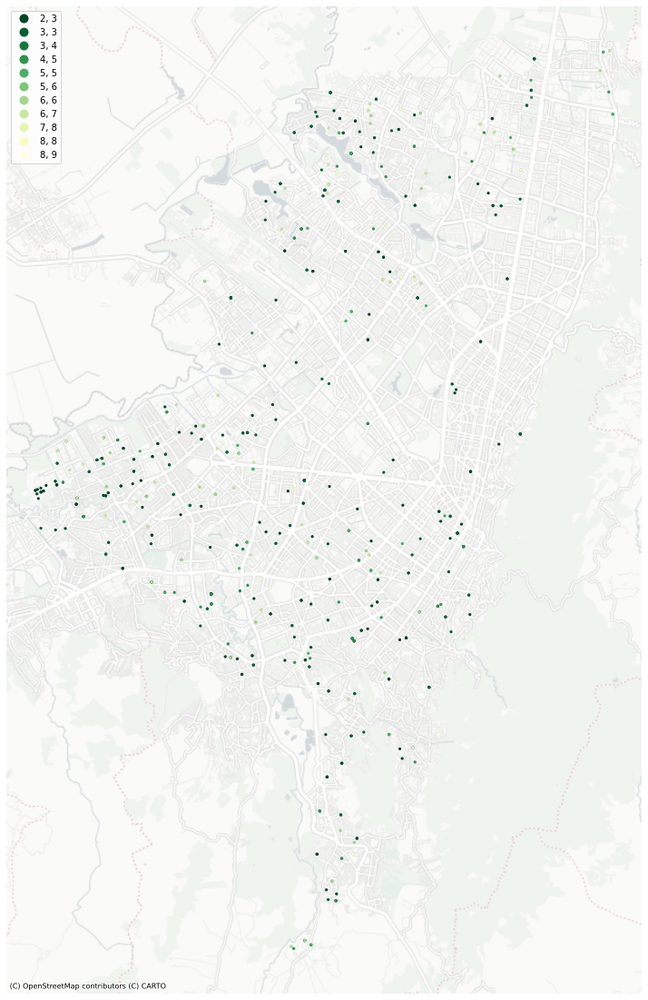

In [275]:
#DIVISION
ax = points_ocurrencia[(points_ocurrencia['dpto_cnmbr']=='BOGOTÁ, D.C.')&(points_ocurrencia['dias_inter_event']>=2)].plot(
    column='dias_inter_event',          # Data to plot
    scheme='equal_interval',          # Classification scheme
    k=11,
    cmap='YlGn_r',                # Color palette
    edgecolor='k',               # Borderline color
    linewidth=0.03,
    markersize=10,# Borderline width
    legend=True,                 # Add legend
    legend_kwds={'fmt':'{:.0f}'} # Remove decimals in legend (for legibility)
    ,figsize=(20, 20)
)
ax.set_axis_off();

contextily.add_basemap(ax, 
                       crs=points.crs, 
                       #source=contextily.providers.Stamen.TerrainBackground
                       source=contextily.providers.CartoDB.PositronNoLabels
                       #source=contextily.providers.Stamen.TonerLabels
                      )

## Fin Distribución ocurrencia

In [276]:
points['lon'] = points['geometry'].x
points['lat'] = points['geometry'].y

In [278]:
"""
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Generate and add KDE with a shading of 50 gradients 
# coloured contours, 75% of transparency,
# and the reverse viridis colormap
seaborn.kdeplot(
    points['lon'], 
    points['lat'],
    n_levels=50, 
    shade=True,
    alpha=0.55, 
    cmap='viridis_r'
)
# Add basemap
contextily.add_basemap(
    ax, 
    source=contextily.providers.CartoDB.Positron
)
# Remove axes
ax.set_axis_off()"""

"\n# Set up figure and axis\nf, ax = plt.subplots(1, figsize=(9, 9))\n# Generate and add KDE with a shading of 50 gradients \n# coloured contours, 75% of transparency,\n# and the reverse viridis colormap\nseaborn.kdeplot(\n    points['lon'], \n    points['lat'],\n    n_levels=50, \n    shade=True,\n    alpha=0.55, \n    cmap='viridis_r'\n)\n# Add basemap\ncontextily.add_basemap(\n    ax, \n    source=contextily.providers.CartoDB.Positron\n)\n# Remove axes\nax.set_axis_off()"

### Lisa

In [ ]:
#Zoom Bogota

In [ ]:
## Validacion

In [ ]:
analisisNodosCentroides=analisisNodos.centroid
analisisNodosCentroides_df = pd.DataFrame({'X': analisisNodosCentroides.x, 'Y': analisisNodosCentroides.y})

In [ ]:
analisisNodosCentroides_df

In [ ]:
seaborn.jointplot(x='X', y='Y', data=analisisNodosCentroides_df, s=0.5);
contextily.add_basemap(
    joint_axes.ax_joint,
    crs="EPSG:4326",
    source=contextily.providers.CartoDB.PositronNoLabels
);

In [232]:
# Generate scatter plot
joint_axes = seaborn.jointplot(
    x='x', y='y', data=analisisNodosCentroides_df, s=0.75, height=9
)
# Add mean point and marginal lines
joint_axes.ax_joint.scatter(
    *mean_center, color='red', marker='x', s=50, label='Mean Center'
)
joint_axes.ax_marg_x.axvline(mean_center[0], color='red')
joint_axes.ax_marg_y.axhline(mean_center[1], color='red')
# Add median point and marginal lines
joint_axes.ax_joint.scatter(
    *med_center, color='limegreen', marker='o', s=50, label='Median Center'
)
joint_axes.ax_marg_x.axvline(med_center[0], color='limegreen')
joint_axes.ax_marg_y.axhline(med_center[1], color='limegreen')
# Legend
joint_axes.ax_joint.legend()
# Add basemap
contextily.add_basemap(
    joint_axes.ax_joint, 
    source=contextily.providers.CartoDB.Positron
)
# Clean axes
joint_axes.ax_joint.set_axis_off()
# Display
plt.show()

NameError: name 'analisisNodosCentroides_df' is not defined

# Clasificación Casos

## Predicciones
https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0259764
* Revisar articulo

### Plan
* Clasificar casos
* Exponential Smoothing
* Ets
* Putty

In [279]:
resumenSeries_un_nonZero

,index,fecha,key,SEVERITY,sig_event,dias_inter_event,NODO,code
0,4,2022-02-12,- CAMPO AZUL---3229,1.0,9.0,5.0,- CAMPO AZUL,3229
1,9,2022-02-17,- CAMPO AZUL---3229,1.0,NaN,NaN,- CAMPO AZUL,3229
2,18,2022-02-16,001AC3FF5272---2934,6.0,19.0,1.0,001AC3FF5272,2934
3,19,2022-02-17,001AC3FF5272---2934,6.0,NaN,NaN,001AC3FF5272,2934
4,28,2022-02-16,012---1012,6.0,NaN,NaN,012,1012
...,...,...,...,...,...,...,...,...
62789,331243,2022-02-11,ZVZ---904,5.0,NaN,NaN,ZVZ,904
62790,331253,2022-02-11,ZVZ---913,5.0,NaN,NaN,ZVZ,913
62791,331263,2022-02-11,ZVZ---9332,5.0,NaN,NaN,ZVZ,9332
62792,331273,2022-02-11,ZVZ---969,5.0,NaN,NaN,ZVZ,969


In [280]:
# Numero de Eventos por Nodo-Codigo
id_casos=resumenSeries_un_nonZero['key'].value_counts().to_frame().reset_index()
id_casos.columns=['key','num_casos']
id_casos

,key,num_casos
0,BRS---2934,10
1,B55---2934,10
2,NODO BEX - BELLO 49---2934,10
3,NODO B0E - BELLO 10---2934,10
4,NODO AUC - ARANJUEZ 12---2934,10
...,...,...
33124,CHIMORPS01---9334,1
33125,CHIMORPS01---893,1
33126,CHIMORPS01---833,1
33127,CHIMORPS01---827,1


In [281]:
id_casos[['NODO','code']] = id_casos['key'].str.split('---',expand=True)
id_casos

,key,num_casos,NODO,code
0,BRS---2934,10,BRS,2934
1,B55---2934,10,B55,2934
2,NODO BEX - BELLO 49---2934,10,NODO BEX - BELLO 49,2934
3,NODO B0E - BELLO 10---2934,10,NODO B0E - BELLO 10,2934
4,NODO AUC - ARANJUEZ 12---2934,10,NODO AUC - ARANJUEZ 12,2934
...,...,...,...,...
33124,CHIMORPS01---9334,1,CHIMORPS01,9334
33125,CHIMORPS01---893,1,CHIMORPS01,893
33126,CHIMORPS01---833,1,CHIMORPS01,833
33127,CHIMORPS01---827,1,CHIMORPS01,827


In [282]:
#Alarmas que se presentan permanentemente
id_casos['tipo'] = np.where(id_casos['num_casos']==dias_totales,'permanente',np.nan)

In [283]:
id_casos['tipo'].value_counts()

nan           31955
permanente    1174 
Name: tipo, dtype: int64

In [284]:
id_casos

,key,num_casos,NODO,code,tipo
0,BRS---2934,10,BRS,2934,permanente
1,B55---2934,10,B55,2934,permanente
2,NODO BEX - BELLO 49---2934,10,NODO BEX - BELLO 49,2934,permanente
3,NODO B0E - BELLO 10---2934,10,NODO B0E - BELLO 10,2934,permanente
4,NODO AUC - ARANJUEZ 12---2934,10,NODO AUC - ARANJUEZ 12,2934,permanente
...,...,...,...,...,...
33124,CHIMORPS01---9334,1,CHIMORPS01,9334,nan
33125,CHIMORPS01---893,1,CHIMORPS01,893,nan
33126,CHIMORPS01---833,1,CHIMORPS01,833,nan
33127,CHIMORPS01---827,1,CHIMORPS01,827,nan


In [285]:
id_casos.isnull().sum()

key          0
num_casos    0
NODO         0
code         0
tipo         0
dtype: int64

In [286]:
#Actualmente Alarma

In [287]:
alarma_actual=resumenSeries_un_nonZero[resumenSeries_un_nonZero['fecha']==max_fecha]
alarma_actual

,index,fecha,key,SEVERITY,sig_event,dias_inter_event,NODO,code
1,9,2022-02-17,- CAMPO AZUL---3229,1.0,NaN,NaN,- CAMPO AZUL,3229
3,19,2022-02-17,001AC3FF5272---2934,6.0,NaN,NaN,001AC3FF5272,2934
42,239,2022-02-17,044---9332,4.0,NaN,NaN,044,9332
43,249,2022-02-17,044---969,5.0,NaN,NaN,044,969
49,259,2022-02-17,048---891,6.0,NaN,NaN,048,891
...,...,...,...,...,...,...,...,...
62749,331089,2022-02-17,ZS3---975,1.0,NaN,NaN,ZS3,975
62759,331099,2022-02-17,ZSP---1012,6.0,NaN,NaN,ZSP,1012
62761,331119,2022-02-17,ZTF---891,6.0,NaN,NaN,ZTF,891
62770,331139,2022-02-17,ZUL---913,5.0,NaN,NaN,ZUL,913


In [288]:
id_casos['tipo'] = np.where(id_casos['tipo']!='nan',id_casos['tipo'],np.where(id_casos['key'].isin(alarma_actual['key'].unique()),'actual',np.NaN))

In [289]:
id_casos['tipo'].value_counts()

nan           27012
actual        4943 
permanente    1174 
Name: tipo, dtype: int64

In [290]:
#Un solo casos (sin repetir cada dia)

In [291]:
casos_mayor_1_df=resumenSeries_un_nonZero[resumenSeries_un_nonZero['dias_inter_event']>1]['key'].unique()
casos_mayor_1_df

array(['- CAMPO AZUL---3229', '01S---761', '01S---827', ..., 'ZTF---9334',
       'ZUP---827', 'ZUP---9334'], dtype=object)

In [292]:
len(set(list(resumenSeries_un_nonZero['key'].unique())))

33129

In [293]:
len(set(list(casos_mayor_1_df)))

7029

In [294]:
#resumenSeries_un
len(set(list(resumenSeries_un['key'].unique())))

33129

In [295]:
casos_solo_1=set(list(resumenSeries_un_nonZero['key'].unique()))-set(list(casos_mayor_1_df))
len(casos_solo_1)

26100

In [296]:
# solo un evento

In [297]:
id_casos['tipo'] = np.where(id_casos['tipo']!='nan',id_casos['tipo'],np.where(id_casos['key'].isin(casos_solo_1),'solo_1','>1_caso'))

In [298]:
id_casos['tipo'].value_counts()

solo_1        22330
actual        4943 
>1_caso       4682 
permanente    1174 
Name: tipo, dtype: int64

In [305]:
def pieChart(col):
    A = col.value_counts()
    indices = A.index
    plt.pie(A, labels=indices, autopct="%0.1f %%")
    plt.axis("equal")
    plt.show()    

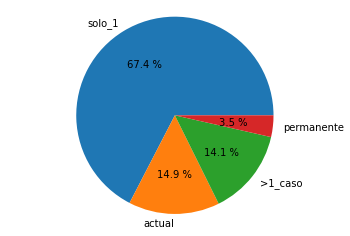

In [306]:
#id_casos['tipo'].value_counts().plot.pie()
pieChart(id_casos['tipo'])

In [299]:
#Validación

In [338]:
id_casos[(id_casos['tipo']=='>1_caso')&(id_casos['num_casos']>3)].sample(3)

,key,num_casos,NODO,code,tipo
3081,SOGGG1PS01---761,4,SOGGG1PS01,761,>1_caso
2226,COQ---891,6,COQ,891,>1_caso
2733,CHICH7PS01---894,4,CHICH7PS01,894,>1_caso


In [335]:
resumenSeries_un[resumenSeries_un['key']=='FUSTHEPS01---827']

,key,SEVERITY
fecha,,
2022-02-08,FUSTHEPS01---827,1.0
2022-02-09,FUSTHEPS01---827,0.0
2022-02-10,FUSTHEPS01---827,0.0
2022-02-11,FUSTHEPS01---827,0.0
2022-02-12,FUSTHEPS01---827,0.0
2022-02-13,FUSTHEPS01---827,0.0
2022-02-14,FUSTHEPS01---827,1.0
2022-02-15,FUSTHEPS01---827,0.0
2022-02-16,FUSTHEPS01---827,1.0


<AxesSubplot:title={'center':'CHICH7PS01---894'}, xlabel='fecha'>

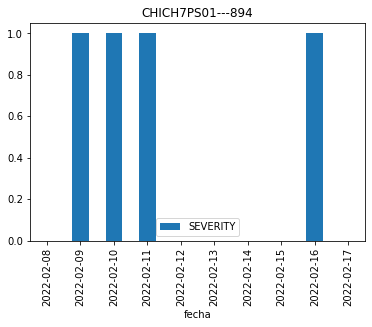

In [340]:
resumenSeries_un[resumenSeries_un['key']=='CHICH7PS01---894'][['SEVERITY']].plot.bar(title='CHICH7PS01---894')

## Caracterización de códigos de Alarma
* Mayor frecuencia
* Tiempo en que se demoran en solucionar mean y mediana, contar 1s
* Frecuencia de ocurrencia despúes de solucionar

In [345]:
resumen_dias_code=resumenSeries[['CODALARM_2']].value_counts().to_frame()
resumen_dias_code.columns=['num_casos']
resumen_dias_code

,num_casos
CODALARM_2,
1012,11126
9332,7943
969,6967
2934,5137
891,5089
904,3925
9334,3905
827,3401
913,3118


<AxesSubplot:xlabel='CODALARM_2'>

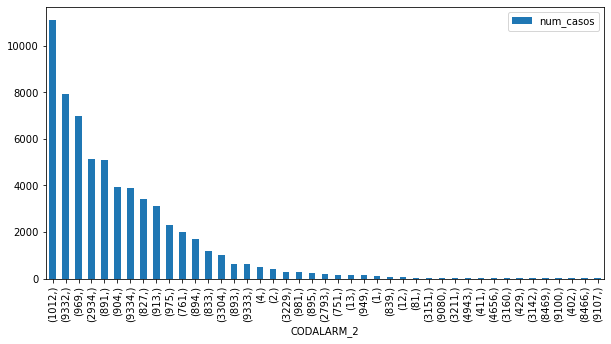

In [346]:
resumen_dias_code.plot.bar(figsize=(10,5))

In [353]:
### frecuencia Ocurrencia
frecuencia_median_code=resumenSeries_un_nonZero[resumenSeries_un_nonZero['dias_inter_event']>1].groupby('code')[['dias_inter_event']].median()
frecuencia_median_code=frecuencia_median_code.sort_values('dias_inter_event',ascending=False)
frecuencia_median_code

,dias_inter_event
code,
1,5.0
827,4.0
969,4.0
9334,4.0
9332,4.0
3211,3.5
9333,3.0
891,3.0
904,3.0


<AxesSubplot:xlabel='code'>

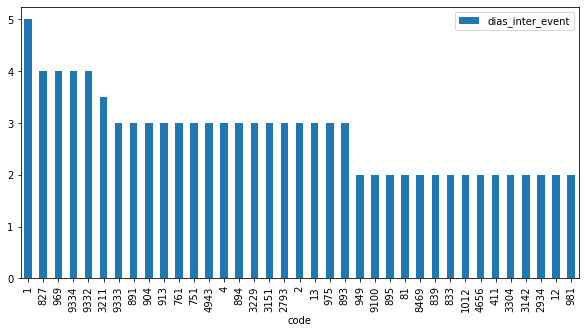

In [354]:
frecuencia_median_code.plot.bar(figsize=(10,5))

<AxesSubplot:title={'center':'dias_inter_event'}, xlabel='[code]'>

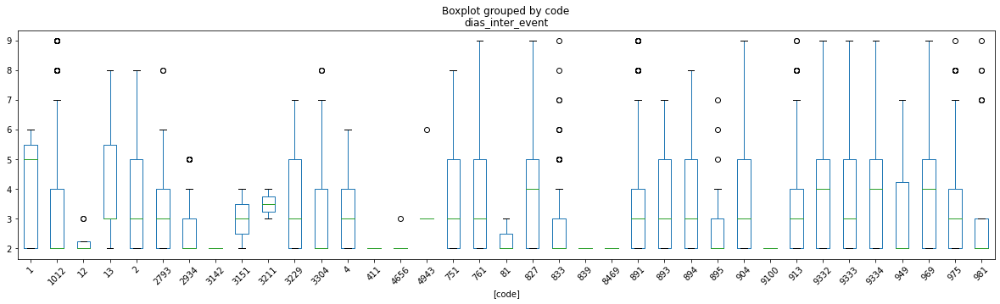

In [362]:
resumenSeries_un_nonZero[resumenSeries_un_nonZero['dias_inter_event']>1][['code','dias_inter_event']].boxplot(by=['code'],figsize=(20,5), grid=False, rot=45)

In [349]:
resumenSeries_un_nonZero[resumenSeries_un_nonZero['code']=='3160']

,index,fecha,key,SEVERITY,sig_event,dias_inter_event,NODO,code
41426,228508,2022-02-16,"NODO 055,552D,553D,554D.---3160",1.0,NaN,NaN,"NODO 055,552D,553D,554D.",3160
41475,228765,2022-02-13,"NODO 34A1,34A12D,34A13D,34A14D.---3160",5.0,NaN,NaN,"NODO 34A1,34A12D,34A13D,34A14D.",3160
41477,228783,2022-02-11,"NODO 3801,38012D,38013D,38014D.---3160",5.0,NaN,NaN,"NODO 3801,38012D,38013D,38014D.",3160
41519,228917,2022-02-15,"NODO 50B,50B2D,50B3D,50B4D.---3160",1.0,NaN,NaN,"NODO 50B,50B2D,50B3D,50B4D.",3160
41640,229272,2022-02-10,"NODO BJ1,BJ12D,BJ13D,BJ14D.---3160",5.0,NaN,NaN,"NODO BJ1,BJ12D,BJ13D,BJ14D.",3160
41792,229916,2022-02-14,"NODO FG2,FG22D,FG23D,FG24D.---3160",1.0,NaN,NaN,"NODO FG2,FG22D,FG23D,FG24D.",3160
41831,230067,2022-02-15,"NODO GH1,GH12D,GH13D,GH14D.---3160",1.0,NaN,NaN,"NODO GH1,GH12D,GH13D,GH14D.",3160
41895,230418,2022-02-16,"NODO LRO2,LRO22D,LRO23D,LRO24D.---3160",5.0,NaN,NaN,"NODO LRO2,LRO22D,LRO23D,LRO24D.",3160
41902,230485,2022-02-13,NODO MAA. - MIRADOR DE ALAMEDA---3160,1.0,NaN,NaN,NODO MAA. - MIRADOR DE ALAMEDA,3160
42093,231200,2022-02-08,"NODO SFT1,SFT12D,SFT13D,SFT14D.---3160",1.0,NaN,NaN,"NODO SFT1,SFT12D,SFT13D,SFT14D.",3160


In [ ]:
# tiempo en que se demoran es solucionar

In [365]:
df_seguimos=resumenSeries_un_nonZero[resumenSeries_un_nonZero['dias_inter_event']==1]
df_seguimos

,index,fecha,key,SEVERITY,sig_event,dias_inter_event,NODO,code
2,18,2022-02-16,001AC3FF5272---2934,6.0,19.0,1.0,001AC3FF5272,2934
5,34,2022-02-12,015---1012,1.0,35.0,1.0,015,1012
6,35,2022-02-13,015---1012,1.0,36.0,1.0,015,1012
9,42,2022-02-10,01S---761,5.0,43.0,1.0,01S,761
29,160,2022-02-08,037---913,5.0,161.0,1.0,037,913
...,...,...,...,...,...,...,...,...
62774,331164,2022-02-12,ZUL---975,5.0,331165.0,1.0,ZUL,975
62775,331165,2022-02-13,ZUL---975,5.0,331166.0,1.0,ZUL,975
62776,331166,2022-02-14,ZUL---975,5.0,331167.0,1.0,ZUL,975
62777,331167,2022-02-15,ZUL---975,5.0,331168.0,1.0,ZUL,975


# Fin predicion1

# Modelo LGBM

# Preparacion input
* Etiquetas
* Distancias
* Parametros

In [894]:
resumenSeries_un_nonZero

,index,fecha,key,SEVERITY,sig_event,dias_inter_event,NODO,code
0,4,2022-02-12,- CAMPO AZUL---3229,1.0,9.0,5.0,- CAMPO AZUL,3229
1,9,2022-02-17,- CAMPO AZUL---3229,1.0,NaN,NaN,- CAMPO AZUL,3229
2,18,2022-02-16,001AC3FF5272---2934,6.0,19.0,1.0,001AC3FF5272,2934
3,19,2022-02-17,001AC3FF5272---2934,6.0,NaN,NaN,001AC3FF5272,2934
4,28,2022-02-16,012---1012,6.0,NaN,NaN,012,1012
...,...,...,...,...,...,...,...,...
62789,331243,2022-02-11,ZVZ---904,5.0,NaN,NaN,ZVZ,904
62790,331253,2022-02-11,ZVZ---913,5.0,NaN,NaN,ZVZ,913
62791,331263,2022-02-11,ZVZ---9332,5.0,NaN,NaN,ZVZ,9332
62792,331273,2022-02-11,ZVZ---969,5.0,NaN,NaN,ZVZ,969


In [895]:
resumenSeries_un

,key,SEVERITY,NODO,code
fecha,,,,
2022-02-08,- CAMPO AZUL---3229,0.0,- CAMPO AZUL,3229
2022-02-09,- CAMPO AZUL---3229,0.0,- CAMPO AZUL,3229
2022-02-10,- CAMPO AZUL---3229,0.0,- CAMPO AZUL,3229
2022-02-11,- CAMPO AZUL---3229,0.0,- CAMPO AZUL,3229
2022-02-12,- CAMPO AZUL---3229,1.0,- CAMPO AZUL,3229
...,...,...,...,...
2022-02-13,ZVZ---975,0.0,ZVZ,975
2022-02-14,ZVZ---975,0.0,ZVZ,975
2022-02-15,ZVZ---975,0.0,ZVZ,975


In [896]:
resumenSeries_un[['NODO','code']] = resumenSeries_un['key'].str.split('---',expand=True)
resumenSeries_un

,key,SEVERITY,NODO,code
fecha,,,,
2022-02-08,- CAMPO AZUL---3229,0.0,- CAMPO AZUL,3229
2022-02-09,- CAMPO AZUL---3229,0.0,- CAMPO AZUL,3229
2022-02-10,- CAMPO AZUL---3229,0.0,- CAMPO AZUL,3229
2022-02-11,- CAMPO AZUL---3229,0.0,- CAMPO AZUL,3229
2022-02-12,- CAMPO AZUL---3229,1.0,- CAMPO AZUL,3229
...,...,...,...,...
2022-02-13,ZVZ---975,0.0,ZVZ,975
2022-02-14,ZVZ---975,0.0,ZVZ,975
2022-02-15,ZVZ---975,0.0,ZVZ,975


#### Etiquetas

In [897]:
max_fecha

datetime.date(2022, 2, 17)

In [898]:
p_diasEtiqueta=3
fecha_ini_etiqueta=max_fecha - timedelta(days=p_diasEtiqueta-1)
fecha_ini_etiqueta

datetime.date(2022, 2, 15)

In [899]:
df_etiquetas=resumenSeries_un[resumenSeries_un.index>=fecha_ini_etiqueta][['key','SEVERITY']].groupby('key').sum()
df_etiquetas['output']=np.where(df_etiquetas['SEVERITY']>0,1,0)
df_etiquetas

,SEVERITY,output
key,,
- CAMPO AZUL---3229,1.0,1
001AC3FF5272---2934,12.0,1
012---1012,6.0,1
015---1012,0.0,0
01S---761,5.0,1
...,...,...
ZVZ---904,0.0,0
ZVZ---913,0.0,0
ZVZ---9332,0.0,0


### Distancias

In [900]:
### Repetir proceso inicial con corte Fechas

In [901]:
df_base=resumenSeries_un[resumenSeries_un.index<fecha_ini_etiqueta]
df_base

,key,SEVERITY,NODO,code
fecha,,,,
2022-02-08,- CAMPO AZUL---3229,0.0,- CAMPO AZUL,3229
2022-02-09,- CAMPO AZUL---3229,0.0,- CAMPO AZUL,3229
2022-02-10,- CAMPO AZUL---3229,0.0,- CAMPO AZUL,3229
2022-02-11,- CAMPO AZUL---3229,0.0,- CAMPO AZUL,3229
2022-02-12,- CAMPO AZUL---3229,1.0,- CAMPO AZUL,3229
...,...,...,...,...
2022-02-10,ZVZ---975,0.0,ZVZ,975
2022-02-11,ZVZ---975,5.0,ZVZ,975
2022-02-12,ZVZ---975,0.0,ZVZ,975


In [902]:
#df_base=df_distancias.copy()

In [903]:
df_base=df_base.reset_index()
df_distancias_nz=df_base[df_base['SEVERITY']!=0].reset_index()
df_distancias_nz['sig_event']=df_distancias_nz.groupby('key')['index'].shift(periods=-1)
df_distancias_nz['dias_inter_event']=df_distancias_nz['sig_event']-df_distancias_nz['index']
df_distancias_nz

,index,fecha,key,SEVERITY,NODO,code,sig_event,dias_inter_event
0,4,2022-02-12,- CAMPO AZUL---3229,1.0,- CAMPO AZUL,3229,NaN,NaN
1,25,2022-02-12,015---1012,1.0,015,1012,26.0,1.0
2,26,2022-02-13,015---1012,1.0,015,1012,27.0,1.0
3,27,2022-02-14,015---1012,1.0,015,1012,NaN,NaN
4,28,2022-02-08,01S---761,1.0,01S,761,30.0,2.0
...,...,...,...,...,...,...,...,...
42412,231871,2022-02-11,ZVZ---904,5.0,ZVZ,904,NaN,NaN
42413,231878,2022-02-11,ZVZ---913,5.0,ZVZ,913,NaN,NaN
42414,231885,2022-02-11,ZVZ---9332,5.0,ZVZ,9332,NaN,NaN
42415,231892,2022-02-11,ZVZ---969,5.0,ZVZ,969,NaN,NaN


In [904]:
distancias_df=df_distancias_nz[df_distancias_nz['dias_inter_event']>1]
distancias_df

,index,fecha,key,SEVERITY,NODO,code,sig_event,dias_inter_event
4,28,2022-02-08,01S---761,1.0,01S,761,30.0,2.0
6,31,2022-02-11,01S---761,1.0,01S,761,33.0,2.0
8,35,2022-02-08,01S---827,1.0,01S,827,38.0,3.0
10,42,2022-02-08,01S---893,1.0,01S,893,45.0,3.0
15,72,2022-02-10,02J---9332,4.0,02J,9332,75.0,3.0
...,...,...,...,...,...,...,...,...
42346,231589,2022-02-09,ZOV---893,1.0,ZOV,893,231593.0,4.0
42348,231596,2022-02-09,ZOV---9334,4.0,ZOV,9334,231600.0,4.0
42394,231784,2022-02-08,ZTF---9334,4.0,ZTF,9334,231786.0,2.0
42406,231819,2022-02-08,ZUP---827,1.0,ZUP,827,231821.0,2.0


In [905]:
## contar
distancias_df=distancias_df.sort_values(['key','fecha'],ascending=False)
#distancias_df.reset_index()
distancias_df

,index,fecha,key,SEVERITY,NODO,code,sig_event,dias_inter_event
42408,231826,2022-02-08,ZUP---9334,1.0,ZUP,9334,231828.0,2.0
42406,231819,2022-02-08,ZUP---827,1.0,ZUP,827,231821.0,2.0
42394,231784,2022-02-08,ZTF---9334,4.0,ZTF,9334,231786.0,2.0
42348,231596,2022-02-09,ZOV---9334,4.0,ZOV,9334,231600.0,4.0
42346,231589,2022-02-09,ZOV---893,1.0,ZOV,893,231593.0,4.0
...,...,...,...,...,...,...,...,...
15,72,2022-02-10,02J---9332,4.0,02J,9332,75.0,3.0
10,42,2022-02-08,01S---893,1.0,01S,893,45.0,3.0
8,35,2022-02-08,01S---827,1.0,01S,827,38.0,3.0
6,31,2022-02-11,01S---761,1.0,01S,761,33.0,2.0


In [906]:
distancias_df.drop(columns=['index','sig_event'],inplace=True)

In [907]:
distancias_df.reset_index(drop=True).reset_index()

,index,fecha,key,SEVERITY,NODO,code,dias_inter_event
0,0,2022-02-08,ZUP---9334,1.0,ZUP,9334,2.0
1,1,2022-02-08,ZUP---827,1.0,ZUP,827,2.0
2,2,2022-02-08,ZTF---9334,4.0,ZTF,9334,2.0
3,3,2022-02-09,ZOV---9334,4.0,ZOV,9334,4.0
4,4,2022-02-09,ZOV---893,1.0,ZOV,893,4.0
...,...,...,...,...,...,...,...
3907,3907,2022-02-10,02J---9332,4.0,02J,9332,3.0
3908,3908,2022-02-08,01S---893,1.0,01S,893,3.0
3909,3909,2022-02-08,01S---827,1.0,01S,827,3.0
3910,3910,2022-02-11,01S---761,1.0,01S,761,2.0


In [908]:
#tabla_primera_opcion=tablaBase.groupby(['ID']).nth(0)

In [909]:
distancias_df.groupby(['key']).nth(0)[['dias_inter_event']]

,dias_inter_event
key,
01S---761,2.0
01S---827,3.0
01S---893,3.0
02J---9332,3.0
040---827,3.0
...,...
ZOV---893,4.0
ZOV---9334,4.0
ZTF---9334,2.0


In [910]:
p_numeroEventos_historia=5

In [911]:
X_df=resumenSeries_un[['key','NODO','code']].drop_duplicates()
#X_df.reset_index(inplace=True, drop=True)
X_df.set_index('key',inplace=True)
X_df

,NODO,code
key,,
- CAMPO AZUL---3229,- CAMPO AZUL,3229
001AC3FF5272---2934,001AC3FF5272,2934
012---1012,012,1012
015---1012,015,1012
01S---761,01S,761
...,...,...
ZVZ---904,ZVZ,904
ZVZ---913,ZVZ,913
ZVZ---9332,ZVZ,9332


In [912]:
X_df['code'].value_counts()

9332    5765
969     5283
1012    3696
9334    2750
827     2494
904     2382
891     1800
913     1467
894     1236
975     1209
761     1180
2934    579 
893     511 
833     489 
9333    384 
3304    333 
2       222 
4       210 
3229    198 
895     155 
981     140 
2793    123 
751     116 
949     87  
839     75  
12      47  
13      43  
1       42  
3151    20  
411     16  
3160    12  
429     11  
81      11  
4943    9   
3142    8   
3211    7   
402     6   
4656    4   
9080    3   
9100    2   
8469    2   
9107    1   
8466    1   
Name: code, dtype: int64

In [913]:
for i in range(0,p_numeroEventos_historia):
    print(i)
    aux_df=distancias_df.groupby(['key']).nth(i)[['dias_inter_event']]
    aux_df.columns=[i]
    X_df=X_df.merge(aux_df[[i]], left_index=True, right_index=True, how='left')
    #X_df[i]=distancias_df.groupby(['key']).nth(i)

0
1
2
3
4


In [914]:
X_df

,NODO,code,0,1,2,3,4
key,,,,,,,
- CAMPO AZUL---3229,- CAMPO AZUL,3229,NaN,NaN,NaN,NaN,NaN
001AC3FF5272---2934,001AC3FF5272,2934,NaN,NaN,NaN,NaN,NaN
012---1012,012,1012,NaN,NaN,NaN,NaN,NaN
015---1012,015,1012,NaN,NaN,NaN,NaN,NaN
01S---761,01S,761,2.0,2.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...
ZVZ---904,ZVZ,904,NaN,NaN,NaN,NaN,NaN
ZVZ---913,ZVZ,913,NaN,NaN,NaN,NaN,NaN
ZVZ---9332,ZVZ,9332,NaN,NaN,NaN,NaN,NaN


<AxesSubplot:title={'center':'01S---761'}, xlabel='fecha'>

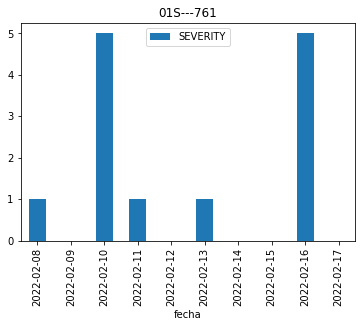

In [915]:
resumenSeries_un[resumenSeries_un['key']=='01S---761'][['SEVERITY']].plot.bar(title='01S---761')

## Dias desde el último evento

In [916]:
resumenSeries

,NODEALIAS,CODALARM_2,fecha,SEVERITY,key
0,- CAMPO AZUL,3229,2022-02-12,1.0,- CAMPO AZUL---3229
1,- CAMPO AZUL,3229,2022-02-17,1.0,- CAMPO AZUL---3229
2,001AC3FF5272,2934,2022-02-16,6.0,001AC3FF5272---2934
3,001AC3FF5272,2934,2022-02-17,6.0,001AC3FF5272---2934
4,012,1012,2022-02-16,6.0,012---1012
...,...,...,...,...,...
62789,ZVZ,913,2022-02-11,5.0,ZVZ---913
62790,ZVZ,969,2022-02-11,5.0,ZVZ---969
62791,ZVZ,975,2022-02-11,5.0,ZVZ---975
62792,ZVZ,1012,2022-02-16,1.0,ZVZ---1012


In [917]:
df_base=resumenSeries[resumenSeries['fecha']<fecha_ini_etiqueta]

In [918]:
df_ultimo_dia=df_base.groupby('key')[['fecha']].max()

In [919]:
from datetime import date
date.today()

datetime.date(2022, 2, 24)

In [920]:
df_ultimo_dia.dtypes

fecha    object
dtype: object

In [921]:
df_ultimo_dia['dias_ultimo_evento']=fecha_ini_etiqueta-df_ultimo_dia['fecha']

In [922]:
df_ultimo_dia['dias_ultimo_eventoV2']=df_ultimo_dia['dias_ultimo_evento'].astype('timedelta64[D]')

In [923]:
df_ultimo_dia

,fecha,dias_ultimo_evento,dias_ultimo_eventoV2
key,,,
- CAMPO AZUL---3229,2022-02-12,3 days,3.0
015---1012,2022-02-14,1 days,1.0
01S---761,2022-02-13,2 days,2.0
01S---827,2022-02-11,4 days,4.0
01S---893,2022-02-11,4 days,4.0
...,...,...,...
ZVZ---904,2022-02-11,4 days,4.0
ZVZ---913,2022-02-11,4 days,4.0
ZVZ---9332,2022-02-11,4 days,4.0


In [924]:
df_ultimo_dia['fecha'].max()

datetime.date(2022, 2, 14)

## Construccion Tabla input

In [925]:
### Etiquetas
X_df=X_df.merge(df_etiquetas[['output']], left_index=True, right_index=True, how='left')
X_df

,NODO,code,0,1,2,3,4,output
key,,,,,,,,
- CAMPO AZUL---3229,- CAMPO AZUL,3229,NaN,NaN,NaN,NaN,NaN,1
001AC3FF5272---2934,001AC3FF5272,2934,NaN,NaN,NaN,NaN,NaN,1
012---1012,012,1012,NaN,NaN,NaN,NaN,NaN,1
015---1012,015,1012,NaN,NaN,NaN,NaN,NaN,0
01S---761,01S,761,2.0,2.0,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...
ZVZ---904,ZVZ,904,NaN,NaN,NaN,NaN,NaN,0
ZVZ---913,ZVZ,913,NaN,NaN,NaN,NaN,NaN,0
ZVZ---9332,ZVZ,9332,NaN,NaN,NaN,NaN,NaN,0


In [926]:
X_df.fillna(0,inplace=True)

In [927]:
### Ultimo día
X_df=X_df.merge(df_ultimo_dia[['dias_ultimo_eventoV2']], left_index=True, right_index=True, how='left')
X_df

,NODO,code,0,1,2,3,4,output,dias_ultimo_eventoV2
key,,,,,,,,,
- CAMPO AZUL---3229,- CAMPO AZUL,3229,0.0,0.0,0.0,0.0,0.0,1,3.0
001AC3FF5272---2934,001AC3FF5272,2934,0.0,0.0,0.0,0.0,0.0,1,NaN
012---1012,012,1012,0.0,0.0,0.0,0.0,0.0,1,NaN
015---1012,015,1012,0.0,0.0,0.0,0.0,0.0,0,1.0
01S---761,01S,761,2.0,2.0,0.0,0.0,0.0,1,2.0
...,...,...,...,...,...,...,...,...,...
ZVZ---904,ZVZ,904,0.0,0.0,0.0,0.0,0.0,0,4.0
ZVZ---913,ZVZ,913,0.0,0.0,0.0,0.0,0.0,0,4.0
ZVZ---9332,ZVZ,9332,0.0,0.0,0.0,0.0,0.0,0,4.0


In [928]:
X_df.fillna(1000,inplace=True)

In [929]:
X_df

,NODO,code,0,1,2,3,4,output,dias_ultimo_eventoV2
key,,,,,,,,,
- CAMPO AZUL---3229,- CAMPO AZUL,3229,0.0,0.0,0.0,0.0,0.0,1,3.0
001AC3FF5272---2934,001AC3FF5272,2934,0.0,0.0,0.0,0.0,0.0,1,1000.0
012---1012,012,1012,0.0,0.0,0.0,0.0,0.0,1,1000.0
015---1012,015,1012,0.0,0.0,0.0,0.0,0.0,0,1.0
01S---761,01S,761,2.0,2.0,0.0,0.0,0.0,1,2.0
...,...,...,...,...,...,...,...,...,...
ZVZ---904,ZVZ,904,0.0,0.0,0.0,0.0,0.0,0,4.0
ZVZ---913,ZVZ,913,0.0,0.0,0.0,0.0,0.0,0,4.0
ZVZ---9332,ZVZ,9332,0.0,0.0,0.0,0.0,0.0,0,4.0


In [930]:
# Validacion
X_df.describe()

,0,1,2,3,4,output,dias_ultimo_eventoV2
count,33129.000000,33129.000000,33129.000000,33129.0,33129.0,33129.000000,33129.000000
mean,0.316701,0.025627,0.000483,0.0,0.0,0.449304,244.696067
std,0.988969,0.253164,0.031076,0.0,0.0,0.497431,426.808904
min,0.000000,0.000000,0.000000,0.0,0.0,0.000000,1.000000
25%,0.000000,0.000000,0.000000,0.0,0.0,0.000000,2.000000
50%,0.000000,0.000000,0.000000,0.0,0.0,0.000000,5.000000
75%,0.000000,0.000000,0.000000,0.0,0.0,1.000000,7.000000
max,6.000000,4.000000,2.000000,0.0,0.0,1.000000,1000.000000


## Modelo LGBM
* Un modelo por codigo de alarma
* Codigos de alarmas con menos de 20 ejemplos (usar otro metodo de ES)

In [935]:
resumen_dias_code

,num_casos
CODALARM_2,
1012,11126
9332,7943
969,6967
2934,5137
891,5089
904,3925
9334,3905
827,3401
913,3118


In [936]:
X_df.describe()

,0,1,2,3,4,output,dias_ultimo_eventoV2
count,33129.000000,33129.000000,33129.000000,33129.0,33129.0,33129.000000,33129.000000
mean,0.316701,0.025627,0.000483,0.0,0.0,0.449304,244.696067
std,0.988969,0.253164,0.031076,0.0,0.0,0.497431,426.808904
min,0.000000,0.000000,0.000000,0.0,0.0,0.000000,1.000000
25%,0.000000,0.000000,0.000000,0.0,0.0,0.000000,2.000000
50%,0.000000,0.000000,0.000000,0.0,0.0,0.000000,5.000000
75%,0.000000,0.000000,0.000000,0.0,0.0,1.000000,7.000000
max,6.000000,4.000000,2.000000,0.0,0.0,1.000000,1000.000000


In [937]:
code='2934'
X_df_espe=X_df[X_df['code']==code]
#Si actual = dias ultimo evento 0, no se toma en cuenta
X_df_espe=X_df_espe[X_df_espe['dias_ultimo_eventoV2']>1]
#No se tiene en cuenta series en cero,  estos casos no existiran en la predicción a futuro}
X_df_espe=X_df_espe[X_df_espe[0]>=2]

X_df_espe.set_index('NODO',inplace=True)
X_df_espe=X_df_espe.drop(columns=['code'])
X_df_espe

,0,1,2,3,4,output,dias_ultimo_eventoV2
NODO,,,,,,,
AHU,2.0,0.0,0.0,0.0,0.0,1,2.0
ANA,3.0,0.0,0.0,0.0,0.0,1,2.0
AVC,2.0,0.0,0.0,0.0,0.0,1,2.0
BVI,2.0,2.0,0.0,0.0,0.0,1,2.0
HI2,2.0,0.0,0.0,0.0,0.0,1,3.0
J2N,3.0,0.0,0.0,0.0,0.0,1,2.0
JDS,3.0,0.0,0.0,0.0,0.0,1,3.0
JVE,3.0,0.0,0.0,0.0,0.0,1,2.0
JZ2,2.0,0.0,0.0,0.0,0.0,1,5.0


In [938]:
pd.crosstab([X_df_espe[0],X_df_espe[1],X_df_espe[2],X_df_espe[3],X_df_espe[4],X_df_espe['dias_ultimo_eventoV2']],X_df_espe['output'])

output                                     1
0   1   2   3   4   dias_ultimo_eventoV2    
2.0 0.0 0.0 0.0 0.0 2.0                   11
                    3.0                   5 
                    5.0                   1 
    2.0 0.0 0.0 0.0 2.0                   3 
3.0 0.0 0.0 0.0 0.0 2.0                   9 
                    3.0                   4 
4.0 0.0 0.0 0.0 0.0 2.0                   3

<AxesSubplot:title={'center':'Nodo ARA - AURORA---2934'}, xlabel='fecha'>

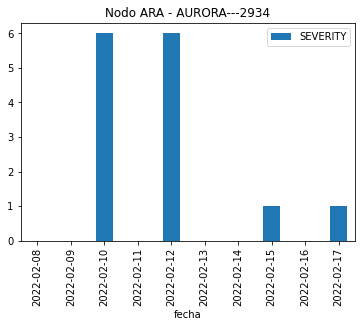

In [944]:
resumenSeries_un[resumenSeries_un['key']=='Nodo ARA - AURORA---2934'][['SEVERITY']].plot.bar(title='Nodo ARA - AURORA---2934')

In [ ]:
resumenSeries_un[resumenSeries_un['key']=='BVI---2934'][['SEVERITY']].plot.bar(title='BVI---2934')

In [940]:
#resumenSeries_un

In [941]:
y_df_espe=X_df_espe.pop('output')
y_df_espe

NODO
AHU                                     1
ANA                                     1
AVC                                     1
BVI                                     1
HI2                                     1
J2N                                     1
JDS                                     1
JVE                                     1
JZ2                                     1
L1S                                     1
LLS                                     1
MLZ                                     1
MMB                                     1
NODO L1S - SAN CARLOS 1                 1
Nodo 2VM - MARLEN 2                     1
Nodo AHU - ATAHUALPA                    1
Nodo ANA - CASTELLANA                   1
Nodo ARA - AURORA                       1
Nodo AVC.AVENIDA COLOMBIA SANTANDER     1
Nodo BVI - VIVERO                       1
Nodo CCS - ACACIAS                      1
Nodo GNT - GAITAN                       1
Nodo J2N - JARDIN 2                     1
Nodo JDS - SAN JUAN DE DIOS  

In [942]:
y_df_espe.value_counts()

1    36
Name: output, dtype: int64

In [756]:
X_df_espe

,0,1,2,3,4,dias_ultimo_eventoV2
NODO,,,,,,
02J,3.0,0.0,0.0,0.0,0.0,2.0
05J,3.0,0.0,0.0,0.0,0.0,2.0
0PO,3.0,0.0,0.0,0.0,0.0,2.0
102D,2.0,0.0,0.0,0.0,0.0,4.0
10E,4.0,0.0,0.0,0.0,0.0,2.0
...,...,...,...,...,...,...
YOPNSOPS01,4.0,0.0,0.0,0.0,0.0,3.0
YOPOOLPS01,3.0,0.0,0.0,0.0,0.0,2.0
YOPT1EPS01,3.0,0.0,0.0,0.0,0.0,2.0


In [757]:
#Train Test
X_train, X_test, y_train, y_test = train_test_split(X_df_espe, y_df_espe, test_size = 0.3, random_state = 86, shuffle= True)

In [758]:
#model=LGBMClassifier(n_estimators=500, learning_rate=0.01, reg_alpha=1, reg_lambda=3, objective ='multiclass',is_unbalance=True)
model=LGBMClassifier(n_estimators=1000, learning_rate=0.01, reg_alpha=1, reg_lambda=3)

In [759]:
model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)],eval_metric='auc', verbose=30, early_stopping_rounds=100)

[30]	training's auc: 0.636795	training's binary_logloss: 0.537627	valid_1's auc: 0.555556	valid_1's binary_logloss: 0.668054
[60]	training's auc: 0.636795	training's binary_logloss: 0.53232	valid_1's auc: 0.555556	valid_1's binary_logloss: 0.666212
[90]	training's auc: 0.636795	training's binary_logloss: 0.528859	valid_1's auc: 0.555556	valid_1's binary_logloss: 0.665673


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "


LGBMClassifier(learning_rate=0.01, n_estimators=1000, reg_alpha=1, reg_lambda=3)

In [760]:
pred_test=model.predict(X_test)
pred_test

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [761]:
#resumenSeries_un[resumenSeries_un['key']=='NF8---1012'][['SEVERITY']].plot.bar(title='NF8---1012')

In [762]:
y_test.value_counts()

0    69
1    36
Name: output, dtype: int64

In [763]:
X_test

,0,1,2,3,4,dias_ultimo_eventoV2
NODO,,,,,,
VU2,4.0,0.0,0.0,0.0,0.0,2.0
SRL,5.0,0.0,0.0,0.0,0.0,2.0
FTN13B,3.0,0.0,0.0,0.0,0.0,4.0
40J,3.0,0.0,0.0,0.0,0.0,2.0
BARTARPS01-VIP,3.0,0.0,0.0,0.0,0.0,4.0
...,...,...,...,...,...,...
MON20JPS01,3.0,0.0,0.0,0.0,0.0,2.0
BST,4.0,0.0,0.0,0.0,0.0,3.0
BHP2,2.0,0.0,0.0,0.0,0.0,2.0


In [764]:
pred_test.sum()/len(pred_test)

0.0

In [765]:
matrizConfucion = confusion_matrix(y_test, pred_test)
matrizConfucion

array([[69,  0],
       [36,  0]], dtype=int64)

In [766]:
roc_auc_score(y_test, pred_test)

0.5

In [767]:
roc_auc_score(y_train, model.predict(X_train))

0.5

In [768]:
confusion_matrix(y_train, model.predict(X_train))

array([[185,   0],
       [ 57,   0]], dtype=int64)

## Random forest

In [769]:
clf=RandomForestClassifier(n_estimators=100, criterion='entropy')

In [770]:
clf.fit(X_train,y_train)

C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


RandomForestClassifier(criterion='entropy')

In [771]:
pred_test=clf.predict(X_test)
pred_test

C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


array([0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [772]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

ValueError: Found input variables with inconsistent numbers of samples: [105, 82]

In [733]:
feature_imp = pd.Series(clf.feature_importances_,index=X_train.columns).sort_values(ascending=False)
feature_imp

0                       0.441316
dias_ultimo_eventoV2    0.427733
1                       0.130950
2                       0.000000
3                       0.000000
4                       0.000000
dtype: float64

In [735]:
roc_auc_score(y_test, pred_test)

0.6947368421052632

In [736]:
confusion_matrix(y_test, pred_test)

array([[15, 10],
       [12, 45]], dtype=int64)

### Loop sobre todos los tipos de Alarmas (más de 20 casos)

In [740]:
resumen_dias_code.reset_index()

,CODALARM_2,num_casos
0,1012,11126
1,9332,7943
2,969,6967
3,2934,5137
4,891,5089
5,904,3925
6,9334,3905
7,827,3401
8,913,3118
9,975,2301


In [794]:
X_df['code'].value_counts()

9332    5765
969     5283
1012    3696
9334    2750
827     2494
904     2382
891     1800
913     1467
894     1236
975     1209
761     1180
2934    579 
893     511 
833     489 
9333    384 
3304    333 
2       222 
4       210 
3229    198 
895     155 
981     140 
2793    123 
751     116 
949     87  
839     75  
12      47  
13      43  
1       42  
3151    20  
411     16  
3160    12  
429     11  
81      11  
4943    9   
3142    8   
3211    7   
402     6   
4656    4   
9080    3   
9100    2   
8469    2   
9107    1   
8466    1   
Name: code, dtype: int64

In [791]:
modelosClass={}
for cod in resumen_dias_code.reset_index()['CODALARM_2']:
    print(cod)
    dicModelo={}
    #preparacion
    code=cod
    X_df_espe=X_df[X_df['code']==str(code)]
    n_reg_ini=len(X_df_espe)    
    #Si actual = dias ultimo evento 0, no se toma en cuenta
    X_df_espe=X_df_espe[X_df_espe['dias_ultimo_eventoV2']>1]
    #No se tiene en cuenta series en cero,  estos casos no existiran en la predicción a futuro}
    X_df_espe=X_df_espe[X_df_espe[0]>=2]

    X_df_espe.set_index('NODO',inplace=True)
    X_df_espe=X_df_espe.drop(columns=['code'])
    #X_df_espe
    y_df_espe=X_df_espe.pop('output')
    #y_df_espe
    ## Validar si tiene más de 20 casos
    print("numReg",len(X_df_espe))
    if len(X_df_espe)>=20:
        #Train Test
        X_train, X_test, y_train, y_test = train_test_split(X_df_espe, y_df_espe, test_size = 0.3, random_state = 86, shuffle= True)        
        #Modelado
        dicModelo['modelo']=RandomForestClassifier(n_estimators=100, criterion='entropy')   
        dicModelo['modelo']=dicModelo['modelo'].fit(X_train,y_train)
        pred_test=dicModelo['modelo'].predict(X_test)
        #metricas
        dicModelo['accuracy']=metrics.accuracy_score(y_test, pred_test)
        if len(np.unique(pred_test))<2:
            dicModelo['auc']=0
        else:
            dicModelo['auc']=roc_auc_score(y_test, pred_test)   
        dicModelo['validacion']=1
    else:
        dicModelo['validacion']=0
    dicModelo['n_reg']=len(X_df_espe)
    dicModelo['n_reg_ini']=n_reg_ini
    # guardar en diccionario general
    modelosClass[cod]=dicModelo

1012
numReg 272


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


9332
numReg 347


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


969
numReg 289


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


2934
numReg 36


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


891
numReg 139


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


904
numReg 134


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


9334
numReg 174


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


827
numReg 151


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


913
numReg 60


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


975
numReg 39


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


761
numReg 53


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


894
numReg 53


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


833
numReg 25


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


3304
numReg 12
893
numReg 16
9333
numReg 30


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


4
numReg 30


C:\ProgramData\Anaconda3\envs\SeriesTiempoInter\lib\site-packages\sklearn\utils\validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


2
numReg 17
3229
numReg 10
981
numReg 2
895
numReg 7
2793
numReg 7
751
numReg 0
13
numReg 3
949
numReg 2
1
numReg 1
839
numReg 2
12
numReg 4
81
numReg 1
3151
numReg 0
9080
numReg 0
3211
numReg 1
4943
numReg 0
411
numReg 1
4656
numReg 3
3160
numReg 0
429
numReg 0
3142
numReg 0
8469
numReg 0
9100
numReg 0
402
numReg 0
8466
numReg 0
9107
numReg 0


In [792]:
pd.DataFrame.from_dict(modelosClass)[1:].T

,accuracy,auc,validacion,n_reg,n_reg_ini
1012,0.731707,0.694737,1,272,3696
9332,0.666667,0.533816,1,347,5765
969,0.770115,0.552612,1,289,5283
2934,1.0,0,1,36,579
891,0.642857,0.52963,1,139,1800
904,0.682927,0.604885,1,134,2382
9334,0.698113,0.607895,1,174,2750
827,0.782609,0.644444,1,151,2494
913,0.555556,0.584416,1,60,1467
975,0.583333,0.5,1,39,1209


# Fin LGBM

# Pronostico futuro

#####  Construcción Base

In [1011]:
df_base=resumenSeries_un.copy()
df_base=df_base.reset_index()

In [1012]:
df_distancias_nz=df_base[df_base['SEVERITY']!=0].reset_index()
df_distancias_nz['sig_event']=df_distancias_nz.groupby('key')['index'].shift(periods=-1)
df_distancias_nz['dias_inter_event']=df_distancias_nz['sig_event']-df_distancias_nz['index']
df_distancias_nz

,index,fecha,key,SEVERITY,NODO,code,sig_event,dias_inter_event
0,4,2022-02-12,- CAMPO AZUL---3229,1.0,- CAMPO AZUL,3229,9.0,5.0
1,9,2022-02-17,- CAMPO AZUL---3229,1.0,- CAMPO AZUL,3229,NaN,NaN
2,18,2022-02-16,001AC3FF5272---2934,6.0,001AC3FF5272,2934,19.0,1.0
3,19,2022-02-17,001AC3FF5272---2934,6.0,001AC3FF5272,2934,NaN,NaN
4,28,2022-02-16,012---1012,6.0,012,1012,NaN,NaN
...,...,...,...,...,...,...,...,...
62789,331243,2022-02-11,ZVZ---904,5.0,ZVZ,904,NaN,NaN
62790,331253,2022-02-11,ZVZ---913,5.0,ZVZ,913,NaN,NaN
62791,331263,2022-02-11,ZVZ---9332,5.0,ZVZ,9332,NaN,NaN
62792,331273,2022-02-11,ZVZ---969,5.0,ZVZ,969,NaN,NaN


In [1013]:
distancias_df=df_distancias_nz[df_distancias_nz['dias_inter_event']>1]
distancias_df

,index,fecha,key,SEVERITY,NODO,code,sig_event,dias_inter_event
0,4,2022-02-12,- CAMPO AZUL---3229,1.0,- CAMPO AZUL,3229,9.0,5.0
8,40,2022-02-08,01S---761,1.0,01S,761,42.0,2.0
10,43,2022-02-11,01S---761,1.0,01S,761,45.0,2.0
11,45,2022-02-13,01S---761,1.0,01S,761,48.0,3.0
13,50,2022-02-08,01S---827,1.0,01S,827,53.0,3.0
...,...,...,...,...,...,...,...,...
62741,331020,2022-02-08,ZS1---9332,4.0,ZS1,9332,331028.0,8.0
62743,331030,2022-02-08,ZS1---969,5.0,ZS1,969,331038.0,8.0
62762,331120,2022-02-08,ZTF---9334,4.0,ZTF,9334,331122.0,2.0
62780,331170,2022-02-08,ZUP---827,1.0,ZUP,827,331172.0,2.0


In [1014]:
distancias_df=distancias_df.sort_values(['key','fecha'],ascending=False)
distancias_df

,index,fecha,key,SEVERITY,NODO,code,sig_event,dias_inter_event
62782,331180,2022-02-08,ZUP---9334,1.0,ZUP,9334,331182.0,2.0
62780,331170,2022-02-08,ZUP---827,1.0,ZUP,827,331172.0,2.0
62762,331120,2022-02-08,ZTF---9334,4.0,ZTF,9334,331122.0,2.0
62743,331030,2022-02-08,ZS1---969,5.0,ZS1,969,331038.0,8.0
62741,331020,2022-02-08,ZS1---9332,4.0,ZS1,9332,331028.0,8.0
...,...,...,...,...,...,...,...,...
13,50,2022-02-08,01S---827,1.0,01S,827,53.0,3.0
11,45,2022-02-13,01S---761,1.0,01S,761,48.0,3.0
10,43,2022-02-11,01S---761,1.0,01S,761,45.0,2.0
8,40,2022-02-08,01S---761,1.0,01S,761,42.0,2.0


In [1015]:
distancias_df.drop(columns=['index','sig_event'],inplace=True)
distancias_df.reset_index(drop=True).reset_index()

,index,fecha,key,SEVERITY,NODO,code,dias_inter_event
0,0,2022-02-08,ZUP---9334,1.0,ZUP,9334,2.0
1,1,2022-02-08,ZUP---827,1.0,ZUP,827,2.0
2,2,2022-02-08,ZTF---9334,4.0,ZTF,9334,2.0
3,3,2022-02-08,ZS1---969,5.0,ZS1,969,8.0
4,4,2022-02-08,ZS1---9332,4.0,ZS1,9332,8.0
...,...,...,...,...,...,...,...
8735,8735,2022-02-08,01S---827,1.0,01S,827,3.0
8736,8736,2022-02-13,01S---761,1.0,01S,761,3.0
8737,8737,2022-02-11,01S---761,1.0,01S,761,2.0
8738,8738,2022-02-08,01S---761,1.0,01S,761,2.0


In [1016]:
#base
X_df=resumenSeries_un[['key','NODO','code']].drop_duplicates()
X_df.set_index('key',inplace=True)
X_df

,NODO,code
key,,
- CAMPO AZUL---3229,- CAMPO AZUL,3229
001AC3FF5272---2934,001AC3FF5272,2934
012---1012,012,1012
015---1012,015,1012
01S---761,01S,761
...,...,...
ZVZ---904,ZVZ,904
ZVZ---913,ZVZ,913
ZVZ---9332,ZVZ,9332


In [1017]:
#intervalos
for i in range(0,p_numeroEventos_historia):
    print(i)
    aux_df=distancias_df.groupby(['key']).nth(i)[['dias_inter_event']]
    aux_df.columns=[i]
    X_df=X_df.merge(aux_df[[i]], left_index=True, right_index=True, how='left')

0
1
2
3
4


In [1018]:
#ultimo dia
#df_base=resumenSeries[resumenSeries['fecha']<fecha_ini_etiqueta]
df_base=resumenSeries.copy()
df_ultimo_dia=df_base.groupby('key')[['fecha']].max()
df_ultimo_dia['dias_ultimo_evento']=max_fecha-df_ultimo_dia['fecha']  #cambiar a max_fecha
df_ultimo_dia['dias_ultimo_eventoV2']=df_ultimo_dia['dias_ultimo_evento'].astype('timedelta64[D]')

In [1019]:
#construccion tabla
#union intervalos
X_df.fillna(0,inplace=True)
### Ultimo día
X_df=X_df.merge(df_ultimo_dia[['dias_ultimo_eventoV2']], left_index=True, right_index=True, how='left')
X_df.fillna(1000,inplace=True)

In [1020]:
X_df

,NODO,code,0,1,2,3,4,dias_ultimo_eventoV2
key,,,,,,,,
- CAMPO AZUL---3229,- CAMPO AZUL,3229,5.0,0.0,0.0,0.0,0.0,0.0
001AC3FF5272---2934,001AC3FF5272,2934,0.0,0.0,0.0,0.0,0.0,0.0
012---1012,012,1012,0.0,0.0,0.0,0.0,0.0,1.0
015---1012,015,1012,0.0,0.0,0.0,0.0,0.0,3.0
01S---761,01S,761,3.0,2.0,2.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...
ZVZ---904,ZVZ,904,0.0,0.0,0.0,0.0,0.0,6.0
ZVZ---913,ZVZ,913,0.0,0.0,0.0,0.0,0.0,6.0
ZVZ---9332,ZVZ,9332,0.0,0.0,0.0,0.0,0.0,6.0


### Calculo predicción

In [1021]:
"""
#modelosClass={}
for cod in resumen_dias_code.reset_index()['CODALARM_2']:
    if modelosClass[cod]['validacion']==1:
        X_df_espe=X_df[X_df['code']==str(code)]
        
        
        modelosClass[cod]['modelo'].predict(X_test)
"""

"\n#modelosClass={}\nfor cod in resumen_dias_code.reset_index()['CODALARM_2']:\n    if modelosClass[cod]['validacion']==1:\n        X_df_espe=X_df[X_df['code']==str(code)]\n        \n        \n        modelosClass[cod]['modelo'].predict(X_test)\n"

In [1022]:

#groupedPred=X_df.groupby('key')
#group = groupedPred.get_group(g)

In [1023]:
### val construcción

In [1024]:
### fin val

In [1025]:
#for key,serie in X_df.iterrows():

In [1026]:
#X_df.dt

In [1027]:
X_df[X_df['code']==str(1012)]

,NODO,code,0,1,2,3,4,dias_ultimo_eventoV2
key,,,,,,,,
012---1012,012,1012,0.0,0.0,0.0,0.0,0.0,1.0
015---1012,015,1012,0.0,0.0,0.0,0.0,0.0,3.0
02J---1012,02J,1012,0.0,0.0,0.0,0.0,0.0,4.0
037---1012,037,1012,0.0,0.0,0.0,0.0,0.0,7.0
064---1012,064,1012,0.0,0.0,0.0,0.0,0.0,7.0
...,...,...,...,...,...,...,...,...
ZN3---1012,ZN3,1012,3.0,0.0,0.0,0.0,0.0,1.0
ZRR---1012,ZRR,1012,0.0,0.0,0.0,0.0,0.0,9.0
ZS1---1012,ZS1,1012,0.0,0.0,0.0,0.0,0.0,0.0


In [1028]:
X_df['dias_ultimo_eventoV2'].value_counts()

0.0    6117
1.0    4634
2.0    4134
4.0    3516
3.0    3038
9.0    2966
6.0    2567
7.0    2387
8.0    2008
5.0    1762
Name: dias_ultimo_eventoV2, dtype: int64

In [1029]:
finalPrediccionesFuturas = pd.DataFrame()

In [1041]:
i=0
for cod in resumen_dias_code.reset_index()['CODALARM_2']:
    X_df_espe=X_df[X_df['code']==str(cod)] 
    ##marcar los que no tienen pronostico
    print(cod, "tam:",len(X_df_espe))
    #Si actual = dias ultimo evento 0, no se toma en cuenta
    #X_df_espe=X_df_espe[X_df_espe['dias_ultimo_eventoV2']>1]
    X_df_espe['estado']=np.where(X_df_espe['dias_ultimo_eventoV2']>1,'valido','actual')
    #print(cod, "tam:",len(X_df_espe))
    #No se tiene en cuenta series en cero,  estos casos no existiran en la predicción a futuro
    #X_df_espe=X_df_espe[X_df_espe[0]>=2]
    X_df_espe['estado']=np.where(X_df_espe['estado']=='actual','actual',np.where(X_df_espe[0]>=2,'valido','solo un evento'))
    #print(cod, "tam:",len(X_df_espe))
    X_df_espe['class_model']=modelosClass[cod]['validacion']
    
    
    #filtro    
    X_df_espe_class=X_df_espe[(X_df_espe['class_model']==1)&(X_df_espe['estado']=='valido')]
    X_df_espe_actual=X_df_espe[(X_df_espe['class_model']==1)&(X_df_espe['estado']!='valido')]
    X_df_espe_reg=X_df_espe[X_df_espe['class_model']!=1]    
    
    
    if len(X_df_espe_class)>0:
        X_df_espe_class['prediccion']=modelosClass[cod]['modelo'].predict(X_df_espe_class.drop(columns=['NODO','code','class_model','estado']))
        #print(X_df_espe_class)
        #print(modelosClass[cod]['modelo'].predict_proba(X_df_espe_class.drop(columns=['NODO','code','class_model','estado','prediccion']))) 
        X_df_espe_class['probabilidad']=1-modelosClass[cod]['modelo'].predict_proba(X_df_espe_class.drop(columns=['NODO','code','class_model','estado','prediccion']))[:,0]     
    
    if len(X_df_espe_actual)>0:
        X_df_espe_actual['prediccion']=np.where(X_df_espe_actual['estado']=='actual',1,0)
        X_df_espe_actual['probabilidad']=np.where(X_df_espe_actual['estado']=='actual',1,0)        
        X_df_espe_actual['prediccion']=np.where(X_df_espe_actual['estado']=='solo un evento',0,X_df_espe_actual['prediccion'])
        X_df_espe_actual['probabilidad']=np.where(X_df_espe_actual['estado']=='solo un evento',0,X_df_espe_actual['probabilidad'])
        
    if len(X_df_espe_reg)>0:
        #X_df_espe_reg['prediccion']=int(X_df_espe_reg.drop(columns=['NODO','code','class_model','estado','dias_ultimo_eventoV2']).apply(lambda row: add(row), axis=1)[0])
        X_df_espe_reg['prediccion']=int(X_df_espe_reg.drop(columns=['NODO','code','class_model','estado','dias_ultimo_eventoV2']).apply(lambda row: pred_reg(row.values), axis=1)[0])
        X_df_espe_reg['prediccion']=np.where(X_df_espe_reg['prediccion']<=X_df_espe_reg['dias_ultimo_eventoV2'],0,X_df_espe_reg['prediccion'])
        X_df_espe_reg['probabilidad']=0.2    
    
    if i==0:
        finalPrediccionesFuturas=X_df_espe_class.copy()
        finalPrediccionesFuturas=finalPrediccionesFuturas.append(X_df_espe_reg.copy())
        i=i+1
    else :
        finalPrediccionesFuturas=finalPrediccionesFuturas.append(X_df_espe_class.copy())
        finalPrediccionesFuturas=finalPrediccionesFuturas.append(X_df_espe_reg.copy())    

1012 tam: 3696
9332 tam: 5765
969 tam: 5283
2934 tam: 579
891 tam: 1800
904 tam: 2382
9334 tam: 2750
827 tam: 2494
913 tam: 1467
975 tam: 1209
761 tam: 1180
894 tam: 1236
833 tam: 489
3304 tam: 333
893 tam: 511
9333 tam: 384
4 tam: 210
2 tam: 222
3229 tam: 198
981 tam: 140
895 tam: 155
2793 tam: 123
751 tam: 116
13 tam: 43
949 tam: 87
1 tam: 42
839 tam: 75
12 tam: 47
81 tam: 11
3151 tam: 20
9080 tam: 3
3211 tam: 7
4943 tam: 9
411 tam: 16
4656 tam: 4
3160 tam: 12
429 tam: 11
3142 tam: 8
8469 tam: 2
9100 tam: 2
402 tam: 6
8466 tam: 1
9107 tam: 1


In [1007]:
### Validación Reg
def pred_reg(X):
    model = SimpleExpSmoothing(X)
    model=model.fit(smoothing_level=.5)
    return model.forecast(1)

In [1039]:
X_df_espe_reg

,NODO,code,0,1,2,3,4,dias_ultimo_eventoV2,estado,class_model
key,,,,,,,,,,
0AC---3304,0AC,3304,0.0,0.0,0.0,0.0,0.0,0.0,actual,0
0AN---3304,0AN,3304,0.0,0.0,0.0,0.0,0.0,0.0,actual,0
0AS---3304,0AS,3304,0.0,0.0,0.0,0.0,0.0,0.0,actual,0
0CP---3304,0CP,3304,2.0,0.0,0.0,0.0,0.0,4.0,valido,0
0LQ---3304,0LQ,3304,8.0,0.0,0.0,0.0,0.0,0.0,actual,0
...,...,...,...,...,...,...,...,...,...,...
YMA---3304,YMA,3304,0.0,0.0,0.0,0.0,0.0,1.0,actual,0
YUMGBCPS01---3304,YUMGBCPS01,3304,0.0,0.0,0.0,0.0,0.0,2.0,solo un evento,0
YUMQPNPS01---3304,YUMQPNPS01,3304,0.0,0.0,0.0,0.0,0.0,9.0,solo un evento,0


In [1042]:
finalPrediccionesFuturas

,NODO,code,0,1,2,3,4,dias_ultimo_eventoV2,estado,class_model,prediccion,probabilidad
key,,,,,,,,,,,,
0SD---1012,0SD,1012,4.0,0.0,0.0,0.0,0.0,4.0,valido,1,0.0,0.260252
11B1---1012,11B1,1012,3.0,0.0,0.0,0.0,0.0,5.0,valido,1,0.0,0.298775
14A12D---1012,14A12D,1012,5.0,0.0,0.0,0.0,0.0,2.0,valido,1,1.0,0.648302
1BQ12D---1012,1BQ12D,1012,3.0,0.0,0.0,0.0,0.0,4.0,valido,1,0.0,0.276706
1EZ---1012,1EZ,1012,7.0,0.0,0.0,0.0,0.0,2.0,valido,1,1.0,0.648302
...,...,...,...,...,...,...,...,...,...,...,...,...
NODO TB1. - TIBABITA I---402,NODO TB1. - TIBABITA I,402,0.0,0.0,0.0,0.0,0.0,9.0,solo un evento,0,0.0,0.200000
"NODO VJ1,VJ12D,VJ13D,VJ14D.---402","NODO VJ1,VJ12D,VJ13D,VJ14D.",402,0.0,0.0,0.0,0.0,0.0,7.0,solo un evento,0,0.0,0.200000
SG4000 19D25D---402,SG4000 19D25D,402,0.0,0.0,0.0,0.0,0.0,9.0,solo un evento,0,0.0,0.200000


In [998]:
finalPrediccionesFuturas['prediccion'].value_counts()

0.0    2236
1.0    585 
Name: prediccion, dtype: int64

In [999]:
finalPrediccionesFuturas['estado'].value_counts()

valido            2961
solo un evento    1340
actual            725 
Name: estado, dtype: int64

In [1000]:
pd.crosstab(finalPrediccionesFuturas['prediccion'],finalPrediccionesFuturas['estado'])

estado,valido
prediccion,
0.0,2236
1.0,585


In [ ]:
## Prediccion casos extremos,  actual o solo un caso

In [1001]:
finalPrediccionesFuturas['prediccion']=np.where(finalPrediccionesFuturas['estado']=='actual',1,finalPrediccionesFuturas['prediccion'])
finalPrediccionesFuturas['probabilidad']=np.where(finalPrediccionesFuturas['estado']=='actual',1,finalPrediccionesFuturas['probabilidad'])

In [1002]:
finalPrediccionesFuturas['prediccion']=np.where(finalPrediccionesFuturas['estado']=='solo un evento',0,finalPrediccionesFuturas['prediccion'])
finalPrediccionesFuturas['probabilidad']=np.where(finalPrediccionesFuturas['estado']=='solo un evento',0,finalPrediccionesFuturas['probabilidad'])

In [1043]:
finalPrediccionesFuturas[finalPrediccionesFuturas['prediccion'].isnull()]

,NODO,code,0,1,2,3,4,dias_ultimo_eventoV2,estado,class_model,prediccion,probabilidad
key,,,,,,,,,,,,


### fin prediccion a futuro

In [723]:
grouped =resumenSeries_un.groupby('key')

In [ ]:
## Validacion
g='BOG3TFPS02--1012'
group = grouped.get_group(g) 
group

### ETS
* necesita más de 10 observaciones

In [ ]:
num_start=len(group['SEVERITY'])
#perPred=len(groupTest['MARCACIONES'])
perPred=5
periodos = 30 if int(num_start/2)>30 else (15 if int(num_start/2)>15 else int(num_start/2))
model = ETSModel(group['SEVERITY'].astype(float),seasonal_periods=periodos ,error="add",trend="add",seasonal="add", damped_trend=True,)
model = model.fit()

# Prophet

In [ ]:
model = Prophet()

In [ ]:
model.fit(group['SEVERITY'])

In [ ]:
forecast = model.predict(future)

## Croston 1

In [ ]:
fit_pred_croston = croston.fit_croston(group['SEVERITY'],10,'original')

In [ ]:
fit_pred_croston

In [ ]:
fit_pred_croston['croston_forecast']

# Croston 1.2. SBA

In [ ]:
fit_pred_croston = croston.fit_croston(group['SEVERITY'],10,'sba')

In [ ]:
fit_pred_croston['croston_forecast']

# Croston 1.2. SBJ

In [ ]:
fit_pred_croston = croston.fit_croston(group['SEVERITY'],10,'sbj')

In [ ]:
fit_pred_croston['croston_forecast']

# Croston 2

In [ ]:
#x=data series
#h=numer of periods to forecast
#alpha=simple exponential smoothing parameter

def croston_func(x,h,alpha=np.nan):
    
    print(alpha)
    
    if np.isnan(alpha):
        #print("validacion nan")  
        alpha=0.1
    y= x[x!=0].reset_index().reset_index()
    y['a'] = y['index'] - y['index'].shift(1)
    y.drop('index', axis=1, inplace=True)
    y= y.bfill()

    #fitteing simple exponential smoothing 

    #fit_non_zero=SimpleExpSmoothing(y.iloc[:,0]).fit(smoothing_level=alpha,optimized=False)
    #print("antes")
    #print(y['SEVERITY'])
    #print("alfa: ", alpha)
    fit_non_zero=SimpleExpSmoothing(y['SEVERITY']).fit(smoothing_level=alpha,optimized=False)
    #print("h: ",h)
    #print("prediccion:",fit_non_zero.forecast(h))

    #fit_inter_arrival=SimpleExpSmoothing(y.iloc[:,1]).fit(smoothing_level=alpha,optimized=False)
    fit_inter_arrival=SimpleExpSmoothing(y['a']).fit(smoothing_level=alpha,optimized=False)
    #fitted values for non-zero and interarrival time.

    non_zero_fitted=fit_non_zero.fittedvalues
    inter_arrival_fitted=fit_inter_arrival.fittedvalues
    final_predict=non_zero_fitted/inter_arrival_fitted

    # forecast values for h periods

    forecast_q=fit_non_zero.forecast(h)
    #print("forecast_q")
    #print(forecast_q)
    forecast_a=fit_inter_arrival.forecast(h)
    #print("forecast_a")
    #print(forecast_a)
    final_forecast=forecast_q/forecast_a
    return(final_forecast,final_predict)

In [ ]:
(p1,p2) =croston_func(group['SEVERITY'],10)

In [ ]:
p1

In [ ]:
p2